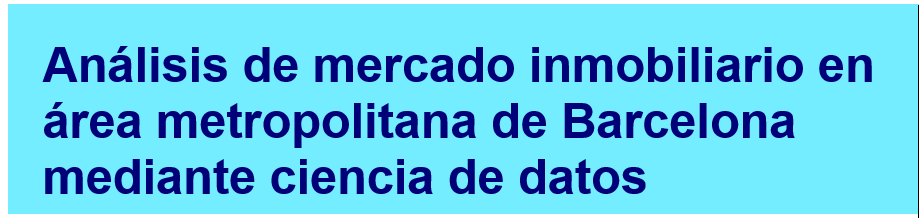

✍️ **Autor y Licencia**

**Autor:**      
Abel Mora Vázquez  
        
**Formación:**  
Graduado en Ciencia de Datos Aplicada (*Applied Data Science Degree*) –  [Universitat Oberta de Catalunya (UOC)](https://www.uoc.edu)  
Estudiante del Máster en Ciencia de Datos – [Universitat Oberta de Catalunya (UOC)](https://www.uoc.edu)  
Curso académico: 2025 – 2026  
        
**Licencia:**  
[Creative Commons CC BY 4.0](https://creativecommons.org/licenses/by/4.0/deed.es)

# 0. Carga de librerías y datasets

In [1]:
#Carga de librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from catboost import CatBoostRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.base import clone
import unicodedata
from IPython.display import HTML, display
from pathlib import Path

In [2]:
# Carga de dataset
df_poblacion = pd.read_csv("Tabla estadística poblacion.csv")
df_superficie = pd.read_csv("2021_superficie.csv")
df_criminalidad = pd.read_csv("tabla_criminalidad.csv")
df_movilidad = pd.read_csv("opendatabcn_llista-equipaments_transports-serveis-relacionats-csv.csv",encoding="utf-16",sep=",")
df_bus = pd.read_csv("ESTACIONS_BUS.csv")
df_trenes = pd.read_csv("TRANSPORTS.csv")
barcelona_habitaciones = pd.read_csv("barcelona_habitaciones.csv")
barcelona_habitaciones_pag1 = pd.read_csv("habitaciones_pagina1.csv")
barcelona_alquiler = pd.read_csv("barcelona_alquiler.csv")
barcelona_compraventa = pd.read_csv("barcelona_compraventa.csv")

# 1. Análisis Exploratorio

## 1.1 Dataset Población

In [3]:
# Dataset población
df_poblacion.head()

,Territorio,Tipo de territorio,01 ene 1997,01 ene 1998,01 ene 1999,01 ene 2000,01 ene 2001,01 ene 2002,01 ene 2003,01 ene 2004,...,01 nov 2024,01 dic 2024,01 ene 2025,01 feb 2025,01 mar 2025,01 abr 2025,01 may 2025,01 jun 2025,01 jul 2025,01 ago 2025
0,Barcelona,Municipi,1493663,1507026,1503840,1497436,1507121,1555426,1581813,1588617,...,1733123,1733476,1732066,1726285,1718620,1727051,1733130,1734267,1730640,1729627
1,Ciutat Vella,Districte,82270,84306,84540,84524,89003,98536,106627,109886,...,114952,115071,115311,114982,113856,115491,116453,116587,116136,116119
2,el Raval,Barri,34099,35145,35356,35333,37584,41898,45627,46257,...,49643,49691,49917,49692,49327,50232,50763,50948,50797,50912
3,el Barri Gòtic,Barri,13565,14127,14480,14807,16301,19835,22680,25089,...,27696,27859,27878,27916,27429,27726,27915,27849,27744,27632
4,la Barceloneta,Barri,14764,14910,14937,14911,15110,15507,15983,15958,...,14762,14729,14749,14602,14447,14595,14713,14718,14676,14672


In [4]:
df_poblacion.shape

(84, 137)

In [5]:
df_poblacion.dtypes

Territorio            object
Tipo de territorio    object
01 ene 1997            int64
01 ene 1998            int64
01 ene 1999            int64
                       ...  
01 abr 2025            int64
01 may 2025            int64
01 jun 2025            int64
01 jul 2025            int64
01 ago 2025            int64
Length: 137, dtype: object

In [6]:
df_poblacion.nunique()

Territorio            84
Tipo de territorio     4
01 ene 1997           84
01 ene 1998           84
01 ene 1999           84
                      ..
01 abr 2025           84
01 may 2025           84
01 jun 2025           84
01 jul 2025           84
01 ago 2025           84
Length: 137, dtype: int64

In [7]:
df_poblacion.isnull().sum()

Territorio            0
Tipo de territorio    0
01 ene 1997           0
01 ene 1998           0
01 ene 1999           0
                     ..
01 abr 2025           0
01 may 2025           0
01 jun 2025           0
01 jul 2025           0
01 ago 2025           0
Length: 137, dtype: int64

El dataset df_poblacion contiene una serie temporal con los datos de población de los distintos barrios de Barcelona. El dataset contiene 84 registros y 137 columnas. No existen datos nulos ni duplicados. No se va a trabajar con todas las variables ya que solo interesa tener los datos de población más recientes se procede a seleccionar el dato más reciente.

In [8]:
# Se filtra por tipo de territorio Districte y se selecciona el dato más actualizado de agosto de 2025
# Se crea df_distritos donde se almacenaran los datos para crear las tasas
df_distritos = df_poblacion[df_poblacion["Tipo de territorio"] == "Districte"]
# Se selecciona la columna de 01 ago 2025 y se renombra
df_distritos = df_distritos[["Territorio", "01 ago 2025"]].rename(columns={"01 ago 2025": "Poblacion"})
df_distritos

,Territorio,Poblacion
1,Ciutat Vella,116119
6,Eixample,277004
13,Sants-Montjuïc,196083
22,Les Corts,84025
26,Sarrià-Sant Gervasi,152946
33,Gràcia,126845
39,Horta-Guinardó,183038
51,Nou Barris,182912
73,Sant Martí,252797


Se observa que falta el distrito de sant andreu. Se busca en Territorio ya que Sant Andreu da nombre a barrio y a distrito

In [9]:
df_poblacion["Territorio"].unique()

array(['Barcelona', 'Ciutat Vella', 'el Raval', 'el Barri Gòtic',
       'la Barceloneta', 'Sant Pere, Santa Caterina i la Ribera',
       'Eixample', 'el Fort Pienc', 'la Sagrada Família',
       "la Dreta de l'Eixample", "l'Antiga Esquerra de l'Eixample",
       "la Nova Esquerra de l'Eixample", 'Sant Antoni', 'Sants-Montjuïc',
       'el Poble-sec', 'la Marina del Prat Vermell', 'la Marina de Port',
       'la Font de la Guatlla', 'Hostafrancs', 'la Bordeta',
       'Sants - Badal', 'Sants', 'Les Corts', 'les Corts',
       'la Maternitat i Sant Ramon', 'Pedralbes', 'Sarrià-Sant Gervasi',
       'Vallvidrera, el Tibidabo i les Planes', 'Sarrià',
       'les Tres Torres', 'Sant Gervasi - la Bonanova',
       'Sant Gervasi - Galvany', 'el Putxet i el Farró', 'Gràcia',
       'Vallcarca i els Penitents', 'el Coll', 'la Salut',
       'la Vila de Gràcia', "el Camp d'en Grassot i Gràcia Nova",
       'Horta-Guinardó', 'el Baix Guinardó', 'Can Baró', 'el Guinardó',
       "la Font d'en Fa

In [10]:
# Se selecciona fila de Sant Andreu en df_poblacion
fila_sant_andreu = df_poblacion[df_poblacion["Territorio"] == "Sant Andreu (Distrito)"]

# Se selecciona la población de agosto 2025
poblacion_sant_andreu = fila_sant_andreu["01 ago 2025"].values[0]
#Se crea df de sant andreu
df_sant_andreu = pd.DataFrame({"Territorio": ["Sant Andreu"],"Poblacion": [poblacion_sant_andreu]})

# Se añade a df_distritos
df_distritos = pd.concat([df_distritos, df_sant_andreu], ignore_index=True)
df_distritos

,Territorio,Poblacion
0,Ciutat Vella,116119
1,Eixample,277004
2,Sants-Montjuïc,196083
3,Les Corts,84025
4,Sarrià-Sant Gervasi,152946
5,Gràcia,126845
6,Horta-Guinardó,183038
7,Nou Barris,182912
8,Sant Martí,252797
9,Sant Andreu,157858


El dataset df_distritos se crea para concentrar los datos obtenidos de fuentes oficiales en este caso del Ajuntament de Barcelona através del portal de datos abiertos Open Data. En este dataset se irán incluyendo los datos que se necesitan para el trabajo.

## 1.2 Dataset superficie

In [11]:
# Dataset superficie
df_superficie.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,Superfície (ha)
0,2021,1,Ciutat Vella,1,el Raval,110.0
1,2021,1,Ciutat Vella,2,el Barri Gòtic,81.6
2,2021,1,Ciutat Vella,3,la Barceloneta,117.9
3,2021,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",111.0
4,2021,2,Eixample,5,el Fort Pienc,92.9


In [12]:
df_superficie.shape

(73, 6)

In [13]:
df_superficie.dtypes

Any                  int64
Codi_Districte       int64
Nom_Districte       object
Codi_Barri           int64
Nom_Barri           object
Superfície (ha)    float64
dtype: object

In [14]:
df_superficie.nunique()

Any                 1
Codi_Districte     10
Nom_Districte      10
Codi_Barri         73
Nom_Barri          73
Superfície (ha)    73
dtype: int64

In [15]:
df_superficie.isnull().sum()

Any                0
Codi_Districte     0
Nom_Districte      0
Codi_Barri         0
Nom_Barri          0
Superfície (ha)    0
dtype: int64

El dataset df_superficie contiene la superficie media en ha de los barrios de Barcelona. El dataset ofrece los datos del año 2021, dado que los municipios no suelen cambiar su superficia se acepta estos datos como válidos. Contiene 73 registros y 6 columnas. No existen valores nulos.

In [16]:
# Se selecciona codigo de distrito, nombre de distrito se agrupa por distrito y se obtiene la superficie de cada distrito
# Se agrupa por distrito y se suma la superficie
df_superficie = (df_superficie.groupby(["Codi_Districte", "Nom_Districte"])["Superfície (ha)"].sum().reset_index())
df_superficie

,Codi_Districte,Nom_Districte,Superfície (ha)
0,1,Ciutat Vella,420.5
1,2,Eixample,746.4
2,3,Sants-Montjuïc,2288.0
3,4,Les Corts,601.0
4,5,Sarrià-Sant Gervasi,1991.5
5,6,Gràcia,422.4
6,7,Horta-Guinardó,1191.9
7,8,Nou Barris,805.7
8,9,Sant Andreu,659.2
9,10,Sant Martí,1043.8


In [17]:
# Se convierte la superficie en ha a km²
df_superficie["Superficie (km2)"] = df_superficie["Superfície (ha)"] / 100
#Se elimina columna "Superfície (ha)"
df_superficie = df_superficie.drop(columns=["Superfície (ha)"])
df_superficie

,Codi_Districte,Nom_Districte,Superficie (km2)
0,1,Ciutat Vella,4.205
1,2,Eixample,7.464
2,3,Sants-Montjuïc,22.880
3,4,Les Corts,6.010
4,5,Sarrià-Sant Gervasi,19.915
5,6,Gràcia,4.224
6,7,Horta-Guinardó,11.919
7,8,Nou Barris,8.057
8,9,Sant Andreu,6.592
9,10,Sant Martí,10.438


In [18]:
# Se añade el codigo de distrito y la superficie al dataset df_distritos
df_distritos = df_distritos.merge(
    df_superficie[["Codi_Districte", "Nom_Districte", "Superficie (km2)"]],
    left_on="Territorio",
    right_on="Nom_Districte",
    how="left")
# Se elimina la columna duplicada de nombre de distrito
df_distritos.drop(columns=["Nom_Districte"], inplace=True)
df_distritos

,Territorio,Poblacion,Codi_Districte,Superficie (km2)
0,Ciutat Vella,116119,1,4.205
1,Eixample,277004,2,7.464
2,Sants-Montjuïc,196083,3,22.880
3,Les Corts,84025,4,6.010
4,Sarrià-Sant Gervasi,152946,5,19.915
5,Gràcia,126845,6,4.224
6,Horta-Guinardó,183038,7,11.919
7,Nou Barris,182912,8,8.057
8,Sant Martí,252797,10,10.438
9,Sant Andreu,157858,9,6.592


## 1.3 Dataset Criminalidad

In [19]:
# Dataset criminalidad
df_criminalidad.head(10)

,Territorio,Tipo de territorio,Categoría,2025,2025.1,2025.2,2025.3
0,Territorio,Tipo de territorio,Categoría,-,Hechos contra las personas,Hechos contra el patrimonio,Otros hechos
1,Ciutat Vella,Districte,Homicidio/asesinato,-,5,-,-
2,Ciutat Vella,Districte,Tentativa homicidio/asesinato,-,11,-,-
3,Ciutat Vella,Districte,Agresiones y abusos sexuales,-,191,-,-
4,Ciutat Vella,Districte,Otros delitos sexuales,-,15,-,-
5,Ciutat Vella,Districte,Lesiones,-,1193,-,-
6,Ciutat Vella,Districte,Amenazas,-,548,-,-
7,Ciutat Vella,Districte,Coacciones,-,101,-,-
8,Ciutat Vella,Districte,Otros hechos contra las personas,-,35,-,-
9,Ciutat Vella,Districte,Robo con violencia/intimidación,-,-,3527,-


In [20]:
df_criminalidad.shape

(255, 7)

In [21]:
df_criminalidad.dtypes

Territorio            object
Tipo de territorio    object
Categoría             object
2025                  object
2025.1                object
2025.2                object
2025.3                object
dtype: object

In [22]:
df_criminalidad.nunique()

Territorio            12
Tipo de territorio     2
Categoría             26
2025                   2
2025.1                65
2025.2                79
2025.3                66
dtype: int64

In [23]:
df_criminalidad.isnull().sum()

Territorio            0
Tipo de territorio    0
Categoría             0
2025                  0
2025.1                0
2025.2                0
2025.3                0
dtype: int64

El dataset df_criminalidad contiene 234 registros y 6 columnas. Si bien tiene un subapartado que describe las columnas. Esto es debido a que el dataset original disponible contiene una serie temporal. Debido al trabajo final que se va a realizar se ha filtrado antes de descargarlo por los datos más recientes de diciembre de 2025. Por lo que los datos no estarán actualizados en enero de 2026

In [24]:
# Se agrupan las columnas por tipos de delito
df_criminalidad = df_criminalidad.rename(columns={
    '2025.1': 'Delito_Personas',
    '2025.2': 'Delito_Patrimonio',
    '2025.3': 'Delito_Otros'
})
df_criminalidad = df_criminalidad.drop(0)
df_criminalidad = df_criminalidad.reset_index(drop=True)

df_criminalidad.head(10)

,Territorio,Tipo de territorio,Categoría,2025,Delito_Personas,Delito_Patrimonio,Delito_Otros
0,Ciutat Vella,Districte,Homicidio/asesinato,-,5,-,-
1,Ciutat Vella,Districte,Tentativa homicidio/asesinato,-,11,-,-
2,Ciutat Vella,Districte,Agresiones y abusos sexuales,-,191,-,-
3,Ciutat Vella,Districte,Otros delitos sexuales,-,15,-,-
4,Ciutat Vella,Districte,Lesiones,-,1193,-,-
5,Ciutat Vella,Districte,Amenazas,-,548,-,-
6,Ciutat Vella,Districte,Coacciones,-,101,-,-
7,Ciutat Vella,Districte,Otros hechos contra las personas,-,35,-,-
8,Ciutat Vella,Districte,Robo con violencia/intimidación,-,-,3527,-
9,Ciutat Vella,Districte,Robo con fuerza,-,-,1158,-


In [25]:
df_criminalidad["Territorio"].unique()

array(['Ciutat Vella', 'Eixample', 'Sants-Montjuïc', 'Les Corts',
       'Sarrià-Sant Gervasi', 'Gràcia', 'Horta-Guinardó', 'Nou Barris',
       'Sant Andreu', 'Sant Martí', 'Districte no informat'], dtype=object)

In [26]:
#Se eliminan los registros de districte no informat
df_criminalidad = df_criminalidad[df_criminalidad["Territorio"] != "Districte no informat"]
#Se elimina columna 2025
df_criminalidad = df_criminalidad.drop(columns=["2025"])
df_criminalidad = df_criminalidad.reset_index(drop=True)
df_criminalidad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234 entries, 0 to 233
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Territorio          234 non-null    object
 1   Tipo de territorio  234 non-null    object
 2   Categoría           234 non-null    object
 3   Delito_Personas     234 non-null    object
 4   Delito_Patrimonio   234 non-null    object
 5   Delito_Otros        234 non-null    object
dtypes: object(6)
memory usage: 11.1+ KB


In [27]:
# Se agrupa por distrito y categoría y se suman las columnas numéricas
df_criminalidad["Delito_Personas"] = pd.to_numeric(df_criminalidad["Delito_Personas"], errors="coerce")
df_criminalidad["Delito_Patrimonio"] = pd.to_numeric(df_criminalidad["Delito_Patrimonio"], errors="coerce")
df_criminalidad["Delito_Otros"] = pd.to_numeric(df_criminalidad["Delito_Otros"], errors="coerce")
# Se crea dataset recuento_delitos_25
recuento_delitos_25 = (
    df_criminalidad
    .groupby("Territorio")[["Delito_Personas", "Delito_Patrimonio", "Delito_Otros"]]
    .sum()
    .reset_index()
)
# Se añade el codigo del distrito
recuento_delitos_25 = recuento_delitos_25.merge(
    df_distritos[["Territorio", "Codi_Districte"]],
    on="Territorio",
    how="left"
)
recuento_delitos_25

,Territorio,Delito_Personas,Delito_Patrimonio,Delito_Otros,Codi_Districte
0,Ciutat Vella,2099.0,28707.0,1808.0,1
1,Eixample,2072.0,31137.0,1488.0,2
2,Gràcia,459.0,4594.0,267.0,6
3,Horta-Guinardó,864.0,5078.0,603.0,7
4,Les Corts,344.0,4913.0,446.0,4
5,Nou Barris,1157.0,5486.0,685.0,8
6,Sant Andreu,970.0,7679.0,548.0,9
7,Sant Martí,1503.0,15064.0,1184.0,10
8,Sants-Montjuïc,1705.0,13626.0,1233.0,3
9,Sarrià-Sant Gervasi,549.0,4946.0,370.0,5


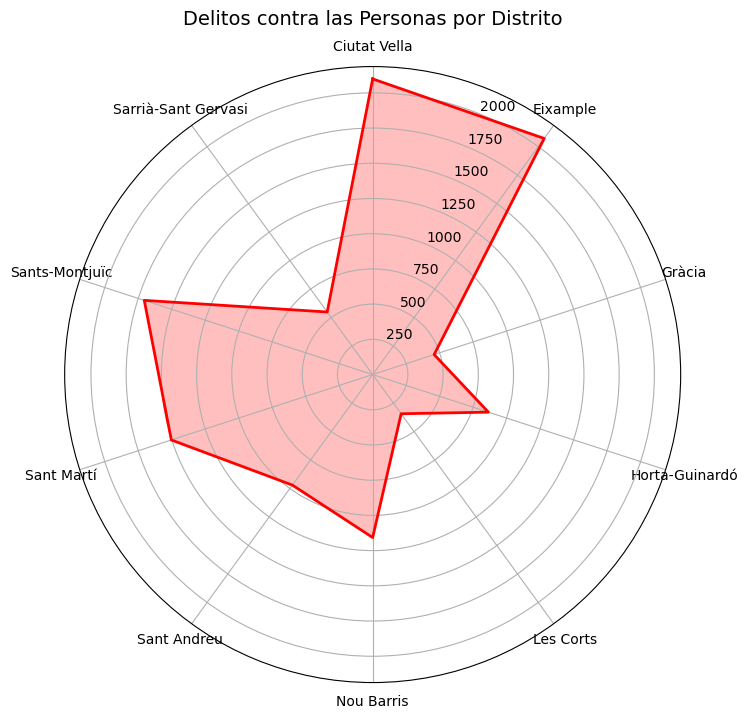

In [28]:
# Radar delitos contraa las personas por distrito
distritos = recuento_delitos_25["Territorio"].tolist()
personas = recuento_delitos_25["Delito_Personas"].tolist()
num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
personas += personas[:1]  
angles += angles[:1]      

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, personas, color='red', linewidth=2)
ax.fill(angles, personas, color='red', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Delitos contra las Personas por Distrito", fontsize=14, pad=30)

plt.show()

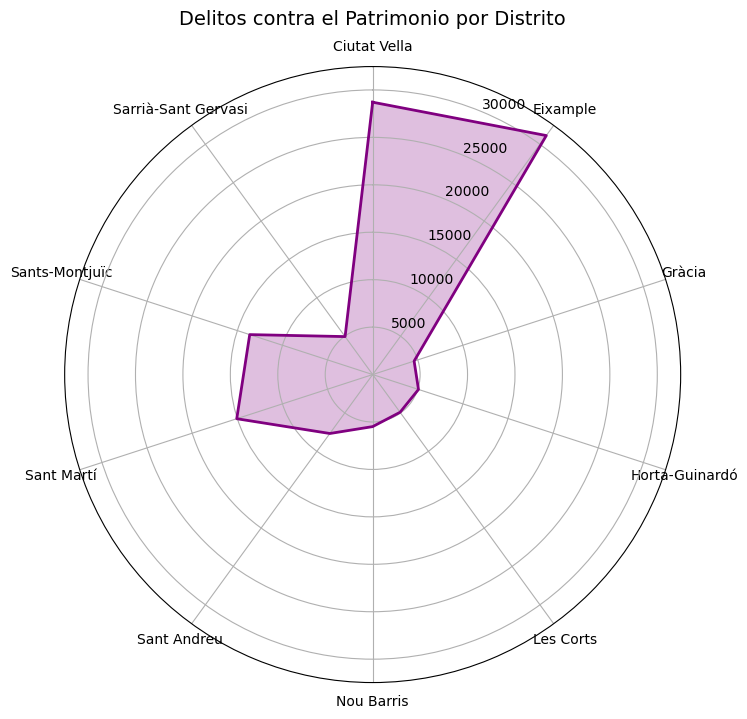

In [29]:
# Radar delitos contra el patrimonio por distrito 
patrimonio = recuento_delitos_25["Delito_Patrimonio"].tolist()

num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
patrimonio += patrimonio[:1] 
angles += angles[:1]      
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, patrimonio, color='purple', linewidth=2)
ax.fill(angles, patrimonio, color='purple', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Delitos contra el Patrimonio por Distrito", fontsize=14, pad=30)

plt.show()

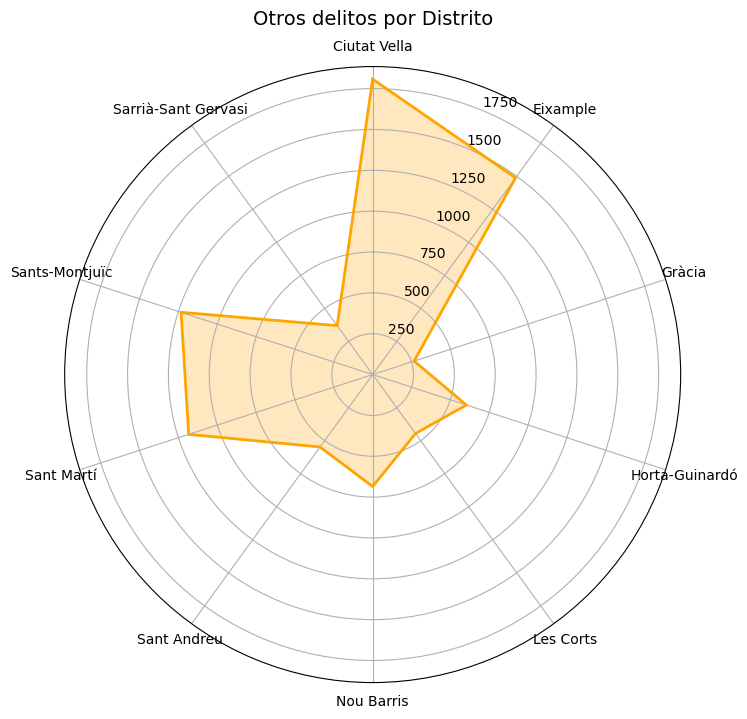

In [30]:
# Radar Otros delitos por distrito

otros = recuento_delitos_25["Delito_Otros"].tolist()

num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
otros += otros[:1]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, otros, color='orange', linewidth=2)
ax.fill(angles, otros, color='orange', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Otros delitos por Distrito", fontsize=14, pad=30)

plt.show()

In [31]:
# Se une df_distritos con recuento_delitos_25 por Codi_Districte
df_distritos = df_distritos.merge(
    recuento_delitos_25[["Codi_Districte", "Delito_Personas", "Delito_Patrimonio", "Delito_Otros"]],
    on="Codi_Districte",
    how="left"
)
df_distritos

,Territorio,Poblacion,Codi_Districte,Superficie (km2),Delito_Personas,Delito_Patrimonio,Delito_Otros
0,Ciutat Vella,116119,1,4.205,2099.0,28707.0,1808.0
1,Eixample,277004,2,7.464,2072.0,31137.0,1488.0
2,Sants-Montjuïc,196083,3,22.880,1705.0,13626.0,1233.0
3,Les Corts,84025,4,6.010,344.0,4913.0,446.0
4,Sarrià-Sant Gervasi,152946,5,19.915,549.0,4946.0,370.0
5,Gràcia,126845,6,4.224,459.0,4594.0,267.0
6,Horta-Guinardó,183038,7,11.919,864.0,5078.0,603.0
7,Nou Barris,182912,8,8.057,1157.0,5486.0,685.0
8,Sant Martí,252797,10,10.438,1503.0,15064.0,1184.0
9,Sant Andreu,157858,9,6.592,970.0,7679.0,548.0


## Tasas de criminalidad

In [32]:
# Se calcula la tasa de criminalidad dividiendo el numero de delitos de cada categoria entre el numero de habitantes y multiplicado por 1000 para obtener la tasa de criminalidad por cada 1000 habitantes en cada distrito
df_distritos["Tasa_C_Personas"] = (df_distritos["Delito_Personas"] / df_distritos["Poblacion"]) * 1000
df_distritos["Tasa_C_Patrimonio"] = (df_distritos["Delito_Patrimonio"] / df_distritos["Poblacion"]) * 1000
df_distritos["Tasa_C_Otros"] = (df_distritos["Delito_Otros"] / df_distritos["Poblacion"]) * 1000
df_distritos

,Territorio,Poblacion,Codi_Districte,Superficie (km2),Delito_Personas,Delito_Patrimonio,Delito_Otros,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros
0,Ciutat Vella,116119,1,4.205,2099.0,28707.0,1808.0,18.076284,247.220524,15.570234
1,Eixample,277004,2,7.464,2072.0,31137.0,1488.0,7.480036,112.406319,5.371764
2,Sants-Montjuïc,196083,3,22.880,1705.0,13626.0,1233.0,8.695297,69.490981,6.288153
3,Les Corts,84025,4,6.010,344.0,4913.0,446.0,4.094020,58.470693,5.307944
4,Sarrià-Sant Gervasi,152946,5,19.915,549.0,4946.0,370.0,3.589502,32.338211,2.419154
5,Gràcia,126845,6,4.224,459.0,4594.0,267.0,3.618590,36.217431,2.104931
6,Horta-Guinardó,183038,7,11.919,864.0,5078.0,603.0,4.720331,27.742873,3.294398
7,Nou Barris,182912,8,8.057,1157.0,5486.0,685.0,6.325446,29.992565,3.744970
8,Sant Martí,252797,10,10.438,1503.0,15064.0,1184.0,5.945482,59.589315,4.683600
9,Sant Andreu,157858,9,6.592,970.0,7679.0,548.0,6.144763,48.644985,3.471474


## 1.4 Dataset Movilidad

In [33]:
# Dataset movilidad
df_movilidad.columns = df_movilidad.columns.str.replace(r"^\ufeff", "", regex=True)
df_movilidad = df_movilidad.map(
    lambda x: x.replace("\ufeff", "") if isinstance(x, str) else x
)
df_movilidad.head(10)

,register_id,name,institution_id,institution_name,created,modified,addresses_roadtype_id,addresses_roadtype_name,addresses_road_id,addresses_road_name,...,secondary_filters_tree,secondary_filters_asia_id,geo_epgs_25831_x,geo_epgs_25831_y,geo_epgs_4326_lat,geo_epgs_4326_lon,estimated_dates,start_date,end_date,timetable
0,99400600762,"Zona de Càrrega i Descàrrega * C Radas, 7",NaN,NaN,2018-07-10T16:08:58+02:00,2025-04-15T16:43:56.606699+02:00,NaN,NaN,273400.0,C Radas,...,NaN,NaN,429860.820017,4.580664e+06,41.374439,2.161257,NaN,NaN,NaN,NaN
1,99400600763,Zona de Càrrega i Descàrrega * C Creu dels Mol...,NaN,NaN,2018-07-10T16:08:58+02:00,2025-04-15T16:43:56.626289+02:00,NaN,NaN,94707.0,C Creu dels Molers,...,NaN,NaN,429879.962857,4.580537e+06,41.373295,2.161501,NaN,NaN,NaN,NaN
2,99400600765,"Zona de Càrrega i Descàrrega * C Elkano, 51",NaN,NaN,2018-07-10T16:08:58+02:00,2025-04-15T16:43:56.621255+02:00,NaN,NaN,108007.0,C Elkano,...,NaN,NaN,429876.673879,4.580587e+06,41.373746,2.161455,NaN,NaN,NaN,NaN
3,99400600767,Zona de Càrrega i Descàrrega * Pl Margarida Xi...,NaN,NaN,2018-07-10T16:08:58+02:00,2025-04-15T16:43:56.633300+02:00,NaN,NaN,700685.0,Pl Margarida Xirgu,...,NaN,NaN,429468.688910,4.580284e+06,41.370984,2.156612,NaN,NaN,NaN,NaN
4,99400600769,"Zona de Càrrega i Descàrrega * C Font Honrada, 30",NaN,NaN,2018-07-10T16:08:58+02:00,2025-04-15T16:43:56.653910+02:00,NaN,NaN,129459.0,C Font Honrada,...,NaN,NaN,429415.929372,4.580525e+06,41.373146,2.155954,NaN,NaN,NaN,NaN
5,99400652409,Estació de Bicing 463 *Pedrosa,NaN,NaN,2020-04-30T20:00:14+02:00,2025-07-29T10:09:58.278819+02:00,NaN,NaN,250507.0,Carrer de la Pedrosa,...,NaN,NaN,431790.815000,4.588931e+06,41.449062,2.183402,NaN,NaN,NaN,NaN
6,99400652413,Estació de Bicing 469 *Sant Francesc Xavier,NaN,NaN,2020-04-30T20:12:45+02:00,2025-07-29T10:09:57.796468+02:00,NaN,NaN,301302.0,C Sant Francesc Xavier,...,NaN,NaN,431348.419029,4.588121e+06,41.441733,2.178198,NaN,NaN,NaN,NaN
7,99400652419,Estació de Bicing 473 *Pg. Fabra i Puig,NaN,NaN,2020-04-30T20:20:47+02:00,2025-07-29T10:09:57.412601+02:00,NaN,NaN,119003.0,Pg Fabra i Puig,...,NaN,NaN,430316.045107,4.587827e+06,41.438995,2.165875,NaN,NaN,NaN,NaN
8,99400602772,"Zona de Càrrega i Descàrrega * C Lepant, 392",NaN,NaN,2018-07-10T16:09:13+02:00,2025-04-15T16:38:56.799275+02:00,NaN,NaN,178308.0,C Lepant,...,NaN,NaN,430624.542784,4.584570e+06,41.409684,2.169941,NaN,NaN,NaN,NaN
9,99400602777,Zona de Càrrega i Descàrrega * C Cristóbal de ...,NaN,NaN,2018-07-10T16:09:13+02:00,2025-04-15T16:38:57.423326+02:00,NaN,NaN,94300.0,C Cristóbal de Moura,...,NaN,NaN,433662.790248,4.584700e+06,41.411113,2.206276,NaN,NaN,NaN,NaN


In [34]:
print(df_movilidad.columns.tolist())

['register_id', 'name', 'institution_id', 'institution_name', 'created', 'modified', 'addresses_roadtype_id', 'addresses_roadtype_name', 'addresses_road_id', 'addresses_road_name', 'addresses_start_street_number', 'addresses_end_street_number', 'addresses_neighborhood_id', 'addresses_neighborhood_name', 'addresses_district_id', 'addresses_district_name', 'addresses_zip_code', 'addresses_town', 'addresses_main_address', 'addresses_type', 'values_id', 'values_attribute_id', 'values_category', 'values_attribute_name', 'values_value', 'values_outstanding', 'values_description', 'secondary_filters_id', 'secondary_filters_name', 'secondary_filters_fullpath', 'secondary_filters_tree', 'secondary_filters_asia_id', 'geo_epgs_25831_x', 'geo_epgs_25831_y', 'geo_epgs_4326_lat', 'geo_epgs_4326_lon', 'estimated_dates', 'start_date', 'end_date', 'timetable']


In [35]:
df_movilidad.shape

(7943, 40)

In [36]:
df_movilidad.nunique()

register_id                      7872
name                             7281
institution_id                     79
institution_name                   79
created                          1017
modified                         7872
addresses_roadtype_id               0
addresses_roadtype_name             0
addresses_road_id                1509
addresses_road_name              1618
addresses_start_street_number     659
addresses_end_street_number        63
addresses_neighborhood_id          74
addresses_neighborhood_name        73
addresses_district_id              11
addresses_district_name            10
addresses_zip_code                 44
addresses_town                      2
addresses_main_address              2
addresses_type                      0
values_id                        1381
values_attribute_id                 9
values_category                     1
values_attribute_name               9
values_value                      746
values_outstanding                  2
values_descr

In [37]:
df_movilidad.isnull().sum()

register_id                         0
name                                0
institution_id                   7856
institution_name                 7856
created                             0
modified                            0
addresses_roadtype_id            7943
addresses_roadtype_name          7943
addresses_road_id                   8
addresses_road_name                 7
addresses_start_street_number      26
addresses_end_street_number      7850
addresses_neighborhood_id           6
addresses_neighborhood_name         8
addresses_district_id               6
addresses_district_name             6
addresses_zip_code                  9
addresses_town                      0
addresses_main_address              0
addresses_type                   7943
values_id                        6491
values_attribute_id              6491
values_category                  6491
values_attribute_name            6491
values_value                     6491
values_outstanding               6491
values_descr

In [38]:
print(df_movilidad["secondary_filters_name"].unique())

[nan 'Aparcaments' 'Lloguer de vehicles'
 'Aparcament amb places per bicicletes' 'Parades Taxi' 'Benzineres'
 "Estacions d'autobusos" "Punts d'ancoratge de bicicletes"
 'Punts de recàrrega de vehicles elèctrics' 'Escales mecàniques'
 'Estació marítima' 'WiFi BCN' 'Funicular' 'Telefèric']


In [39]:
categorias = ["Aparcaments","Parades Taxi","Benzineres","Punts de recàrrega de vehicles elèctrics",]

df_movilidad_distrito = (
    df_movilidad[df_movilidad["secondary_filters_name"].isin(categorias)]
    .groupby(["addresses_district_name", "secondary_filters_name"])
    .size()
    .reset_index(name="count")
    .sort_values(["addresses_district_name", "secondary_filters_name"])
)
df_movilidad_distrito

,addresses_district_name,secondary_filters_name,count
0,Ciutat Vella,Aparcaments,59
1,Ciutat Vella,Parades Taxi,31
2,Ciutat Vella,Punts de recàrrega de vehicles elèctrics,17
3,Eixample,Aparcaments,194
4,Eixample,Benzineres,8
5,Eixample,Parades Taxi,80
6,Eixample,Punts de recàrrega de vehicles elèctrics,17
7,Gràcia,Aparcaments,54
8,Gràcia,Benzineres,3
9,Gràcia,Parades Taxi,11


In [40]:
df_movilidad_distrito.nunique()

addresses_district_name    10
secondary_filters_name      4
count                      25
dtype: int64

In [41]:
df_movilidad_distrito = df_movilidad_distrito.rename(
    columns={"addresses_district_name": "Territorio",
             "secondary_filters_name": "NOM_CAPA"}
)[["Territorio", "NOM_CAPA", "count"]]
df_movilidad_distrito.head()

,Territorio,NOM_CAPA,count
0,Ciutat Vella,Aparcaments,59
1,Ciutat Vella,Parades Taxi,31
2,Ciutat Vella,Punts de recàrrega de vehicles elèctrics,17
3,Eixample,Aparcaments,194
4,Eixample,Benzineres,8


In [42]:
# Se siltra "Estació de Bicing"
df_bicing = df_movilidad[df_movilidad["name"].str.contains("Estació de Bicing", case=False, na=False)]

df_bicing[["register_id", "name", "addresses_district_name"]].head()


,register_id,name,addresses_district_name
5,99400652409,Estació de Bicing 463 *Pedrosa,Nou Barris
6,99400652413,Estació de Bicing 469 *Sant Francesc Xavier,Nou Barris
7,99400652419,Estació de Bicing 473 *Pg. Fabra i Puig,Nou Barris
25,99400652405,Estació de Bicing 457 *Granadella - Sas,Sant Andreu
27,99400652425,Estació de Bicing 479 *Pg. Fabra i Puig,Nou Barris


In [43]:
df_bicing_grouped = (
    df_bicing.groupby("addresses_district_name")
    .size()
    .reset_index(name="count")
)

df_bicing_grouped = df_bicing_grouped.rename(
    columns={"addresses_district_name": "Territorio",
             "estacion_bicing": "count"}
).assign(NOM_CAPA="Estació Bicing")[["Territorio", "NOM_CAPA", "count"]]

df_bicing_grouped

,Territorio,NOM_CAPA,count
0,Ciutat Vella,Estació Bicing,60
1,Eixample,Estació Bicing,102
2,Gràcia,Estació Bicing,17
3,Horta-Guinardó,Estació Bicing,31
4,Les Corts,Estació Bicing,32
5,Nou Barris,Estació Bicing,27
6,Sant Andreu,Estació Bicing,45
7,Sant Martí,Estació Bicing,85
8,Sants-Montjuïc,Estació Bicing,49
9,Sarrià-Sant Gervasi,Estació Bicing,32


## 1.5 Dataset Bus

In [44]:
# Dataset Bus
df_bus.head()

,CODI_CAPA,CAPA_GENERICA,NOM_CAPA,ED50_COORD_X,ED50_COORD_Y,ETRS89_COORD_X,ETRS89_COORD_Y,LONGITUD,LATITUD,EQUIPAMENT,DISTRICTE,BARRI,NOM_DISTRICTE,NOM_BARRI,ADRECA,TELEFON
0,K014,Transports i serveis relacionats,Autobusos diürns,425423.301,4584014.032,425331.416,4583813.083,2.106711,41.402393,BUS -130--,5,23,Sarrià-Sant Gervasi,Sarrià,NaN,NaN
1,K014,Transports i serveis relacionats,Autobusos diürns,431424.589,4589242.768,431332.650,4589041.769,2.177905,41.450021,BUS -127--,8,50,Nou Barris,les Roquetes,NaN,NaN
2,K014,Transports i serveis relacionats,Autobusos diürns,431141.119,4589147.753,431049.183,4588946.754,2.174522,41.449141,BUS -127--,8,50,Nou Barris,les Roquetes,NaN,NaN
3,K014,Transports i serveis relacionats,Autobusos diürns,426071.156,4581210.425,425979.264,4581009.501,2.114803,41.377203,BUS -54-157-D20-H8--,4,20,Les Corts,la Maternitat i Sant Ramon,NaN,NaN
4,K014,Transports i serveis relacionats,Autobusos diürns,425186.978,4585316.419,425095.096,4585115.458,2.103723,41.414101,BUS -128--,5,22,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",NaN,NaN


In [45]:
df_bus.shape

(3226, 16)

In [46]:
df_bus.dtypes

CODI_CAPA          object
CAPA_GENERICA      object
NOM_CAPA           object
ED50_COORD_X      float64
ED50_COORD_Y      float64
ETRS89_COORD_X    float64
ETRS89_COORD_Y    float64
LONGITUD          float64
LATITUD           float64
EQUIPAMENT         object
DISTRICTE           int64
BARRI               int64
NOM_DISTRICTE      object
NOM_BARRI          object
ADRECA             object
TELEFON           float64
dtype: object

In [47]:
df_bus.nunique()

CODI_CAPA            4
CAPA_GENERICA        1
NOM_CAPA             4
ED50_COORD_X      2423
ED50_COORD_Y      2423
ETRS89_COORD_X    2423
ETRS89_COORD_Y    2422
LONGITUD          2400
LATITUD           2395
EQUIPAMENT         767
DISTRICTE           10
BARRI               73
NOM_DISTRICTE       10
NOM_BARRI           73
ADRECA               3
TELEFON              0
dtype: int64

In [48]:
df_bus.isnull().sum()

CODI_CAPA            0
CAPA_GENERICA        0
NOM_CAPA             0
ED50_COORD_X         0
ED50_COORD_Y         0
ETRS89_COORD_X       0
ETRS89_COORD_Y       0
LONGITUD             0
LATITUD              0
EQUIPAMENT           0
DISTRICTE            0
BARRI                0
NOM_DISTRICTE        0
NOM_BARRI            0
ADRECA            3223
TELEFON           3226
dtype: int64

In [49]:
df_bus_distrito = (
    df_bus.groupby(["DISTRICTE","NOM_DISTRICTE", "NOM_CAPA"])
    .size()
    .reset_index(name="count")
    .sort_values(["NOM_DISTRICTE", "NOM_CAPA"])
)
df_bus_distrito.head(20)

,DISTRICTE,NOM_DISTRICTE,NOM_CAPA,count
0,1,Ciutat Vella,Autobusos diürns,112
1,1,Ciutat Vella,Autobusos nocturns,58
2,2,Eixample,Autobus a l'aeroport,5
3,2,Eixample,Autobusos diürns,252
4,2,Eixample,Autobusos nocturns,150
5,2,Eixample,Estacions d'autobusos,1
14,6,Gràcia,Autobusos diürns,163
15,6,Gràcia,Autobusos nocturns,45
16,7,Horta-Guinardó,Autobusos diürns,331
17,7,Horta-Guinardó,Autobusos nocturns,79


In [50]:
df_bus_distrito.nunique()

DISTRICTE        10
NOM_DISTRICTE    10
NOM_CAPA          4
count            23
dtype: int64

In [51]:
df_bus_distrito = df_bus_distrito.rename(
    columns={
        "DISTRICTE": "Codi_Districte",
        "NOM_DISTRICTE": "Territorio"
    }
)

## 1.6 Dataset trenes

In [52]:
# Dataset trenes
df_trenes.head()

,CODI_CAPA,CAPA_GENERICA,NOM_CAPA,ED50_COORD_X,ED50_COORD_Y,ETRS89_COORD_X,ETRS89_COORD_Y,LONGITUD,LATITUD,EQUIPAMENT,DISTRICTE,BARRI,NOM_DISTRICTE,NOM_BARRI,ADRECA,TELEFON
0,K004,Transports i serveis relacionats,Tren a l'aeroport,432343.180,4584819.321,432251.231,4584618.362,2.189397,41.410259,Tren AEROPORT - CLOT-,10.0,65.0,Sant Martí,el Clot,NaN,NaN
1,K002,Transports i serveis relacionats,Ferrocarrils Generalitat (FGC),427818.595,4583478.761,427726.688,4583277.816,2.135427,41.397791,FGC - BONANOVA-,5.0,26.0,Sarrià-Sant Gervasi,Sant Gervasi - Galvany,NaN,NaN
2,K002,Transports i serveis relacionats,Ferrocarrils Generalitat (FGC),428146.731,4584356.984,428054.821,4584156.031,2.139248,41.405731,FGC - EL PUTXET-,5.0,27.0,Sarrià-Sant Gervasi,el Putxet i el Farró,NaN,NaN
3,K001,Transports i serveis relacionats,Metro i línies urbanes FGC,432161.470,4584722.980,432069.523,4584522.022,2.187234,41.409376,Clot (Aragó / Meridiana)-,10.0,65.0,Sant Martí,el Clot,NaN,NaN
4,K001,Transports i serveis relacionats,Metro i línies urbanes FGC,431886.081,4587016.870,431794.137,4586815.891,2.183681,41.430013,Fabra i Puig (Avinguda Meridiana)-,9.0,60.0,Sant Andreu,Sant Andreu,NaN,NaN


In [53]:
df_trenes.shape

(684, 16)

In [54]:
df_trenes.dtypes

CODI_CAPA          object
CAPA_GENERICA      object
NOM_CAPA           object
ED50_COORD_X      float64
ED50_COORD_Y      float64
ETRS89_COORD_X    float64
ETRS89_COORD_Y    float64
LONGITUD          float64
LATITUD           float64
EQUIPAMENT         object
DISTRICTE         float64
BARRI             float64
NOM_DISTRICTE      object
NOM_BARRI          object
ADRECA             object
TELEFON            object
dtype: object

In [55]:
df_trenes.nunique()

CODI_CAPA           8
CAPA_GENERICA       1
NOM_CAPA            8
ED50_COORD_X      676
ED50_COORD_Y      676
ETRS89_COORD_X    676
ETRS89_COORD_Y    676
LONGITUD          673
LATITUD           673
EQUIPAMENT        657
DISTRICTE          10
BARRI              65
NOM_DISTRICTE      10
NOM_BARRI          65
ADRECA             14
TELEFON            10
dtype: int64

In [56]:
df_trenes.isnull().sum()

CODI_CAPA           0
CAPA_GENERICA       0
NOM_CAPA            0
ED50_COORD_X        0
ED50_COORD_Y        0
ETRS89_COORD_X      0
ETRS89_COORD_Y      0
LONGITUD            0
LATITUD             0
EQUIPAMENT          0
DISTRICTE         196
BARRI             196
NOM_DISTRICTE     196
NOM_BARRI         196
ADRECA            670
TELEFON           673
dtype: int64

In [57]:
df_trenes["NOM_CAPA"].unique()

array(["Tren a l'aeroport", 'Ferrocarrils Generalitat (FGC)',
       'Metro i línies urbanes FGC', 'RENFE', 'Tramvia', 'Funicular',
       'Estació marítima', 'Telefèric'], dtype=object)

In [58]:
# Se agrupa por distrito y nombre de capa
df_trenes_distrito = (
    df_trenes.groupby(["DISTRICTE","NOM_DISTRICTE", "NOM_CAPA"])
    .size()
    .reset_index(name="count")
    .sort_values(["NOM_DISTRICTE", "NOM_CAPA"])
)

df_trenes_distrito.head()

,DISTRICTE,NOM_DISTRICTE,NOM_CAPA,count
0,1.0,Ciutat Vella,Estació marítima,2
1,1.0,Ciutat Vella,Metro i línies urbanes FGC,24
2,1.0,Ciutat Vella,RENFE,1
3,1.0,Ciutat Vella,Telefèric,1
4,2.0,Eixample,Ferrocarrils Generalitat (FGC),7


In [59]:
df_trenes_distrito.nunique()

DISTRICTE        10
NOM_DISTRICTE    10
NOM_CAPA          8
count            18
dtype: int64

In [60]:
# Se renombra columnas
df_trenes_distrito = df_trenes_distrito.rename(
    columns={
        "DISTRICTE": "Codi_Districte",
        "NOM_DISTRICTE": "Territorio"
    }
)

# Se convierte Codi_Districte a entero
df_trenes_distrito["Codi_Districte"] = df_trenes_distrito["Codi_Districte"].astype(int)

df_trenes_distrito.head()

,Codi_Districte,Territorio,NOM_CAPA,count
0,1,Ciutat Vella,Estació marítima,2
1,1,Ciutat Vella,Metro i línies urbanes FGC,24
2,1,Ciutat Vella,RENFE,1
3,1,Ciutat Vella,Telefèric,1
4,2,Eixample,Ferrocarrils Generalitat (FGC),7


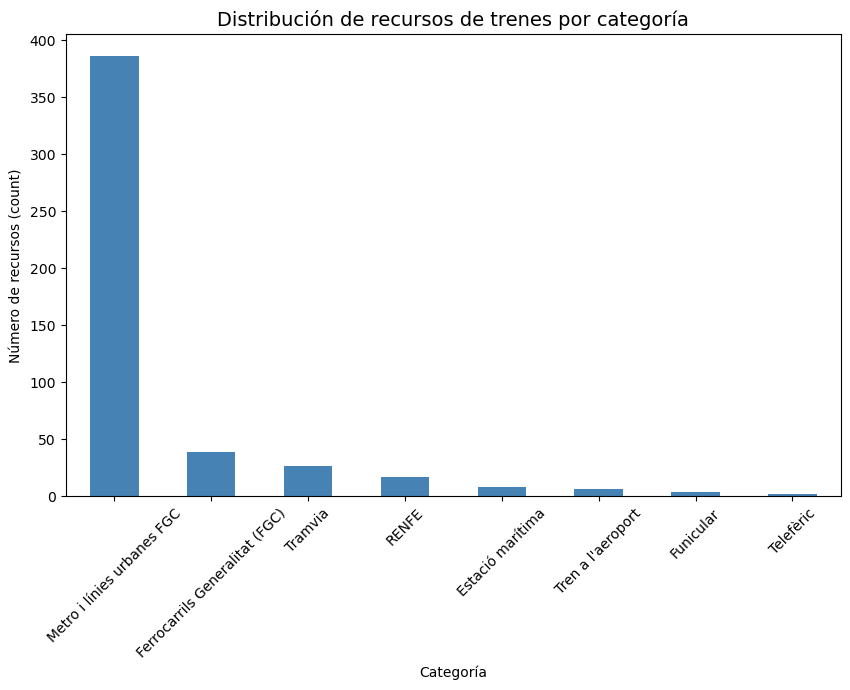

In [61]:
conteo_categorias = df_trenes_distrito.groupby("NOM_CAPA")["count"].sum().sort_values(ascending=False)

plt.figure(figsize=(10,6))
conteo_categorias.plot(kind="bar", color="steelblue")
plt.title("Distribución de recursos de trenes por categoría", fontsize=14)
plt.xlabel("Categoría")
plt.ylabel("Número de recursos (count)")
plt.xticks(rotation=45)
plt.show()

Se descartan teleferico funicular debido a su escasa representación Se agrupan ferrocarrils renfe estacio maritima y tren a l'aeroport como tren

In [62]:
# Agrupacion trenes
mapa = {
    "RENFE": "Tren",
    "Ferrocarrils Generalitat (FGC)": "Tren",
    "Estació marítima": "Tren",
    "Tren a l'aeroport": "Tren",
    "Metro i línies urbanes FGC": "Metro",
    "Tramvia": "Tranvia"
}

df_tren_grupo = (
    df_trenes_distrito[df_trenes_distrito["NOM_CAPA"].isin(mapa.keys())]
    .assign(Tipo=df_trenes_distrito["NOM_CAPA"].map(mapa))
    .groupby(["Territorio", "Tipo"])["count"]
    .sum()
    .unstack(fill_value=0)
    .reset_index()
)
df_tren_grupo.head()

Tipo,Territorio,Metro,Tranvia,Tren
0,Ciutat Vella,24,0,3
1,Eixample,93,1,16
2,Gràcia,15,0,2
3,Horta-Guinardó,35,0,0
4,Les Corts,21,9,0


In [63]:
mapa_distritos = {
    "Ciutat Vella": 1, "Eixample": 2, "Sants-Montjuïc": 3, "Les Corts": 4,
    "Sarrià-Sant Gervasi": 5, "Gràcia": 6, "Horta-Guinardó": 7,
    "Nou Barris": 8, "Sant Andreu": 9, "Sant Martí": 10
}

# Se añade Codi_Districte
df_bicing_grouped["Codi_Districte"] = df_bicing_grouped["Territorio"].map(mapa_distritos)
df_movilidad_distrito["Codi_Districte"] = df_movilidad_distrito["Territorio"].map(mapa_distritos)

df_movilidad_total = pd.concat([
    df_bus_distrito[["Codi_Districte","Territorio","NOM_CAPA","count"]],
    df_trenes_distrito[["Codi_Districte","Territorio","NOM_CAPA","count"]],
    df_bicing_grouped[["Codi_Districte","Territorio","NOM_CAPA","count"]],
    df_movilidad_distrito[["Codi_Districte","Territorio","NOM_CAPA","count"]]
], ignore_index=True)

In [64]:
df_movilidad_total.head(50)

,Codi_Districte,Territorio,NOM_CAPA,count
0,1,Ciutat Vella,Autobusos diürns,112
1,1,Ciutat Vella,Autobusos nocturns,58
2,2,Eixample,Autobus a l'aeroport,5
3,2,Eixample,Autobusos diürns,252
4,2,Eixample,Autobusos nocturns,150
5,2,Eixample,Estacions d'autobusos,1
6,6,Gràcia,Autobusos diürns,163
7,6,Gràcia,Autobusos nocturns,45
8,7,Horta-Guinardó,Autobusos diürns,331
9,7,Horta-Guinardó,Autobusos nocturns,79


In [65]:
df_bicing_grouped

,Territorio,NOM_CAPA,count,Codi_Districte
0,Ciutat Vella,Estació Bicing,60,1
1,Eixample,Estació Bicing,102,2
2,Gràcia,Estació Bicing,17,6
3,Horta-Guinardó,Estació Bicing,31,7
4,Les Corts,Estació Bicing,32,4
5,Nou Barris,Estació Bicing,27,8
6,Sant Andreu,Estació Bicing,45,9
7,Sant Martí,Estació Bicing,85,10
8,Sants-Montjuïc,Estació Bicing,49,3
9,Sarrià-Sant Gervasi,Estació Bicing,32,5


In [66]:
df_movilidad_total["NOM_CAPA"].unique()

array(['Autobusos diürns', 'Autobusos nocturns', "Autobus a l'aeroport",
       "Estacions d'autobusos", 'Estació marítima',
       'Metro i línies urbanes FGC', 'RENFE', 'Telefèric',
       'Ferrocarrils Generalitat (FGC)', 'Tramvia', "Tren a l'aeroport",
       'Funicular', 'Estació Bicing', 'Aparcaments', 'Parades Taxi',
       'Punts de recàrrega de vehicles elèctrics', 'Benzineres'],
      dtype=object)

In [67]:
df_movilidad_total.head()

,Codi_Districte,Territorio,NOM_CAPA,count
0,1,Ciutat Vella,Autobusos diürns,112
1,1,Ciutat Vella,Autobusos nocturns,58
2,2,Eixample,Autobus a l'aeroport,5
3,2,Eixample,Autobusos diürns,252
4,2,Eixample,Autobusos nocturns,150


## Tasa transporte

In [68]:
#Se crea Trans_priv y trans_publ para posteriormente calcular la tasa de movilidad de transporte publico y la tasa de transporte privado
privado = ["Aparcaments", "Punts de recàrrega de vehicles elèctrics", "Benzineres"]
publico = ["Autobusos diürns", "Autobusos nocturns", "Autobus a l'aeroport", "Estacions d'autobusos",
    "Metro i línies urbanes FGC", "RENFE", "Ferrocarrils Generalitat (FGC)", "Tramvia",
    "Tren a l'aeroport", "Estació marítima", "Estació Bicing", "Parades Taxi"

]

# Se agrupan los servicios que tienen que ver con transportes privados
df_priv = (
    df_movilidad_total[df_movilidad_total["NOM_CAPA"].isin(privado)]
    .groupby("Codi_Districte")["count"].sum()
    .reset_index()
    .rename(columns={"count": "Trans_Privado"})
)

# Se agrupan los servicios que tienen que ver con transportes públicos
df_pub = (
    df_movilidad_total[df_movilidad_total["NOM_CAPA"].isin(publico)]
    .groupby("Codi_Districte")["count"].sum()
    .reset_index()
    .rename(columns={"count": "Trans_Publico"})
)

# Se añade a df_distritos
df_distritos = df_distritos.merge(df_priv, on="Codi_Districte", how="left")
df_distritos = df_distritos.merge(df_pub, on="Codi_Districte", how="left")

# Se tratan los posibles valores faltantes
df_distritos[["Trans_Privado","Trans_Publico"]] = df_distritos[["Trans_Privado","Trans_Publico"]].fillna(0)

# Se calcula la tasa de movibilidad privada y pública dividiendo entre los km² del distrito
df_distritos["Tasa_Trans_Privado"] = df_distritos["Trans_Privado"] / df_distritos["Superficie (km2)"]
df_distritos["Tasa_Trans_Publico"] = df_distritos["Trans_Publico"] / df_distritos["Superficie (km2)"]

df_distritos.head()

,Territorio,Poblacion,Codi_Districte,Superficie (km2),Delito_Personas,Delito_Patrimonio,Delito_Otros,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Trans_Privado,Trans_Publico,Tasa_Trans_Privado,Tasa_Trans_Publico
0,Ciutat Vella,116119,1,4.205,2099.0,28707.0,1808.0,18.076284,247.220524,15.570234,76,288,18.073722,68.489893
1,Eixample,277004,2,7.464,2072.0,31137.0,1488.0,7.480036,112.406319,5.371764,219,700,29.340836,93.783494
2,Sants-Montjuïc,196083,3,22.880,1705.0,13626.0,1233.0,8.695297,69.490981,6.288153,64,582,2.797203,25.437063
3,Les Corts,84025,4,6.010,344.0,4913.0,446.0,4.094020,58.470693,5.307944,63,295,10.482529,49.084859
4,Sarrià-Sant Gervasi,152946,5,19.915,549.0,4946.0,370.0,3.589502,32.338211,2.419154,90,542,4.519207,27.215667


In [69]:
# Se agrupa los servicios de movilidad por distrito
df_servicios_mov = df_movilidad_total.groupby("Codi_Districte")["count"].sum().reset_index()
df_servicios_mov = df_servicios_mov.rename(columns={"count": "Total_Movilidad"})

# Se une con df_distritos
df_distritos = df_distritos.merge(df_servicios_mov, on="Codi_Districte", how="left")

# Se calcula la tasa de movilidad por km² en cada distrito. Se divide el numero de servicios entre los km² del distrito 
df_distritos["Tasa_Movilidad_Sup"] = df_distritos["Total_Movilidad"] / df_distritos["Superficie (km2)"]
df_distritos

,Territorio,Poblacion,Codi_Districte,Superficie (km2),Delito_Personas,Delito_Patrimonio,Delito_Otros,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Trans_Privado,Trans_Publico,Tasa_Trans_Privado,Tasa_Trans_Publico,Total_Movilidad,Tasa_Movilidad_Sup
0,Ciutat Vella,116119,1,4.205,2099.0,28707.0,1808.0,18.076284,247.220524,15.570234,76,288,18.073722,68.489893,365,86.801427
1,Eixample,277004,2,7.464,2072.0,31137.0,1488.0,7.480036,112.406319,5.371764,219,700,29.340836,93.783494,919,123.124330
2,Sants-Montjuïc,196083,3,22.880,1705.0,13626.0,1233.0,8.695297,69.490981,6.288153,64,582,2.797203,25.437063,648,28.321678
3,Les Corts,84025,4,6.010,344.0,4913.0,446.0,4.094020,58.470693,5.307944,63,295,10.482529,49.084859,358,59.567388
4,Sarrià-Sant Gervasi,152946,5,19.915,549.0,4946.0,370.0,3.589502,32.338211,2.419154,90,542,4.519207,27.215667,634,31.835300
5,Gràcia,126845,6,4.224,459.0,4594.0,267.0,3.618590,36.217431,2.104931,67,253,15.861742,59.895833,320,75.757576
6,Horta-Guinardó,183038,7,11.919,864.0,5078.0,603.0,4.720331,27.742873,3.294398,30,489,2.516990,41.026932,519,43.543921
7,Nou Barris,182912,8,8.057,1157.0,5486.0,685.0,6.325446,29.992565,3.744970,21,430,2.606429,53.369741,452,56.100285
8,Sant Martí,252797,10,10.438,1503.0,15064.0,1184.0,5.945482,59.589315,4.683600,82,579,7.855911,55.470397,661,63.326308
9,Sant Andreu,157858,9,6.592,970.0,7679.0,548.0,6.144763,48.644985,3.471474,37,323,5.612864,48.998786,360,54.611650


In [70]:
# Se pivota df_movilidad_total para integrarlo con df_distritos
df_mov_pivot = (
    df_movilidad_total
    .pivot_table(
        index="Codi_Districte",
        columns="NOM_CAPA",
        values="count",
        aggfunc="sum",
        fill_value=0
    )
    .reset_index()
)
df_mov_pivot.columns = [
    "Codi_Districte" if c == "Codi_Districte" else f"mov_{c}"
    for c in df_mov_pivot.columns
]
df_distritos = df_distritos.merge(
    df_mov_pivot,
    on="Codi_Districte",
    how="left"
)
mov_cols = [c for c in df_distritos.columns if c.startswith("mov_")]
df_distritos[mov_cols] = df_distritos[mov_cols].fillna(0)

In [71]:
df_distritos

,Territorio,Poblacion,Codi_Districte,Superficie (km2),Delito_Personas,Delito_Patrimonio,Delito_Otros,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,...,mov_Estació marítima,mov_Ferrocarrils Generalitat (FGC),mov_Funicular,mov_Metro i línies urbanes FGC,mov_Parades Taxi,mov_Punts de recàrrega de vehicles elèctrics,mov_RENFE,mov_Telefèric,mov_Tramvia,mov_Tren a l'aeroport
0,Ciutat Vella,116119,1,4.205,2099.0,28707.0,1808.0,18.076284,247.220524,15.570234,...,2,0,0,24,31,17,1,1,0,0
1,Eixample,277004,2,7.464,2072.0,31137.0,1488.0,7.480036,112.406319,5.371764,...,0,7,0,93,80,17,8,0,1,1
2,Sants-Montjuïc,196083,3,22.880,1705.0,13626.0,1233.0,8.695297,69.490981,6.288153,...,6,2,1,71,32,9,1,1,0,1
3,Les Corts,84025,4,6.010,344.0,4913.0,446.0,4.094020,58.470693,5.307944,...,0,0,0,21,24,9,0,0,9,0
4,Sarrià-Sant Gervasi,152946,5,19.915,549.0,4946.0,370.0,3.589502,32.338211,2.419154,...,0,28,2,1,31,12,0,0,0,0
5,Gràcia,126845,6,4.224,459.0,4594.0,267.0,3.618590,36.217431,2.104931,...,0,2,0,15,11,10,0,0,0,0
6,Horta-Guinardó,183038,7,11.919,864.0,5078.0,603.0,4.720331,27.742873,3.294398,...,0,0,0,35,13,6,0,0,0,0
7,Nou Barris,182912,8,8.057,1157.0,5486.0,685.0,6.325446,29.992565,3.744970,...,0,0,1,40,11,6,1,0,0,0
8,Sant Martí,252797,10,10.438,1503.0,15064.0,1184.0,5.945482,59.589315,4.683600,...,0,0,0,47,49,21,3,0,16,3
9,Sant Andreu,157858,9,6.592,970.0,7679.0,548.0,6.144763,48.644985,3.471474,...,0,0,0,39,11,8,3,0,0,1


In [72]:
df_distritos.columns

Index(['Territorio', 'Poblacion', 'Codi_Districte', 'Superficie (km2)',
       'Delito_Personas', 'Delito_Patrimonio', 'Delito_Otros',
       'Tasa_C_Personas', 'Tasa_C_Patrimonio', 'Tasa_C_Otros', 'Trans_Privado',
       'Trans_Publico', 'Tasa_Trans_Privado', 'Tasa_Trans_Publico',
       'Total_Movilidad', 'Tasa_Movilidad_Sup', 'mov_Aparcaments',
       'mov_Autobus a l'aeroport', 'mov_Autobusos diürns',
       'mov_Autobusos nocturns', 'mov_Benzineres', 'mov_Estacions d'autobusos',
       'mov_Estació Bicing', 'mov_Estació marítima',
       'mov_Ferrocarrils Generalitat (FGC)', 'mov_Funicular',
       'mov_Metro i línies urbanes FGC', 'mov_Parades Taxi',
       'mov_Punts de recàrrega de vehicles elèctrics', 'mov_RENFE',
       'mov_Telefèric', 'mov_Tramvia', 'mov_Tren a l'aeroport'],
      dtype='object')

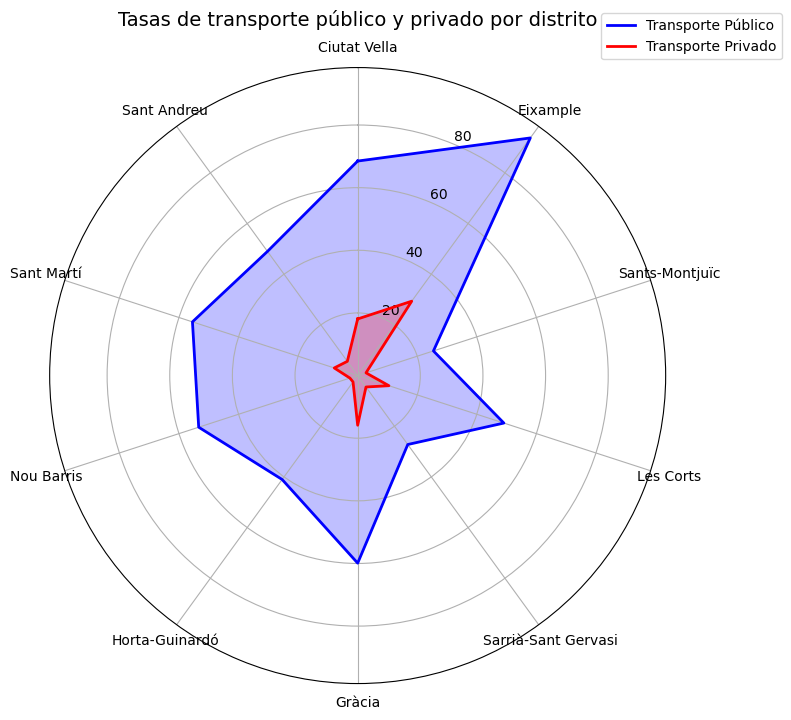

In [73]:
# Radar tasas de transporte publuico y privado por distrito
valores_pub = df_distritos["Tasa_Trans_Publico"].tolist()
valores_priv = df_distritos["Tasa_Trans_Privado"].tolist()

num_vars = len(df_distritos["Territorio"])
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

valores_pub += valores_pub[:1]
valores_priv += valores_priv[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

ax.plot(angles, valores_pub, color='blue', linewidth=2, label="Transporte Público")
ax.fill(angles, valores_pub, color='blue', alpha=0.25)

ax.plot(angles, valores_priv, color='red', linewidth=2, label="Transporte Privado")
ax.fill(angles, valores_priv, color='red', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), df_distritos["Territorio"])
ax.set_title("Tasas de transporte público y privado por distrito", fontsize=14, pad=30)
ax.legend(loc="upper right",bbox_to_anchor=(1.2, 1.1)

)

plt.show()

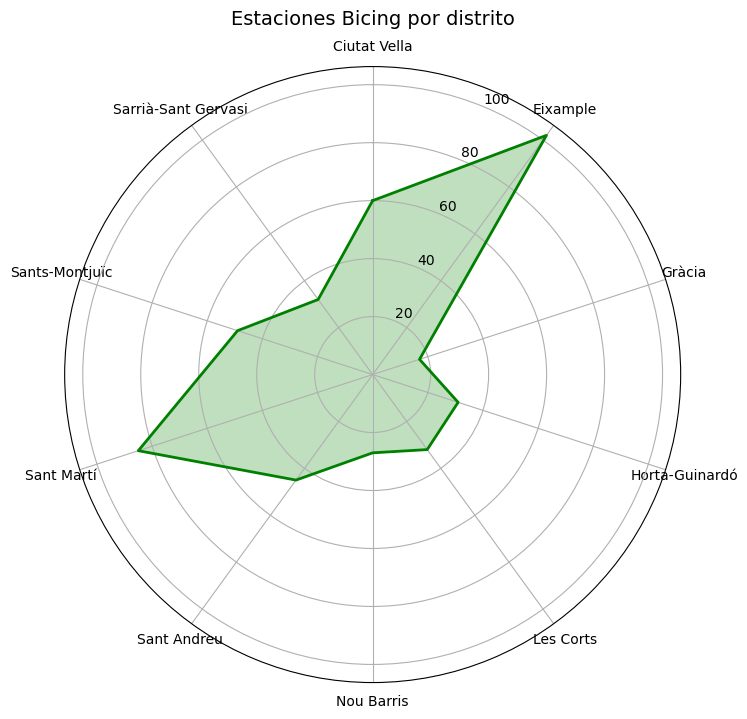

In [74]:
# Radar de estaciones bicing por distrito
valores_bicing = df_bicing_grouped["count"].tolist()
distritos = df_bicing_grouped["Territorio"].tolist()

num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
valores_bicing += valores_bicing[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, valores_bicing, color='green', linewidth=2)
ax.fill(angles, valores_bicing, color='green', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Estaciones Bicing por distrito", fontsize=14, pad=30)

plt.show()

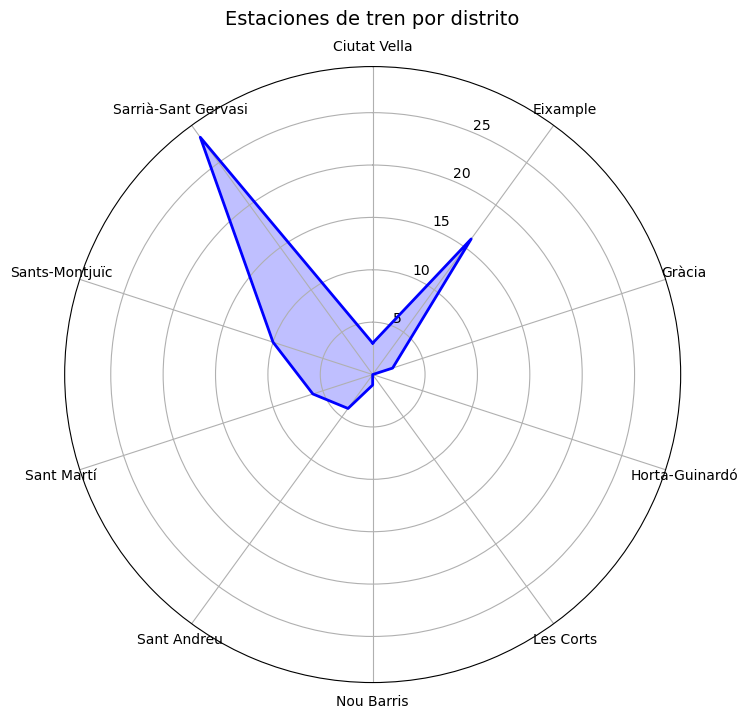

In [75]:
# Radar estaciones de trenes por distrito
valores_tren = df_tren_grupo["Tren"].tolist()
distritos = df_tren_grupo["Territorio"].tolist()

num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
valores_tren += valores_tren[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, valores_tren, color='blue', linewidth=2)
ax.fill(angles, valores_tren, color='blue', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Estaciones de tren por distrito", fontsize=14, pad=30)

plt.show()

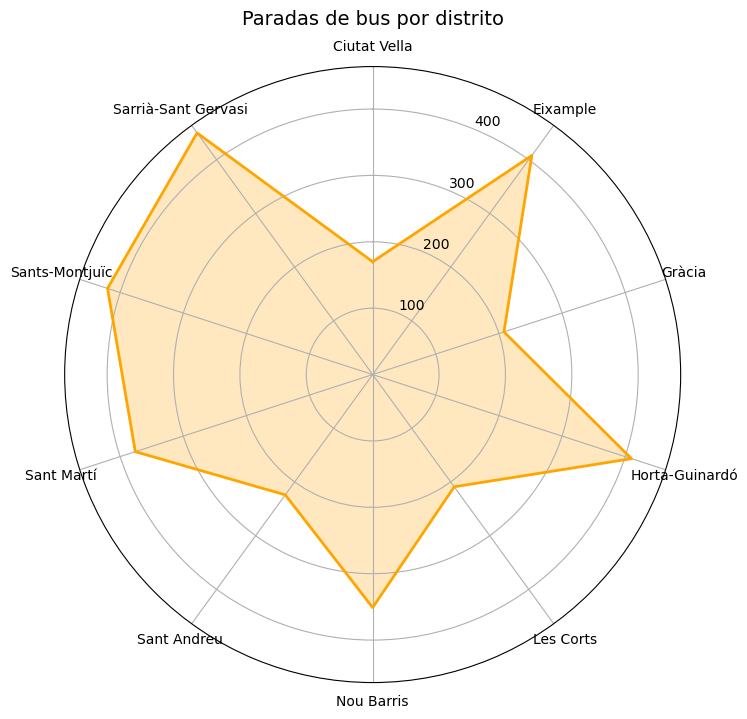

In [76]:
# Radar paradas de bus por distrito
valores_bus = df_bus_distrito.groupby("Territorio")["count"].sum().tolist()
distritos = df_bus_distrito["Territorio"].unique().tolist()

num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
valores_bus += valores_bus[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, valores_bus, color='orange', linewidth=2)
ax.fill(angles, valores_bus, color='orange', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Paradas de bus por distrito", fontsize=14, pad=30)

plt.show()

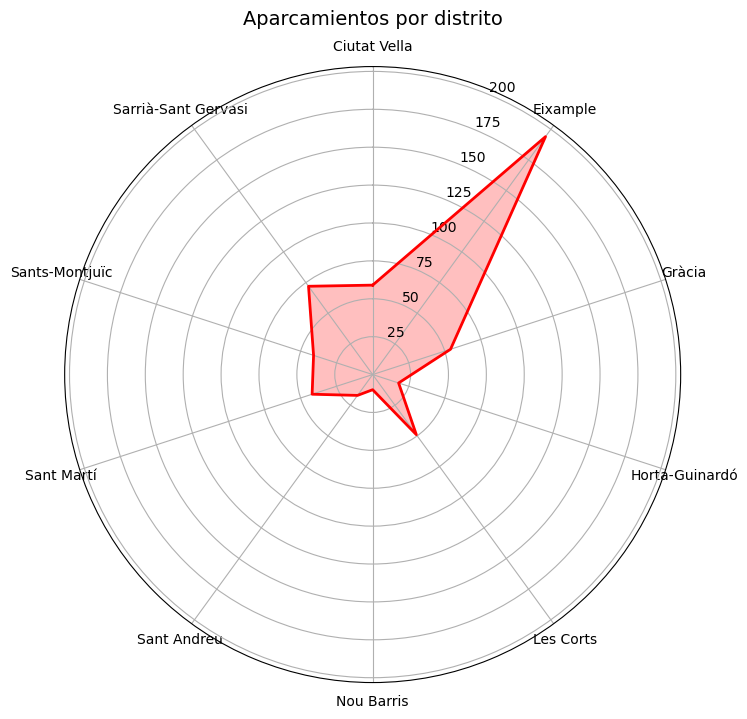

In [77]:
# Radar Aparcamientos por distrito
df_aparcamientos = df_movilidad_total[df_movilidad_total["NOM_CAPA"] == "Aparcaments"]

valores_aparc = df_aparcamientos.groupby("Territorio")["count"].sum().tolist()
distritos = df_aparcamientos["Territorio"].unique().tolist()

num_vars = len(distritos)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
valores_aparc += valores_aparc[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, valores_aparc, color='red', linewidth=2)
ax.fill(angles, valores_aparc, color='red', alpha=0.25)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), distritos)
ax.set_title("Aparcamientos por distrito", fontsize=14, pad=30)

plt.show()

## 1.7 Dataset distrito

In [78]:
# Se crea dataset valoración distritos
# ===============================
# Se añadirán todas las valoraciones de la encuesta

df_distrito = pd.DataFrame({
    "Territorio": [
        "Nou Barris",
        "Sant Martí",
        "Horta-Guinardó",
        "Les Corts",
        "Sants-Montjuïc",
        "BARCELONA", # media ciudad
        "Gràcia",
        "Sarrià-Sant Gervasi",
        "Eixample",
        "Sant Andreu",
        "Ciutat Vella"
    ]
})

df_distrito

,Territorio
0,Nou Barris
1,Sant Martí
2,Horta-Guinardó
3,Les Corts
4,Sants-Montjuïc
5,BARCELONA
6,Gràcia
7,Sarrià-Sant Gervasi
8,Eixample
9,Sant Andreu


In [79]:
# =======================================================
# Variable: recogida_basura
# Fuente: gráfico "RECOLLIDA D’ESCOMBRARIES - Anàlisi per territori"
# Descripción: valoración media de recogida de basuras por distrito (escala 0-10)
# =======================================================

df_distrito["recogida_basura"] = [
    7.5,  # Nou Barris
    7.4,  # Sant Martí
    7.4,  # Horta-Guinardó
    7.4,  # Les Corts
    7.4,  # Sants-Montjuïc
    7.2,  # Barcelona (mitjana ciutat)
    7.2,  # Gràcia
    7.2,  # Sarrià-Sant Gervasi
    7.1,  # Eixample
    6.9,  # Sant Andreu
    6.8   # Ciutat Vella
]

# =======================================================
# Variable: limpieza_calles
# Fuente: gráfico "NETEJA DELS CARRERS - Anàlisi per territori"
# Descripción: valoración media de la limpieza de las calles por distrito (escala 0-10)
# =======================================================

df_distrito["limpieza_calles"] = [
    6.9,  # Nou Barris
    6.8,  # Sant Martí
    6.8,  # Horta-Guinardó
    6.5,  # Les Corts
    6.5,  # Sants-Montjuïc
    6.7,  # Barcelona (mitjana ciutat)
    6.8,  # Gràcia
    6.7,  # Sarrià-Sant Gervasi
    6.4,  # Eixample
    6.7,  # Sant Andreu
    6.6   # Ciutat Vella
]

# =======================================================
# Variable: ruido
# Fuente: gráfico "SOROLL - Anàlisi per territori"
# Descripción: valoración media del nivel de ruido percibido por distrito (escala 0-10)
# =======================================================

df_distrito["ruido"] = [
    6.3,  # Nou Barris
    6.2,  # Sant Martí
    6.3,  # Horta-Guinardó
    6.0,  # Les Corts
    6.0,  # Sants-Montjuïc
    6.0,  # Barcelona (mitjana ciutat)
    5.8,  # Gràcia
    5.9,  # Sarrià-Sant Gervasi
    5.7,  # Eixample
    6.0,  # Sant Andreu
    5.5   # Ciutat Vella
]

# Valoración de la circulación por distrito
# (CIRCULACIÓ - Anàlisi per territori)

df_distrito["circulacion"] = [
    5.7,  # Nou Barris
    5.7,  # Sant Martí
    5.2,  # Horta-Guinardó
    5.0,  # Les Corts
    5.5,  # Sants-Montjuïc
    5.4,  # Barcelona
    5.2,  # Gràcia
    4.8,  # Sarrià-Sant Gervasi
    5.4,  # Eixample
    5.4,  # Sant Andreu
    5.6   # Ciutat Vella
]

# =======================================================
# Variable: aparcamiento
# Fuente: gráfico "APARCAMENT - Anàlisi per territori"
# Descripción: valoración media de la facilidad de aparcamiento por distrito (escala 0-10)
# =======================================================

df_distrito["aparcamiento"] = [
    4.0,  # Nou Barris
    4.7,  # Sant Martí
    3.9,  # Horta-Guinardó
    4.0,  # Les Corts
    4.4,  # Sants-Montjuïc
    4.2,  # Barcelona
    3.7,  # Gràcia
    3.8,  # Sarrià-Sant Gervasi
    4.2,  # Eixample
    4.0,  # Sant Andreu
    4.4   # Ciutat Vella
]

# =======================================================
# Variable: autobus
# Fuente: gráfico "AUTOBÚS - Anàlisi per territori"
# Descripción: valoración media del servicio de autobús en el distrito (escala 0-10)
# =======================================================

df_distrito["autobus"] = [
    7.6,  # Nou Barris
    7.5,  # Sant Martí
    7.1,  # Horta-Guinardó
    7.2,  # Les Corts
    7.4,  # Sants-Montjuïc
    7.3,  # Barcelona
    7.0,  # Gràcia
    7.1,  # Sarrià-Sant Gervasi
    7.3,  # Eixample
    7.5,  # Sant Andreu
    7.5   # Ciutat Vella
]

# =======================================================
# Variable: metro
# Fuente: gráfico "METRO - Anàlisi per territori"
# Descripción: valoración media del servicio de metro por distrito (escala 0-10)
# =======================================================

df_distrito["metro"] = [
    7.7,  # Nou Barris
    7.5,  # Sant Martí
    7.4,  # Horta-Guinardó
    7.3,  # Les Corts
    7.4,  # Sants-Montjuïc
    7.4,  # Barcelona
    7.2,  # Gràcia
    7.0,  # Sarrià-Sant Gervasi
    7.3,  # Eixample
    7.4,  # Sant Andreu
    7.6   # Ciutat Vella
]

# =======================================================
# Variable: tranvia
# Fuente: gráfico "TRAMVIA (TRAM, TRAMBAIX, TRAMBESÒS) - Anàlisi per territori"
# Descripción: valoración media del servicio de tranvía por distrito (escala 0-10)
# =======================================================

df_distrito["tranvia"] = [
    7.8,  # Nou Barris
    7.9,  # Sant Martí
    7.3,  # Horta-Guinardó
    7.8,  # Les Corts
    7.5,  # Sants-Montjuïc
    7.7,  # Barcelona
    7.6,  # Gràcia
    7.3,  # Sarrià-Sant Gervasi
    7.7,  # Eixample
    7.6,  # Sant Andreu
    7.9   # Ciutat Vella
]

# =======================================================
# Variable: bicing
# Fuente: gráfico "BICING - Anàlisi per territori"
# Descripción: valoración media del servicio de Bicing por distrito (escala 0-10)
# =======================================================

df_distrito["bicing"] = [
    6.5,  # Nou Barris
    6.6,  # Sant Martí
    6.4,  # Horta-Guinardó
    6.1,  # Les Corts
    6.3,  # Sants-Montjuïc
    6.4,  # Barcelona
    6.1,  # Gràcia
    6.0,  # Sarrià-Sant Gervasi
    6.4,  # Eixample
    6.5,  # Sant Andreu
    6.9   # Ciutat Vella
]

# =======================================================
# Variable: seguridad_barrio
# Fuente: gráfico "SEGURETAT CIUTADANA - BARRI - Anàlisi per territori"
# Descripción: valoración media de la seguridad ciudadana percibida en el distrito (escala 0-10)
# =======================================================

df_distrito["seguridad_barrio"] = [
    5.8,  # Nou Barris
    5.9,  # Sant Martí
    6.3,  # Horta-Guinardó
    6.6,  # Les Corts
    5.8,  # Sants-Montjuïc
    6.1,  # Barcelona
    6.7,  # Gràcia
    6.7,  # Sarrià-Sant Gervasi
    6.4,  # Eixample
    6.1,  # Sant Andreu
    4.8   # Ciutat Vella
]

# =======================================================
# Variable: cambio_pasado
# Fuente: diferencia entre "ha mejorado" y "ha empeorado"
# Descripción: índice neto del cambio percibido del barrio en el último año
# Valores positivos indican mejora; negativos, empeoramiento
# =======================================================

df_distrito["cambio_pasado"] = [
    4.3,    # Nou Barris
    15.1,   # Sant Martí
    5.5,    # Horta-Guinardó
    14.8,   # Les Corts
    4.1,    # Sants-Montjuïc
    6.9,    # Barcelona
    8.6,    # Gràcia
    9.2,    # Sarrià-Sant Gervasi
    8.0,    # Eixample
    16.1,   # Sant Andreu
    -28.2   # Ciutat Vella
]

# =======================================================
# Variable: cambio_futuro
# Fuente: diferencia entre "mejorará" y "empeorará"
# Descripción: índice neto de expectativas futuras del barrio
# Valores positivos indican expectativas de mejora; negativos, empeoramiento
# =======================================================

df_distrito["cambio_futuro"] = [
    25.9,  # Nou Barris
    36.2,  # Sant Martí
    36.9,  # Horta-Guinardó
    34.8,  # Les Corts
    29.2,  # Sants-Montjuïc
    30.9,  # Barcelona
    30.5,  # Gràcia
    34.3,  # Sarrià-Sant Gervasi
    27.0,  # Eixample
    40.4,  # Sant Andreu
    8.2    # Ciutat Vella
]

# =======================================================
# Problema més greu del barri (% de personas que lo señalan como principal problema)
# Fuente: tabla "PROBLEMA MÉS GREU DEL BARRI - Anàlisi per territori"
# =======================================================

# Inseguridad
# % de encuestados que señalan la inseguridad como principal problema del barrio
df_distrito["prob_inseguridad"] = [
    26.8,  # Nou Barris
    28.2,  # Sant Martí
    18.4,  # Horta-Guinardó
    16.4,  # Les Corts
    27.1,  # Sants-Montjuïc
    21.6,  # Barcelona
    6.2,   # Gràcia
    12.7,  # Sarrià-Sant Gervasi
    15.3,  # Eixample
    21.8,  # Sant Andreu
    45.6   # Ciutat Vella
]

# Limpieza
# % que señalan la limpieza como problema principal
df_distrito["prob_limpieza"] = [
    7.3,  # Nou Barris
    9.2,  # Sant Martí
    5.6,  # Horta-Guinardó
    10.8, # Les Corts
    12.3, # Sants-Montjuïc
    8.9,  # Barcelona
    7.1,  # Gràcia
    9.9,  # Sarrià-Sant Gervasi
    9.6,  # Eixample
    9.8,  # Sant Andreu
    6.6   # Ciutat Vella
]

# Acceso a la vivienda
df_distrito["prob_acceso_vivienda"] = [
    3.1,  # Nou Barris
    9.1,  # Sant Martí
    5.5,  # Horta-Guinardó
    6.9,  # Les Corts
    8.3,  # Sants-Montjuïc
    7.6,  # Barcelona
    13.9, # Gràcia
    8.4,  # Sarrià-Sant Gervasi
    8.0,  # Eixample
    8.7,  # Sant Andreu
    3.2   # Ciutat Vella
]

# Ruidos
df_distrito["prob_ruido"] = [
    4.8,  # Nou Barris
    4.0,  # Sant Martí
    5.3,  # Horta-Guinardó
    5.2,  # Les Corts
    6.7,  # Sants-Montjuïc
    6.0,  # Barcelona
    5.2,  # Gràcia
    7.3,  # Sarrià-Sant Gervasi
    9.5,  # Eixample
    3.9,  # Sant Andreu
    6.9   # Ciutat Vella
]

# Turismo
df_distrito["prob_turismo"] = [
    0.6,  # Nou Barris
    3.0,  # Sant Martí
    1.5,  # Horta-Guinardó
    0.6,  # Les Corts
    1.9,  # Sants-Montjuïc
    4.5,  # Barcelona
    12.7, # Gràcia
    0.9,  # Sarrià-Sant Gervasi
    11.1, # Eixample
    0.0,  # Sant Andreu
    11.2  # Ciutat Vella
]

# Civismo 
df_distrito["prob_civismo"] = [
    6.3,  # Nou Barris
    3.7,  # Sant Martí
    4.4,  # Horta-Guinardó
    2.3,  # Les Corts
    5.1,  # Sants-Montjuïc
    3.7,  # Barcelona
    2.6,  # Gràcia
    3.2,  # Sarrià-Sant Gervasi
    1.6,  # Eixample
    4.5,  # Sant Andreu
    3.9   # Ciutat Vella
]

# Transportes
df_distrito["prob_transporte"] = [
    1.9,  # Nou Barris
    1.9,  # Sant Martí
    6.3,  # Horta-Guinardó
    5.6,  # Les Corts
    2.6,  # Sants-Montjuïc
    3.1,  # Barcelona
    3.1,  # Gràcia
    7.7,  # Sarrià-Sant Gervasi
    1.5,  # Eixample
    2.5,  # Sant Andreu
    0.3   # Ciutat Vella
]

# Mantenimiento
df_distrito["prob_mantenimiento"] = [
    3.2,  # Nou Barris
    2.5,  # Sant Martí
    5.9,  # Horta-Guinardó
    2.6,  # Les Corts
    0.9,  # Sants-Montjuïc
    2.8,  # Barcelona
    4.7,  # Gràcia
    4.3,  # Sarrià-Sant Gervasi
    2.2,  # Eixample
    1.9,  # Sant Andreu
    0.3   # Ciutat Vella
]

# Aparcamiento
df_distrito["prob_aparcamiento"] = [
    3.7,  # Nou Barris
    1.7,  # Sant Martí
    3.5,  # Horta-Guinardó
    4.9,  # Les Corts
    1.9,  # Sants-Montjuïc
    2.6,  # Barcelona
    2.7,  # Gràcia
    4.4,  # Sarrià-Sant Gervasi
    1.1,  # Eixample
    3.9,  # Sant Andreu
    0.0   # Ciutat Vella
]

# Comercio
df_distrito["prob_comercio"] = [
    1.6,  # Nou Barris
    2.6,  # Sant Martí
    5.5,  # Horta-Guinardó
    2.0,  # Les Corts
    1.6,  # Sants-Montjuïc
    2.4,  # Barcelona
    2.3,  # Gràcia
    2.0,  # Sarrià-Sant Gervasi
    2.2,  # Eixample
    2.0,  # Sant Andreu
    1.0   # Ciutat Vella
]

# Problema inmigración
df_distrito["prob_inmigracion"] = [
    5.7,  # Nou Barris
    2.8,  # Sant Martí
    2.3,  # Horta-Guinardó
    1.0,  # Les Corts
    2.7,  # Sants-Montjuïc
    2.3,  # Barcelona
    1.1,  # Gràcia
    0.0,  # Sarrià-Sant Gervasi
    1.1,  # Eixample
    3.2,  # Sant Andreu
    2.7   # Ciutat Vella
]

# Urbanismo
df_distrito["prob_urbanismo"] = [
    2.3,  # Nou Barris
    1.2,  # Sant Martí
    5.3,  # Horta-Guinardó
    1.3,  # Les Corts
    1.1,  # Sants-Montjuïc
    1.7,  # Barcelona
    2.2,  # Gràcia
    0.8,  # Sarrià-Sant Gervasi
    0.8,  # Eixample
    1.0,  # Sant Andreu
    1.0   # Ciutat Vella
]

# =======================================================
# Indicador: El barrio es uno de los mejores de Barcelona
# Fuente: gráfico "EL BARRI ÉS UN DELS MILLORS RESPECTE A BARCELONA"
# % de personas que consideran su barrio entre los mejores
# =======================================================

df_distrito["barrio_mejor_que_bcn"] = [
    45.8,  # Nou Barris
    62.5,  # Sant Martí
    66.3,  # Horta-Guinardó
    86.4,  # Les Corts
    54.2,  # Sants-Montjuïc
    66.5,  # Barcelona
    83.8,  # Gràcia
    89.1,  # Sarrià-Sant Gervasi
    78.6,  # Eixample
    62.4,  # Sant Andreu
    38.4   # Ciutat Vella
]

# =======================================================
# Indicador: El barrio es uno de los peores de Barcelona
# Fuente: gráfico "EL BARRI ÉS UN DELS PITJORS RESPECTE A BARCELONA"
# % de personas que consideran su barrio entre los peores
# =======================================================

df_distrito["barrio_peor_que_bcn"] = [
    13.8,  # Nou Barris
    5.1,   # Sant Martí
    6.2,   # Horta-Guinardó
    1.3,   # Les Corts
    8.4,   # Sants-Montjuïc
    6.8,   # Barcelona
    1.9,   # Gràcia
    1.1,   # Sarrià-Sant Gervasi
    1.3,   # Eixample
    6.5,   # Sant Andreu
    30.5   # Ciutat Vella
]

# ============================================================
# Indicador: Porcentaje de población ocupada (cuenta propia + ajena)
# Fuente: "RESUM PER DISTRICTE (1/6)" - Situació Laboral
# ============================================================

df_distrito["trabajadores_total"] = [
    51.0,   # Nou Barris
    54.2,   # Sant Martí
    54.9,   # Horta-Guinardó
    51.2,   # Les Corts
    55.9,   # Sants-Montjuïc
    55.9,   # Barcelona 
    58.7,   # Gràcia
    56.9,   # Sarrià-Sant Gervasi
    59.8,   # Eixample
    53.5,   # Sant Andreu
    61.1    # Ciutat Vella
]

# ============================================================
# Nivel educativo básico (obligatorios finalizados + secundària general)
# Fuente: tabla "RESUM PER DISTRICTE (1/6) – ESTUDIS"
# ============================================================

df_distrito["educ_basico"] = [
    55.4,  # Nou Barris 
    48.1,  # Sant Martí 
    47.8,  # Horta-Guinardó 
    35.3,  # Les Corts 
    44.7,  # Sants-Montjuïc
    43.7,  # Barcelona 
    38.7,  # Gràcia 
    33.4,  # Sarrià-Sant Gervasi 
    36.2,  # Eixample 
    47.3,  # Sant Andreu 
    47.2   # Ciutat Vella 
]

# ============================================================
# Nivel de formación profesional (FP grau mitjà + grau superior)
# Fuente: tabla "RESUM PER DISTRICTE (1/6) – ESTUDIS"
# ============================================================

df_distrito["educ_fp"] = [
    22.5,  # Nou Barris 
    16.8,  # Sant Martí 
    19.2,  # Horta-Guinardó 
    11.6,  # Les Corts 
    18.3,  # Sants-Montjuïc 
    16.0,  # Barcelona 
    9.6,   # Gràcia 
    7.8,   # Sarrià-Sant Gervasi 
    14.1,  # Eixample 
    20.5,  # Sant Andreu 
    14.6   # Ciutat Vella 
]

# ============================================================
# Nivel de estudios superiores (universitarios + postuniversitarios)
# Fuente: tabla "RESUM PER DISTRICTE (1/6) – ESTUDIS"
# ============================================================

df_distrito["educ_univ"] = [
    16.2,  # Nou Barris 
    33.1,  # Sant Martí 
    30.4,  # Horta-Guinardó 
    49.8,  # Les Corts 
    34.7,  # Sants-Montjuïc 
    37.9,  # Barcelona 
    49.6,  # Gràcia 
    57.6,  # Sarrià-Sant Gervasi 
    48.8,  # Eixample 
    29.8,  # Sant Andreu 
    36.0   # Ciutat Vella 
]

# =======================================================
# Variable: nacionalidad_esp
# Fuente: "NACIONALITAT – Resum per districte"
# Descripción: suma de 'Espanyola sempre' + 'Espanyola adquirida'
# =======================================================

df_distrito["nacionalidad_esp"] = [
    78.6,  # Nou Barris
    75.6,  # Sant Martí
    80.5,  # Horta-Guinardó
    82.9,  # Les Corts
    73.9,  # Sants-Montjuïc
    75.3,  # Barcelona
    75.5,  # Gràcia
    82.2,  # Sarrià-Sant Gervasi
    71.1,  # Eixample
    81.6,  # Sant Andreu
    48.0   # Ciutat Vella
]

# =======================================================
# Variable: nacionalidad_ue
# Fuente: "NACIONALITAT – Resum per districte"
# Descripción: población con nacionalidad de la Unión Europea
# =======================================================

df_distrito["nacionalidad_ue"] = [
    3.3,  # Nou Barris
    10.1, # Sant Martí
    5.1,  # Horta-Guinardó
    5.1,  # Les Corts
    9.6,  # Sants-Montjuïc
    9.1,  # Barcelona
    12.6, # Gràcia
    6.7,  # Sarrià-Sant Gervasi
    12.8, # Eixample
    5.9,  # Sant Andreu
    19.8  # Ciutat Vella
]

# =======================================================
# Variable: nacionalidad_no_ue
# Fuente: "NACIONALITAT – Resum per districte"
# Descripción: población con nacionalidades no europeas
# =======================================================

df_distrito["nacionalidad_no_ue"] = [
    18.1, # Nou Barris
    14.3, # Sant Martí
    14.4, # Horta-Guinardó
    12.1, # Les Corts
    16.5, # Sants-Montjuïc
    15.6, # Barcelona
    11.9, # Gràcia
    11.2, # Sarrià-Sant Gervasi
    16.0, # Eixample
    12.4, # Sant Andreu
    32.1  # Ciutat Vella
]

# =======================================================
# Variable: propiedad
# Fuente: "Règim de tinença de l'habitatge" – RESUM PER DISTRICTE (6/6)
# Descripción: % de hogares en propiedad
# =======================================================

df_distrito["propiedad"] = [
    59.4,  # Nou Barris
    63.7,  # Sant Martí
    62.6,  # Horta-Guinardó
    55.4,  # Les Corts
    54.2,  # Sants-Montjuïc
    52.7,  # Barcelona
    46.6,  # Gràcia
    48.0,  # Sarrià-Sant Gervasi
    44.2,  # Eixample
    57.5,  # Sant Andreu
    28.0   # Ciutat Vella
]

# =======================================================
# Variable: alquiler
# Fuente: "Règim de tinença de l'habitatge" – RESUM PER DISTRICTE (6/6)
# Descripción: % de hogares en alquiler
# =======================================================

df_distrito["alquiler"] = [
    36.7,  # Nou Barris
    33.0,  # Sant Martí
    34.3,  # Horta-Guinardó
    40.3,  # Les Corts
    41.6,  # Sants-Montjuïc
    43.8,  # Barcelona
    51.4,  # Gràcia
    48.1,  # Sarrià-Sant Gervasi
    52.3,  # Eixample
    38.5,  # Sant Andreu
    68.4   # Ciutat Vella
]

# =======================================================
# Variable: Coche_si
# Fuente: "Bens de consum" – RESUM PER DISTRICTE (6/6)
# Descripción: % de hogares que disponen de coche
# =======================================================

df_distrito["coche_si"] = [
    49.0,  # Nou Barris
    48.2,  # Sant Martí
    48.5,  # Horta-Guinardó
    51.6,  # Les Corts
    44.0,  # Sants-Montjuïc
    44.8,  # Barcelona
    38.9,  # Gràcia
    54.5,  # Sarrià-Sant Gervasi
    41.2,  # Eixample
    49.2,  # Sant Andreu
    19.3   # Ciutat Vella
]

# =======================================================
# Variable: moto_si
# Fuente: "Mitjans de transports" – RESUM PER DISTRICTE (6/6)
# Descripción: % de hogares que disponen de moto
# =======================================================

df_distrito["moto_si"] = [
    14.0,  # Nou Barris
    16.3,  # Sant Martí
    19.8,  # Horta-Guinardó
    19.4,  # Les Corts
    16.2,  # Sants-Montjuïc
    17.4,  # Barcelona
    18.9,  # Gràcia
    28.7,  # Sarrià-Sant Gervasi
    15.7,  # Eixample
    12.5,  # Sant Andreu
    15.8   # Ciutat Vella
]

# =======================================================
# Variable: ingresos_mensuales
# Fuente: "Ingressos mensuals" – ESUM PER DISTRICTE (6/6)
# Descripción: ingresos medios mensuales del hogar (€)
# =======================================================

df_distrito["ingresos_mensuales"] = [
    2161.2,  # Nou Barris
    2695.2,  # Sant Martí
    2588.2,  # Horta-Guinardó
    2834.1,  # Les Corts
    2467.9,  # Sants-Montjuïc
    2738.2,  # Barcelona
    2859.9,  # Gràcia
    3398.6,  # Sarrià-Sant Gervasi
    3261.0,  # Eixample
    2414.7,  # Sant Andreu
    2477.3   # Ciutat Vella
]

# =======================================================
# Variable: precio_m2_alquiler
# Fuente: Idealista (noviembre 2025) – precio medio del alquiler por m²
# Descripción: coste medio mensual del alquiler residencial por metro cuadrado
# Unidad: €/m²
# =======================================================

df_distrito["precio_m2_alquiler"] = [
    15.4,  # Nou Barris
    23.5,  # Sant Martí
    17.9,  # Horta-Guinardó
    22.3,  # Les Corts
    20.0,  # Sants-Montjuïc
    24.0,  # Barcelona
    24.1,  # Gràcia
    22.7,  # Sarrià-Sant Gervasi
    26.5,  # Eixample
    17.8,  # Sant Andreu
    26.3   # Ciutat Vella
]

# =======================================================
# Variable: precio_m2_compra
# Fuente: Idealista (noviembre 2025) – precio medio de compraventa de vivienda por m²
# Descripción: precio medio de compra por metro cuadrado
# Unidad: €/m²
# =======================================================

df_distrito["precio_m2_compra"] = [
    2884,  # Nou Barris
    4899,  # Sant Martí
    3834,  # Horta-Guinardó
    6196,  # Les Corts
    4408,  # Sants-Montjuïc
    5089,  # Barcelona
    5345,  # Gràcia
    6739,  # Sarrià-Sant Gervasi
    6282,  # Eixample
    3811,  # Sant Andreu
    4796   # Ciutat Vella
]

In [80]:
df_distrito

,Territorio,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,...,nacionalidad_esp,nacionalidad_ue,nacionalidad_no_ue,propiedad,alquiler,coche_si,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra
0,Nou Barris,7.5,6.9,6.3,5.7,4.0,7.6,7.7,7.8,6.5,...,78.6,3.3,18.1,59.4,36.7,49.0,14.0,2161.2,15.4,2884
1,Sant Martí,7.4,6.8,6.2,5.7,4.7,7.5,7.5,7.9,6.6,...,75.6,10.1,14.3,63.7,33.0,48.2,16.3,2695.2,23.5,4899
2,Horta-Guinardó,7.4,6.8,6.3,5.2,3.9,7.1,7.4,7.3,6.4,...,80.5,5.1,14.4,62.6,34.3,48.5,19.8,2588.2,17.9,3834
3,Les Corts,7.4,6.5,6.0,5.0,4.0,7.2,7.3,7.8,6.1,...,82.9,5.1,12.1,55.4,40.3,51.6,19.4,2834.1,22.3,6196
4,Sants-Montjuïc,7.4,6.5,6.0,5.5,4.4,7.4,7.4,7.5,6.3,...,73.9,9.6,16.5,54.2,41.6,44.0,16.2,2467.9,20.0,4408
5,BARCELONA,7.2,6.7,6.0,5.4,4.2,7.3,7.4,7.7,6.4,...,75.3,9.1,15.6,52.7,43.8,44.8,17.4,2738.2,24.0,5089
6,Gràcia,7.2,6.8,5.8,5.2,3.7,7.0,7.2,7.6,6.1,...,75.5,12.6,11.9,46.6,51.4,38.9,18.9,2859.9,24.1,5345
7,Sarrià-Sant Gervasi,7.2,6.7,5.9,4.8,3.8,7.1,7.0,7.3,6.0,...,82.2,6.7,11.2,48.0,48.1,54.5,28.7,3398.6,22.7,6739
8,Eixample,7.1,6.4,5.7,5.4,4.2,7.3,7.3,7.7,6.4,...,71.1,12.8,16.0,44.2,52.3,41.2,15.7,3261.0,26.5,6282
9,Sant Andreu,6.9,6.7,6.0,5.4,4.0,7.5,7.4,7.6,6.5,...,81.6,5.9,12.4,57.5,38.5,49.2,12.5,2414.7,17.8,3811


In [81]:
df_distrito.columns

Index(['Territorio', 'recogida_basura', 'limpieza_calles', 'ruido',
       'circulacion', 'aparcamiento', 'autobus', 'metro', 'tranvia', 'bicing',
       'seguridad_barrio', 'cambio_pasado', 'cambio_futuro',
       'prob_inseguridad', 'prob_limpieza', 'prob_acceso_vivienda',
       'prob_ruido', 'prob_turismo', 'prob_civismo', 'prob_transporte',
       'prob_mantenimiento', 'prob_aparcamiento', 'prob_comercio',
       'prob_inmigracion', 'prob_urbanismo', 'barrio_mejor_que_bcn',
       'barrio_peor_que_bcn', 'trabajadores_total', 'educ_basico', 'educ_fp',
       'educ_univ', 'nacionalidad_esp', 'nacionalidad_ue',
       'nacionalidad_no_ue', 'propiedad', 'alquiler', 'coche_si', 'moto_si',
       'ingresos_mensuales', 'precio_m2_alquiler', 'precio_m2_compra'],
      dtype='object')

In [82]:
df_distrito.shape

(11, 41)

In [83]:
df_distrito.describe()

,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,seguridad_barrio,...,nacionalidad_esp,nacionalidad_ue,nacionalidad_no_ue,propiedad,alquiler,coche_si,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra
count,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,...,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000
mean,7.227273,6.672727,5.972727,5.354545,4.118182,7.318182,7.381818,7.645455,6.381818,6.109091,...,75.018182,9.100000,15.872727,52.027273,44.400000,44.472727,17.700000,2717.845455,21.863636,4934.818182
std,0.224013,0.155505,0.245320,0.284125,0.296034,0.199089,0.188776,0.211488,0.256196,0.548552,...,9.732093,4.725675,5.807941,10.164358,10.257583,9.487159,4.270597,364.960199,3.630227,1176.064864
min,6.800000,6.400000,5.500000,4.800000,3.700000,7.000000,7.000000,7.300000,6.000000,4.800000,...,48.000000,3.300000,11.200000,28.000000,33.000000,19.300000,12.500000,2161.200000,15.400000,2884.000000
25%,7.150000,6.550000,5.850000,5.200000,3.950000,7.150000,7.300000,7.550000,6.200000,5.850000,...,74.600000,5.500000,12.250000,47.300000,37.600000,42.600000,15.750000,2472.600000,18.950000,4121.000000
50%,7.200000,6.700000,6.000000,5.400000,4.000000,7.300000,7.400000,7.700000,6.400000,6.100000,...,75.600000,9.100000,14.400000,54.200000,41.600000,48.200000,16.300000,2695.200000,22.700000,4899.000000
75%,7.400000,6.800000,6.100000,5.550000,4.300000,7.500000,7.450000,7.800000,6.500000,6.500000,...,81.050000,11.350000,16.250000,58.450000,49.750000,49.100000,19.150000,2847.000000,24.050000,5770.500000
max,7.500000,6.900000,6.300000,5.700000,4.700000,7.600000,7.700000,7.900000,6.900000,6.700000,...,82.900000,19.800000,32.100000,63.700000,68.400000,54.500000,28.700000,3398.600000,26.500000,6739.000000


## Matriz de correlación

In [84]:
# Se seleccionan columnas numéricas
df_num = df_distrito.select_dtypes(include=["float64", "int64"])
corr = df_num.corr()
corr

,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,seguridad_barrio,...,nacionalidad_esp,nacionalidad_ue,nacionalidad_no_ue,propiedad,alquiler,coche_si,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra
recogida_basura,1.000000,0.281847,0.779152,-0.025710,-0.023305,-0.124342,0.060193,-0.134322,-0.408678,0.355846,...,0.590086,-0.635738,-0.463610,0.725612,-0.722855,0.621960,0.166202,-0.111727,-0.456100,-0.166156
limpieza_calles,0.281847,1.000000,0.581460,0.172835,-0.248823,0.049919,0.253939,-0.080163,0.086711,0.003197,...,0.257399,-0.352445,-0.142630,0.430099,-0.399973,0.223129,0.030116,-0.395584,-0.505016,-0.557706
ruido,0.779152,0.581460,1.000000,0.109558,-0.047568,0.113542,0.247342,-0.205010,-0.135966,0.232389,...,0.699712,-0.833260,-0.489765,0.945178,-0.944210,0.730081,-0.052498,-0.390449,-0.779381,-0.537189
circulacion,-0.025710,0.172835,0.109558,1.000000,0.700374,0.829278,0.877971,0.636932,0.811780,-0.741353,...,-0.467279,0.289718,0.539719,0.040293,-0.040145,-0.414152,-0.824140,-0.679233,-0.104532,-0.645007
aparcamiento,-0.023305,-0.248823,-0.047568,0.700374,1.000000,0.655552,0.525437,0.576460,0.650868,-0.647710,...,-0.475650,0.411019,0.458630,-0.020786,0.004281,-0.319547,-0.440580,-0.245416,0.287276,-0.104799
autobus,-0.124342,0.049919,0.113542,0.829278,0.655552,1.000000,0.807905,0.619664,0.752143,-0.743351,...,-0.334114,0.068025,0.498614,0.051124,-0.081286,-0.205663,-0.718631,-0.646466,-0.250814,-0.562679
metro,0.060193,0.253939,0.247342,0.877971,0.525437,0.807905,1.000000,0.623914,0.819549,-0.780449,...,-0.415656,0.088556,0.618802,0.089403,-0.098637,-0.367708,-0.774015,-0.847688,-0.317711,-0.770738
tranvia,-0.134322,-0.080163,-0.205010,0.636932,0.576460,0.619664,0.623914,1.000000,0.570463,-0.512485,...,-0.470750,0.379218,0.476560,-0.207180,0.200520,-0.426947,-0.597887,-0.325223,0.314970,-0.087852
bicing,-0.408678,0.086711,-0.135966,0.811780,0.650868,0.752143,0.819549,0.570463,1.000000,-0.895269,...,-0.707745,0.471629,0.793332,-0.245176,0.239350,-0.631352,-0.661725,-0.572806,0.058355,-0.519224
seguridad_barrio,0.355846,0.003197,0.232389,-0.741353,-0.647710,-0.743351,-0.780449,-0.512485,-0.895269,1.000000,...,0.800369,-0.522706,-0.909217,0.391294,-0.374101,0.707558,0.525048,0.623401,-0.047021,0.481160


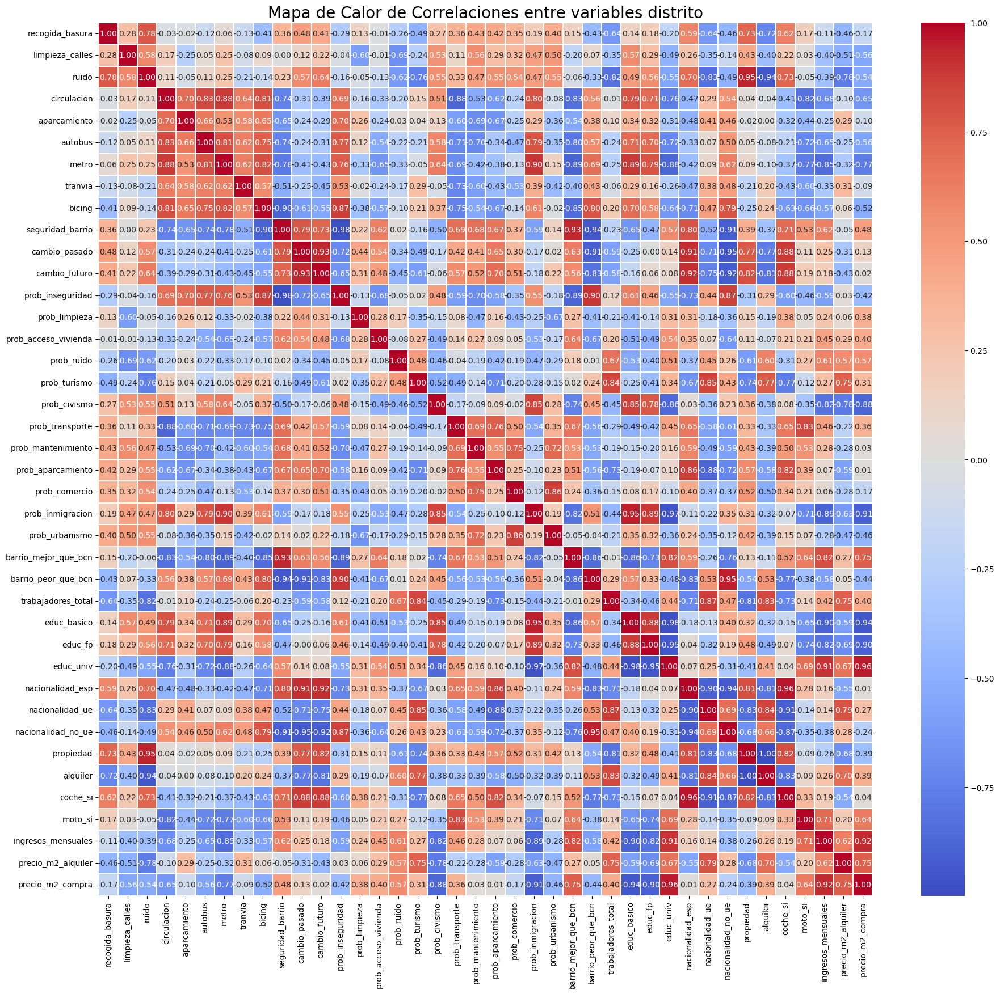

In [85]:
plt.figure(figsize=(22,20))
sns.heatmap(corr, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.1)
plt.title("Mapa de Calor de Correlaciones entre variables distrito", fontsize=20)
plt.show()

Prueba de Visualizaciones

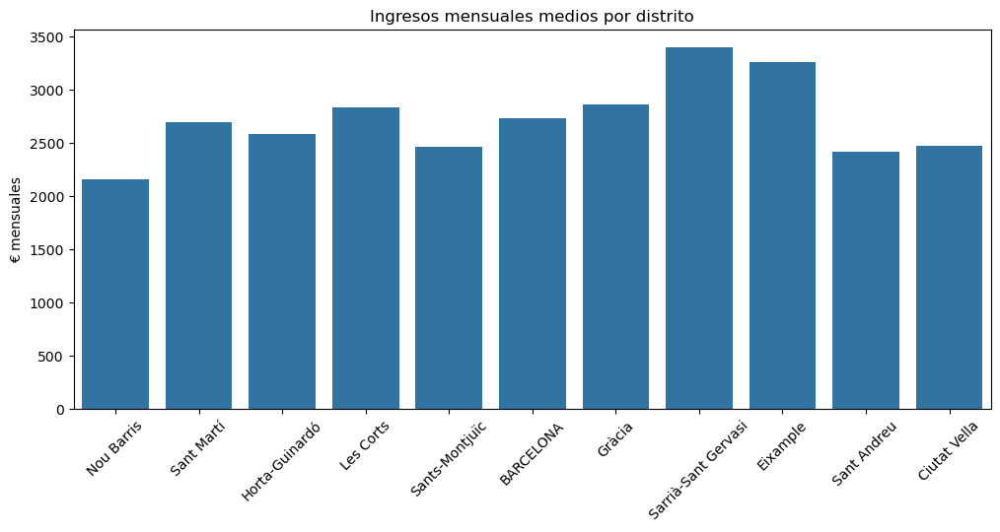

In [86]:
plt.figure(figsize=(12,5))
sns.barplot(data=df_distrito, x="Territorio", y="ingresos_mensuales")
plt.xticks(rotation=45)
plt.title("Ingresos mensuales medios por distrito")
plt.ylabel("€ mensuales")
plt.xlabel("")
plt.show()

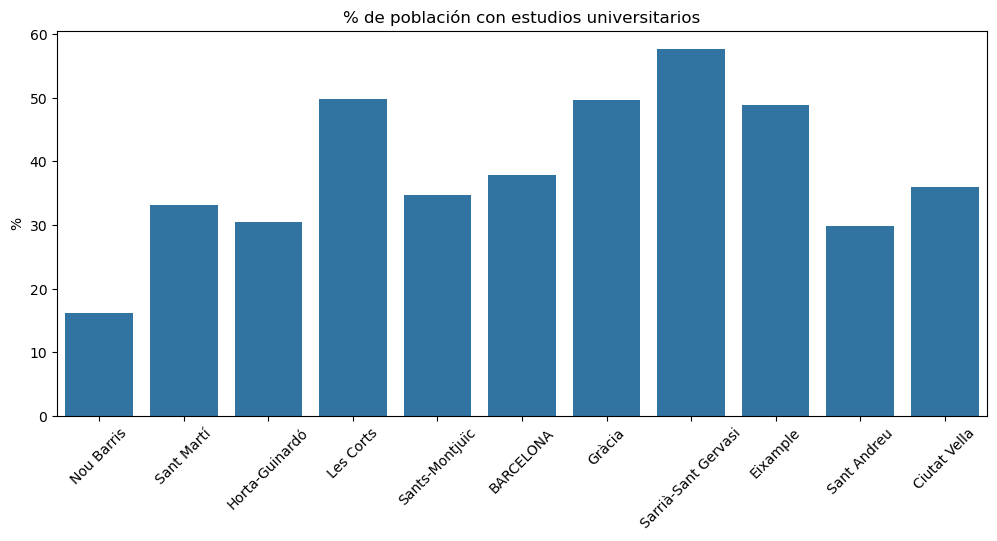

In [87]:
plt.figure(figsize=(12,5))
sns.barplot(data=df_distrito, x="Territorio", y="educ_univ")
plt.xticks(rotation=45)
plt.title("% de población con estudios universitarios")
plt.ylabel("%")
plt.xlabel("")
plt.show()

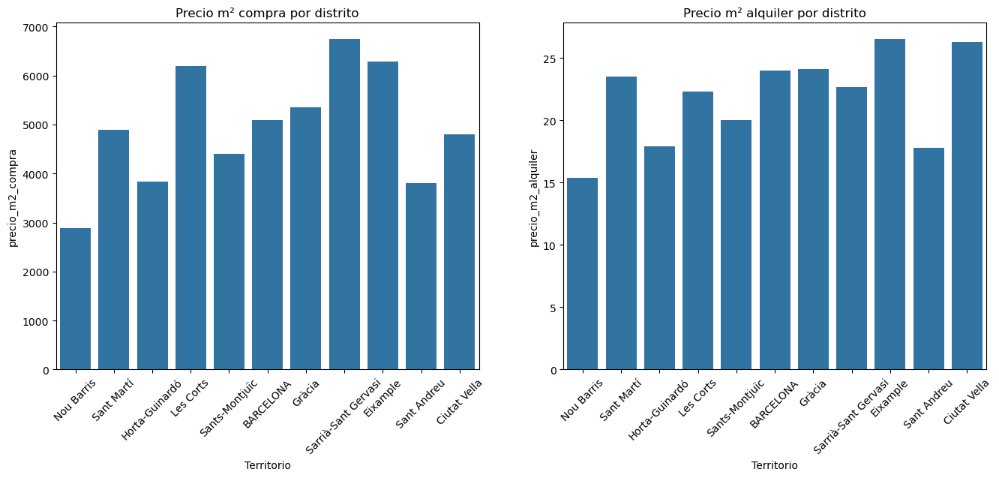

In [88]:
fig, ax = plt.subplots(1,2, figsize=(16,6))

sns.barplot(data=df_distrito, x="Territorio", y="precio_m2_compra", ax=ax[0])
ax[0].set_title("Precio m² compra por distrito")
ax[0].tick_params(axis="x", rotation=45)

sns.barplot(data=df_distrito, x="Territorio", y="precio_m2_alquiler", ax=ax[1])
ax[1].set_title("Precio m² alquiler por distrito")
ax[1].tick_params(axis="x", rotation=45)

plt.show()

<Figure size 1200x600 with 0 Axes>

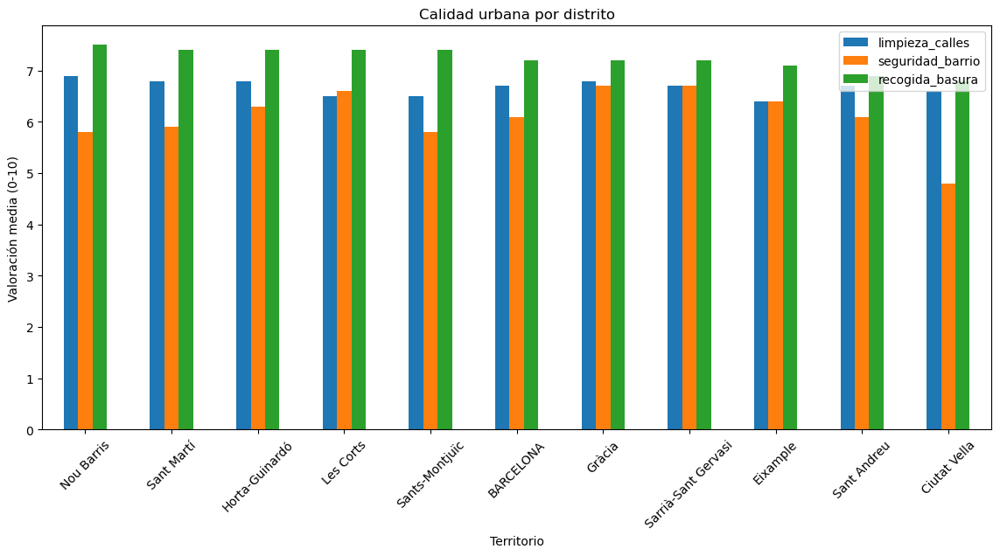

In [89]:
variables = ["limpieza_calles", "seguridad_barrio", "recogida_basura"]

plt.figure(figsize=(12,6))
df_distrito.plot(x="Territorio", y=variables, kind="bar", figsize=(14,6))
plt.xticks(rotation=45)
plt.title("Calidad urbana por distrito")
plt.ylabel("Valoración media (0-10)")
plt.show()

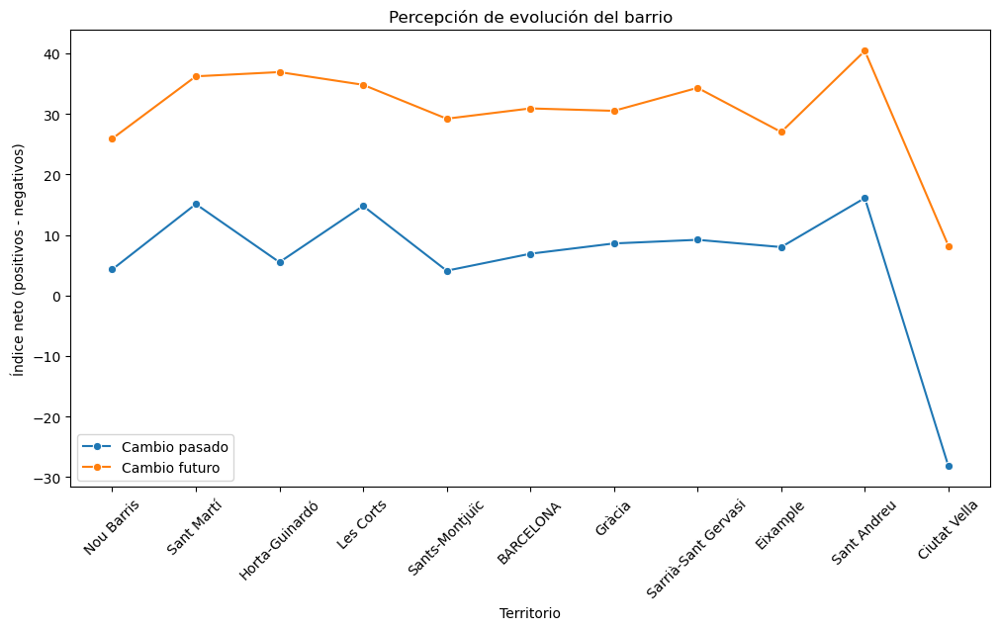

In [90]:
plt.figure(figsize=(12,6))
sns.lineplot(data=df_distrito, x="Territorio", y="cambio_pasado", marker="o", label="Cambio pasado")
sns.lineplot(data=df_distrito, x="Territorio", y="cambio_futuro", marker="o", label="Cambio futuro")
plt.xticks(rotation=45)
plt.ylabel("Índice neto (positivos - negativos)")
plt.title("Percepción de evolución del barrio")
plt.legend()
plt.show()

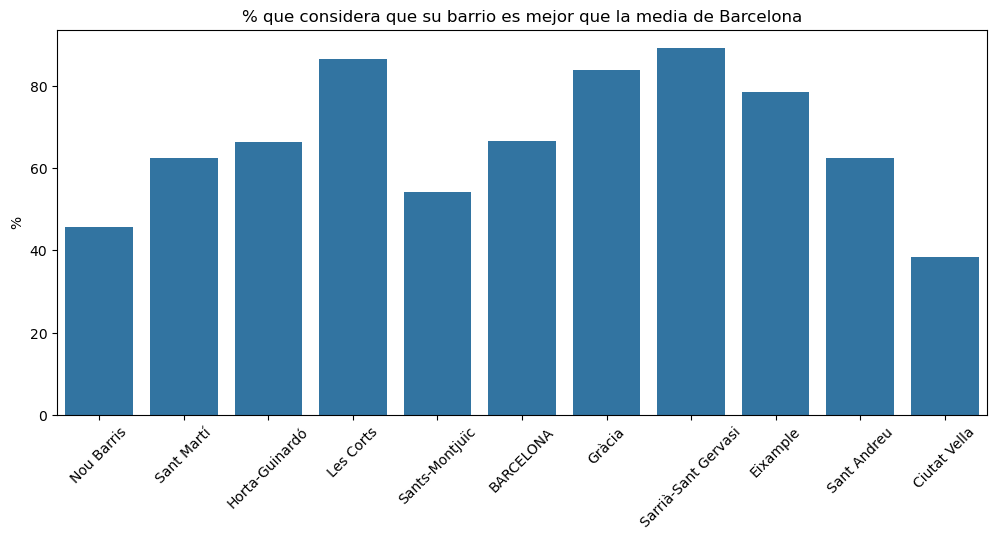

In [91]:
plt.figure(figsize=(12,5))
sns.barplot(data=df_distrito, x="Territorio", y="barrio_mejor_que_bcn")
plt.xticks(rotation=45)
plt.title("% que considera que su barrio es mejor que la media de Barcelona")
plt.ylabel("%")
plt.xlabel("")
plt.show()

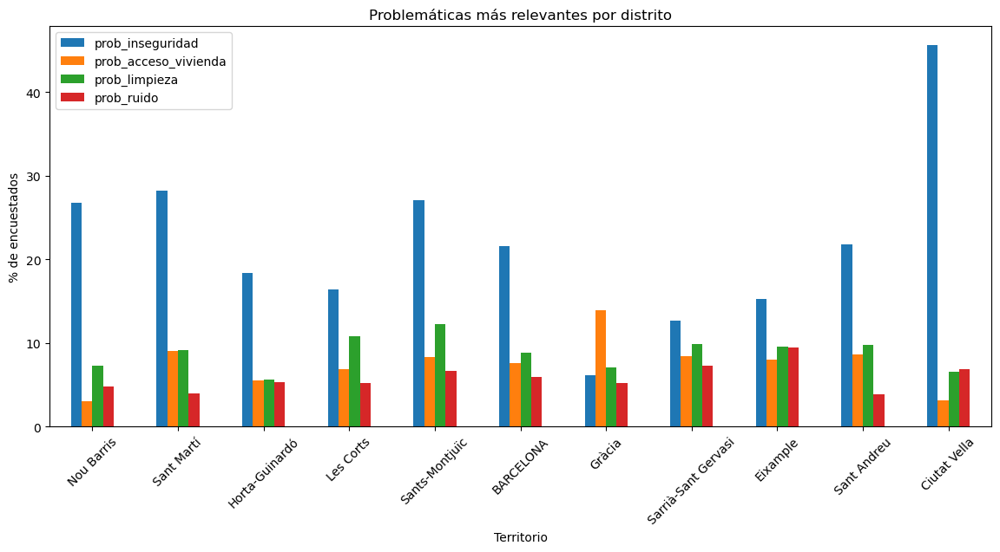

In [92]:
problemas = ["prob_inseguridad", "prob_acceso_vivienda", "prob_limpieza", "prob_ruido"]

df_distrito.set_index("Territorio")[problemas].plot(kind="bar", figsize=(14,6))
plt.title("Problemáticas más relevantes por distrito")
plt.ylabel("% de encuestados")
plt.xticks(rotation=45)
plt.show()

In [93]:
def radar_multi(df, distritos, variables, titulo=None):

    N = len(variables)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))

    for distrito in distritos:
        row = df[df["Territorio"] == distrito][variables].iloc[0]
        values = row.values.tolist()
        values += values[:1]

        ax.plot(angles, values, linewidth=2, label=distrito)
        ax.fill(angles, values, alpha=0.15)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(variables, fontsize=12)

    if titulo:
        plt.title(titulo, size=16, y=1.1)

    plt.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1))
    plt.show()

In [94]:
distritos= df_distrito["Territorio"]

In [95]:
variables_percepcion = ['recogida_basura', 'limpieza_calles', 'ruido',
       'circulacion', 'aparcamiento', 'autobus', 'metro', 'tranvia', 'bicing',
       'seguridad_barrio'] 

In [96]:
variables_problema = [
'prob_inseguridad', 'prob_limpieza', 'prob_acceso_vivienda',
       'prob_ruido', 'prob_turismo', 'prob_civismo', 'prob_transporte',
       'prob_mantenimiento', 'prob_aparcamiento', 'prob_comercio',
       'prob_inmigracion', 'prob_urbanismo']

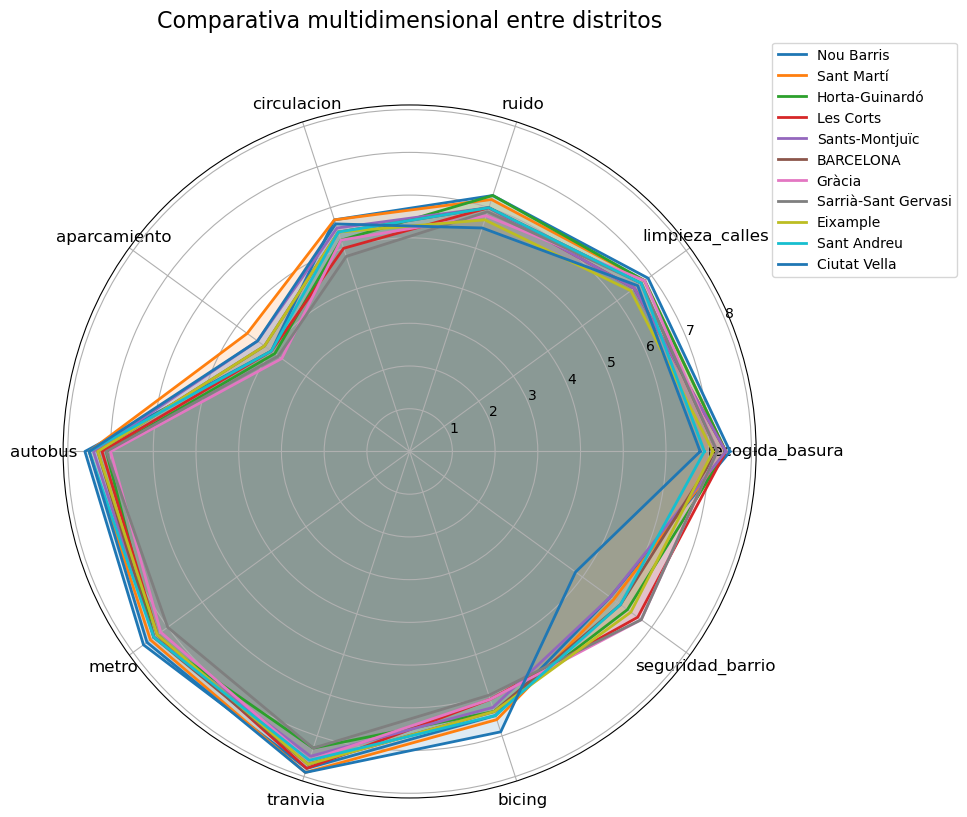

In [97]:
radar_multi(
    df=df_distrito,
    distritos=distritos,
    variables=variables_percepcion,
    titulo="Comparativa multidimensional entre distritos"
)

In [98]:
df_distrito.columns

Index(['Territorio', 'recogida_basura', 'limpieza_calles', 'ruido',
       'circulacion', 'aparcamiento', 'autobus', 'metro', 'tranvia', 'bicing',
       'seguridad_barrio', 'cambio_pasado', 'cambio_futuro',
       'prob_inseguridad', 'prob_limpieza', 'prob_acceso_vivienda',
       'prob_ruido', 'prob_turismo', 'prob_civismo', 'prob_transporte',
       'prob_mantenimiento', 'prob_aparcamiento', 'prob_comercio',
       'prob_inmigracion', 'prob_urbanismo', 'barrio_mejor_que_bcn',
       'barrio_peor_que_bcn', 'trabajadores_total', 'educ_basico', 'educ_fp',
       'educ_univ', 'nacionalidad_esp', 'nacionalidad_ue',
       'nacionalidad_no_ue', 'propiedad', 'alquiler', 'coche_si', 'moto_si',
       'ingresos_mensuales', 'precio_m2_alquiler', 'precio_m2_compra'],
      dtype='object')

In [99]:
import plotly.graph_objects as go

variables = ["seguridad_barrio", "limpieza_calles", "ruido", "cambio_futuro"]
fig = go.Figure()

for distrito in distritos:
    row = df_distrito[df_distrito["Territorio"]==distrito].iloc[0]
    fig.add_trace(go.Scatterpolar(
        r=[row[v] for v in variables_percepcion],
        theta=variables_percepcion,
        name=distrito
    ))

fig.update_layout(
    polar=dict(radialaxis=dict(visible=True)),
    title="Comparativa Radar con Plotly"
)
fig.show()

In [100]:
# Se añade tasas creadas a dataset df_distrito.
df_distrito.head(2)

,Territorio,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,...,nacionalidad_esp,nacionalidad_ue,nacionalidad_no_ue,propiedad,alquiler,coche_si,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra
0,Nou Barris,7.5,6.9,6.3,5.7,4.0,7.6,7.7,7.8,6.5,...,78.6,3.3,18.1,59.4,36.7,49.0,14.0,2161.2,15.4,2884
1,Sant Martí,7.4,6.8,6.2,5.7,4.7,7.5,7.5,7.9,6.6,...,75.6,10.1,14.3,63.7,33.0,48.2,16.3,2695.2,23.5,4899


In [101]:
tasas_cols = [
    "Territorio",
    "Tasa_C_Personas", "Tasa_C_Patrimonio", "Tasa_C_Otros",
    "Tasa_Trans_Privado", "Tasa_Trans_Publico", "Tasa_Movilidad_Sup"
]

df_tasas = df_distritos[tasas_cols]

# Se hace el merge con df_distrito
df_distrito = df_distrito.merge(df_tasas, on="Territorio", how="left")

df_distrito.head()

,Territorio,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,...,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Tasa_Trans_Privado,Tasa_Trans_Publico,Tasa_Movilidad_Sup
0,Nou Barris,7.5,6.9,6.3,5.7,4.0,7.6,7.7,7.8,6.5,...,14.0,2161.2,15.4,2884,6.325446,29.992565,3.744970,2.606429,53.369741,56.100285
1,Sant Martí,7.4,6.8,6.2,5.7,4.7,7.5,7.5,7.9,6.6,...,16.3,2695.2,23.5,4899,5.945482,59.589315,4.683600,7.855911,55.470397,63.326308
2,Horta-Guinardó,7.4,6.8,6.3,5.2,3.9,7.1,7.4,7.3,6.4,...,19.8,2588.2,17.9,3834,4.720331,27.742873,3.294398,2.516990,41.026932,43.543921
3,Les Corts,7.4,6.5,6.0,5.0,4.0,7.2,7.3,7.8,6.1,...,19.4,2834.1,22.3,6196,4.094020,58.470693,5.307944,10.482529,49.084859,59.567388
4,Sants-Montjuïc,7.4,6.5,6.0,5.5,4.4,7.4,7.4,7.5,6.3,...,16.2,2467.9,20.0,4408,8.695297,69.490981,6.288153,2.797203,25.437063,28.321678


In [102]:
df_distrito.columns

Index(['Territorio', 'recogida_basura', 'limpieza_calles', 'ruido',
       'circulacion', 'aparcamiento', 'autobus', 'metro', 'tranvia', 'bicing',
       'seguridad_barrio', 'cambio_pasado', 'cambio_futuro',
       'prob_inseguridad', 'prob_limpieza', 'prob_acceso_vivienda',
       'prob_ruido', 'prob_turismo', 'prob_civismo', 'prob_transporte',
       'prob_mantenimiento', 'prob_aparcamiento', 'prob_comercio',
       'prob_inmigracion', 'prob_urbanismo', 'barrio_mejor_que_bcn',
       'barrio_peor_que_bcn', 'trabajadores_total', 'educ_basico', 'educ_fp',
       'educ_univ', 'nacionalidad_esp', 'nacionalidad_ue',
       'nacionalidad_no_ue', 'propiedad', 'alquiler', 'coche_si', 'moto_si',
       'ingresos_mensuales', 'precio_m2_alquiler', 'precio_m2_compra',
       'Tasa_C_Personas', 'Tasa_C_Patrimonio', 'Tasa_C_Otros',
       'Tasa_Trans_Privado', 'Tasa_Trans_Publico', 'Tasa_Movilidad_Sup'],
      dtype='object')

In [103]:
df_distrito.isna()

,Territorio,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,...,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Tasa_Trans_Privado,Tasa_Trans_Publico,Tasa_Movilidad_Sup
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,True,True,True,True,True
6,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [104]:
df_distrito["Territorio"].unique()

array(['Nou Barris', 'Sant Martí', 'Horta-Guinardó', 'Les Corts',
       'Sants-Montjuïc', 'BARCELONA', 'Gràcia', 'Sarrià-Sant Gervasi',
       'Eixample', 'Sant Andreu', 'Ciutat Vella'], dtype=object)

# 2. Reducción de dimensionalidad y clusterización

## 2.1 PCA Análisis de Componenetes Principales

In [105]:
#Se realiza copia del dataset y se elimina el registro de Barcelona ya que solo sirve para tener una referencia de los barrios. Al ser Barcelona el conjunto de todos los distritos soo aportaria ruido ya que esta correlacionada con todos.
df_pca = df_distrito[df_distrito["Territorio"] != "BARCELONA"].copy()

Ahora que se dispone de un dataset con las valoraciones de los habitantes de la encuesta y diferentes tasas extraídas de una fuente fiable, se procede a realizar PCA para obtener los componentes principales que expliquen el mayor porcentaje de varianza. 

In [106]:
# se comprueba la no existencia de valores faltantes
df_pca.isna().any().any()

np.False_

In [107]:
#Se seleccionan solo las columnas numéricas
df_pca_num = df_pca.drop(columns=["Territorio"], errors="ignore")

# Se normalizan los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_pca_num)

# Se selecciona que el PCA conserve al menos el 90% de la varianza
pca = PCA(n_components=0.90)

X_pca = pca.fit_transform(X_scaled)

print("Número de componentes:", pca.n_components_)
print("Varianza total explicada:", pca.explained_variance_ratio_.sum())

Número de componentes: 5
Varianza total explicada: 0.9112478378721554


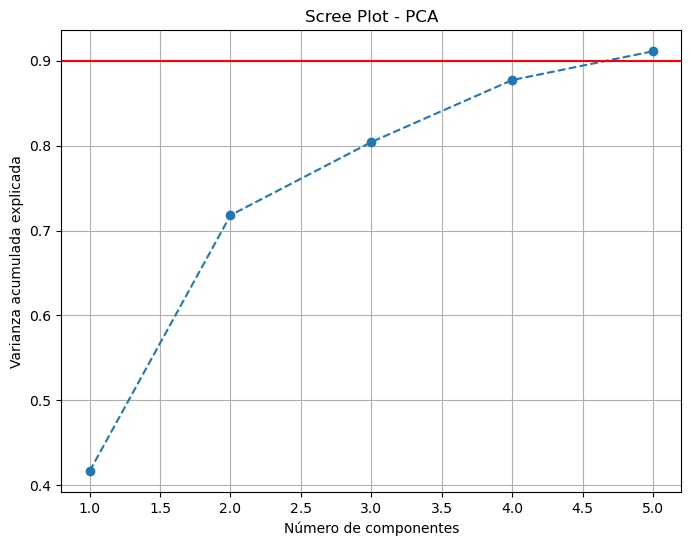

In [108]:
# Varianza explicada por cada componente
explained_var = pca.explained_variance_ratio_
cum_var = np.cumsum(explained_var)

plt.figure(figsize=(8,6))
plt.plot(range(1, len(explained_var)+1), cum_var, marker='o', linestyle='--')
plt.axhline(y=0.90, color='r', linestyle='-')
plt.xlabel("Número de componentes")
plt.ylabel("Varianza acumulada explicada")
plt.title("Scree Plot - PCA")
plt.grid(True)
plt.show()

In [109]:
componentes = pd.DataFrame(
    pca.components_,
    columns=df_pca_num.columns,
    index=[f"PC{i+1}" for i in range(pca.n_components_)]
)
componentes.T 

,PC1,PC2,PC3,PC4,PC5
recogida_basura,-0.125398,-0.113072,0.034613,0.022194,0.276435
limpieza_calles,-0.050794,-0.154353,-0.221751,0.130684,-0.291897
ruido,-0.127902,-0.208928,-0.002233,0.053852,0.174863
circulacion,0.155112,-0.149205,0.135219,0.163224,0.023173
aparcamiento,0.133249,-0.052170,0.241380,-0.038399,0.345224
autobus,0.137615,-0.160681,0.226731,-0.050139,-0.019625
metro,0.145802,-0.192843,0.026576,0.093848,0.067210
tranvia,0.142308,-0.029150,0.239670,0.135433,-0.069928
bicing,0.193047,-0.102925,-0.011117,0.081503,0.109375
seguridad_barrio,-0.205693,0.094904,0.030051,0.115480,-0.038770


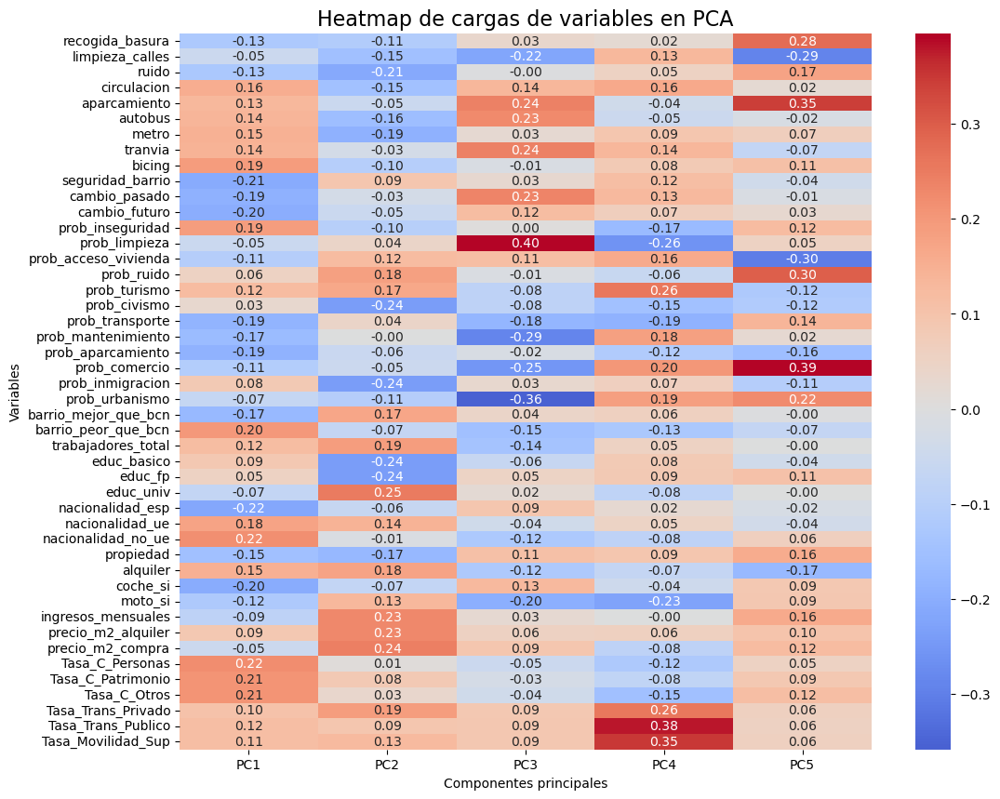

In [110]:
# Mapa de calor cargas del PCA

plt.figure(figsize=(12,10))
sns.heatmap(componentes.T, cmap="coolwarm", center=0, annot=True, fmt=".2f")

plt.title("Heatmap de cargas de variables en PCA", fontsize=16)
plt.xlabel("Componentes principales")
plt.ylabel("Variables")
plt.show()

## 2.2 Selección de clusters método elbow Silhouette

C:\Users\abelmora\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
[WinError 2] El sistema no puede encontrar el archivo especificado
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "C:\Users\abelmora\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Users\abelmora\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\abelmora\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^

Text(0.5, 1.0, 'Método del codo (Elbow) - KMeans')

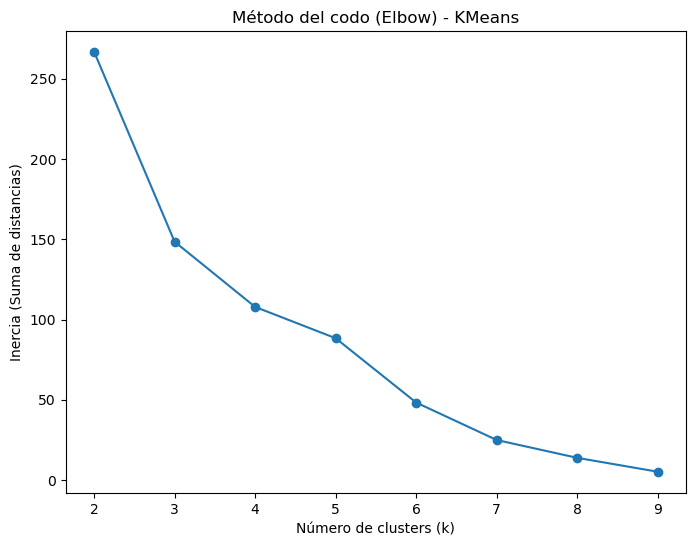

In [111]:
inertia = []
K = range(2, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8,6))
plt.plot(K, inertia, marker='o')
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia (Suma de distancias)")
plt.title("Método del codo (Elbow) - KMeans")

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less 

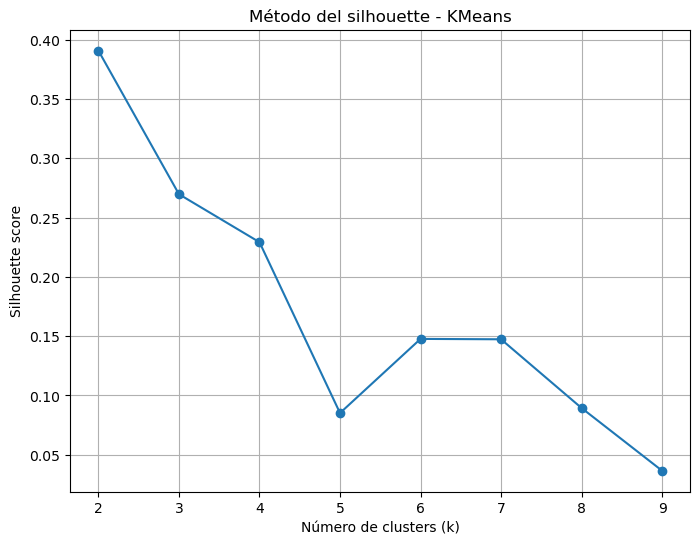

In [112]:
# Silhouette
silhouette_scores = []
K = range(2, 10)  

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)  
    labels = kmeans.fit_predict(X_pca)              
    score = silhouette_score(X_pca, labels)        
    silhouette_scores.append(score)
    
plt.figure(figsize=(8,6))
plt.plot(K, silhouette_scores, marker='o')
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette score")
plt.title("Método del silhouette - KMeans")
plt.grid(True)
plt.show()

## 2.3 K-Means

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



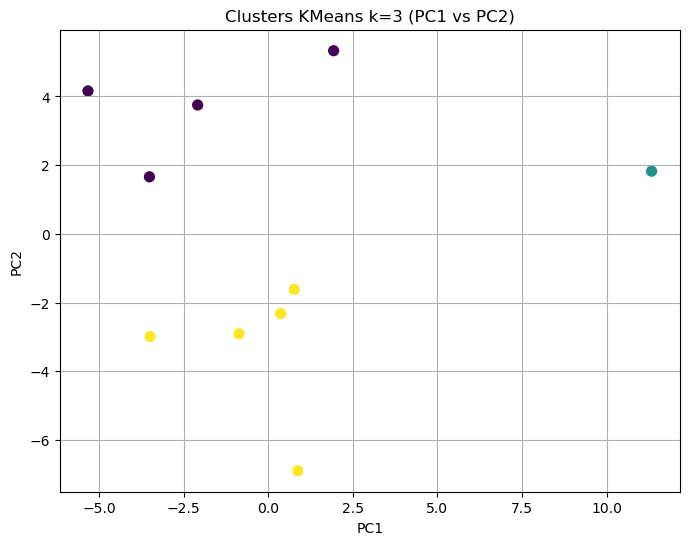

In [113]:
# KMeans k=3
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(X_pca)
df_pca_num["Cluster"] = labels

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, cmap='viridis', s=50)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Clusters KMeans k=3 (PC1 vs PC2)")
plt.grid(True)
plt.show()

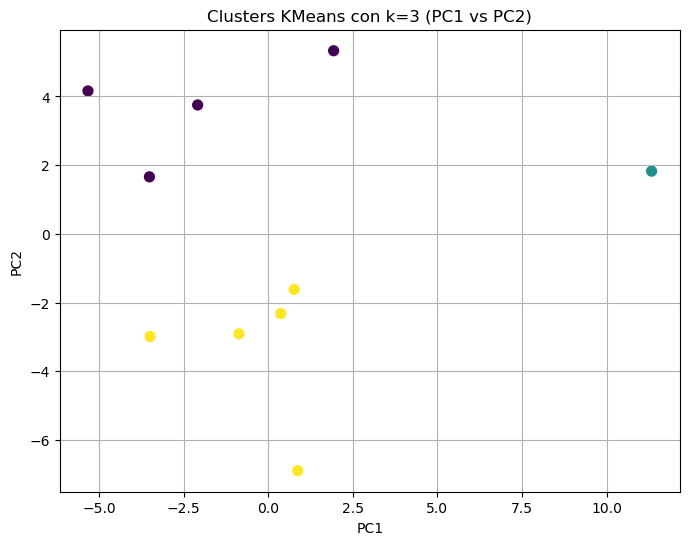

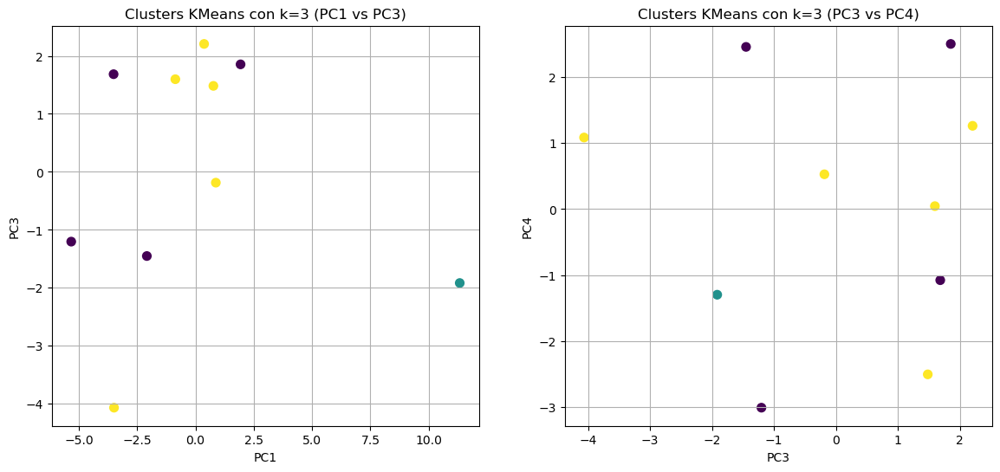

In [114]:
# PC1 y PC2
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, cmap='viridis', s=50)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Clusters KMeans con k=3 (PC1 vs PC2)")
plt.grid(True)
plt.show()

# PC1 vs PC3
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.scatter(X_pca[:,0], X_pca[:,2], c=labels, cmap='viridis', s=50)
plt.xlabel("PC1")
plt.ylabel("PC3")
plt.title("Clusters KMeans con k=3 (PC1 vs PC3)")
plt.grid(True)

# PC3 vs PC4
plt.subplot(1,2,2)
plt.scatter(X_pca[:,2], X_pca[:,3], c=labels, cmap='viridis', s=50)
plt.xlabel("PC3")
plt.ylabel("PC4")
plt.title("Clusters KMeans con k=3 (PC3 vs PC4)")
plt.grid(True)

In [115]:
df_pca_num

,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,seguridad_barrio,...,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Tasa_Trans_Privado,Tasa_Trans_Publico,Tasa_Movilidad_Sup,Cluster
0,7.5,6.9,6.3,5.7,4.0,7.6,7.7,7.8,6.5,5.8,...,2161.2,15.4,2884,6.325446,29.992565,3.744970,2.606429,53.369741,56.100285,2
1,7.4,6.8,6.2,5.7,4.7,7.5,7.5,7.9,6.6,5.9,...,2695.2,23.5,4899,5.945482,59.589315,4.683600,7.855911,55.470397,63.326308,2
2,7.4,6.8,6.3,5.2,3.9,7.1,7.4,7.3,6.4,6.3,...,2588.2,17.9,3834,4.720331,27.742873,3.294398,2.516990,41.026932,43.543921,2
3,7.4,6.5,6.0,5.0,4.0,7.2,7.3,7.8,6.1,6.6,...,2834.1,22.3,6196,4.094020,58.470693,5.307944,10.482529,49.084859,59.567388,0
4,7.4,6.5,6.0,5.5,4.4,7.4,7.4,7.5,6.3,5.8,...,2467.9,20.0,4408,8.695297,69.490981,6.288153,2.797203,25.437063,28.321678,2
6,7.2,6.8,5.8,5.2,3.7,7.0,7.2,7.6,6.1,6.7,...,2859.9,24.1,5345,3.618590,36.217431,2.104931,15.861742,59.895833,75.757576,0
7,7.2,6.7,5.9,4.8,3.8,7.1,7.0,7.3,6.0,6.7,...,3398.6,22.7,6739,3.589502,32.338211,2.419154,4.519207,27.215667,31.835300,0
8,7.1,6.4,5.7,5.4,4.2,7.3,7.3,7.7,6.4,6.4,...,3261.0,26.5,6282,7.480036,112.406319,5.371764,29.340836,93.783494,123.124330,0
9,6.9,6.7,6.0,5.4,4.0,7.5,7.4,7.6,6.5,6.1,...,2414.7,17.8,3811,6.144763,48.644985,3.471474,5.612864,48.998786,54.611650,2
10,6.8,6.6,5.5,5.6,4.4,7.5,7.6,7.9,6.9,4.8,...,2477.3,26.3,4796,18.076284,247.220524,15.570234,18.073722,68.489893,86.801427,1


In [116]:
# Media de componente por cluster
medias_por_cluster = df_pca_num.groupby("Cluster").mean().round(2)
medias_por_cluster

,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,seguridad_barrio,...,moto_si,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Tasa_Trans_Privado,Tasa_Trans_Publico,Tasa_Movilidad_Sup
Cluster,,,,,,,,,,,,,,,,,,,,,
0,7.22,6.60,5.85,5.1,3.92,7.15,7.20,7.60,6.15,6.60,...,20.67,3088.40,23.90,6140.5,4.70,59.86,3.80,15.05,57.49,72.57
1,6.80,6.60,5.50,5.6,4.40,7.50,7.60,7.90,6.90,4.80,...,15.80,2477.30,26.30,4796.0,18.08,247.22,15.57,18.07,68.49,86.80
2,7.32,6.74,6.16,5.5,4.20,7.42,7.48,7.62,6.46,5.98,...,15.76,2465.44,18.92,3967.2,6.37,47.09,4.30,4.28,44.86,49.18


In [117]:
#Se transpone la tabla para visualizar todas las variables
tabla_transpuesta = medias_por_cluster.T
tabla_transpuesta

Cluster,0,1,2
recogida_basura,7.22,6.80,7.32
limpieza_calles,6.60,6.60,6.74
ruido,5.85,5.50,6.16
circulacion,5.10,5.60,5.50
aparcamiento,3.92,4.40,4.20
autobus,7.15,7.50,7.42
metro,7.20,7.60,7.48
tranvia,7.60,7.90,7.62
bicing,6.15,6.90,6.46
seguridad_barrio,6.60,4.80,5.98


In [118]:
df_final = pd.concat([df_pca[["Territorio"]], df_pca_num], axis=1)
df_final

,Territorio,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,...,ingresos_mensuales,precio_m2_alquiler,precio_m2_compra,Tasa_C_Personas,Tasa_C_Patrimonio,Tasa_C_Otros,Tasa_Trans_Privado,Tasa_Trans_Publico,Tasa_Movilidad_Sup,Cluster
0,Nou Barris,7.5,6.9,6.3,5.7,4.0,7.6,7.7,7.8,6.5,...,2161.2,15.4,2884,6.325446,29.992565,3.744970,2.606429,53.369741,56.100285,2
1,Sant Martí,7.4,6.8,6.2,5.7,4.7,7.5,7.5,7.9,6.6,...,2695.2,23.5,4899,5.945482,59.589315,4.683600,7.855911,55.470397,63.326308,2
2,Horta-Guinardó,7.4,6.8,6.3,5.2,3.9,7.1,7.4,7.3,6.4,...,2588.2,17.9,3834,4.720331,27.742873,3.294398,2.516990,41.026932,43.543921,2
3,Les Corts,7.4,6.5,6.0,5.0,4.0,7.2,7.3,7.8,6.1,...,2834.1,22.3,6196,4.094020,58.470693,5.307944,10.482529,49.084859,59.567388,0
4,Sants-Montjuïc,7.4,6.5,6.0,5.5,4.4,7.4,7.4,7.5,6.3,...,2467.9,20.0,4408,8.695297,69.490981,6.288153,2.797203,25.437063,28.321678,2
6,Gràcia,7.2,6.8,5.8,5.2,3.7,7.0,7.2,7.6,6.1,...,2859.9,24.1,5345,3.618590,36.217431,2.104931,15.861742,59.895833,75.757576,0
7,Sarrià-Sant Gervasi,7.2,6.7,5.9,4.8,3.8,7.1,7.0,7.3,6.0,...,3398.6,22.7,6739,3.589502,32.338211,2.419154,4.519207,27.215667,31.835300,0
8,Eixample,7.1,6.4,5.7,5.4,4.2,7.3,7.3,7.7,6.4,...,3261.0,26.5,6282,7.480036,112.406319,5.371764,29.340836,93.783494,123.124330,0
9,Sant Andreu,6.9,6.7,6.0,5.4,4.0,7.5,7.4,7.6,6.5,...,2414.7,17.8,3811,6.144763,48.644985,3.471474,5.612864,48.998786,54.611650,2
10,Ciutat Vella,6.8,6.6,5.5,5.6,4.4,7.5,7.6,7.9,6.9,...,2477.3,26.3,4796,18.076284,247.220524,15.570234,18.073722,68.489893,86.801427,1


In [119]:
df_final.columns

Index(['Territorio', 'recogida_basura', 'limpieza_calles', 'ruido',
       'circulacion', 'aparcamiento', 'autobus', 'metro', 'tranvia', 'bicing',
       'seguridad_barrio', 'cambio_pasado', 'cambio_futuro',
       'prob_inseguridad', 'prob_limpieza', 'prob_acceso_vivienda',
       'prob_ruido', 'prob_turismo', 'prob_civismo', 'prob_transporte',
       'prob_mantenimiento', 'prob_aparcamiento', 'prob_comercio',
       'prob_inmigracion', 'prob_urbanismo', 'barrio_mejor_que_bcn',
       'barrio_peor_que_bcn', 'trabajadores_total', 'educ_basico', 'educ_fp',
       'educ_univ', 'nacionalidad_esp', 'nacionalidad_ue',
       'nacionalidad_no_ue', 'propiedad', 'alquiler', 'coche_si', 'moto_si',
       'ingresos_mensuales', 'precio_m2_alquiler', 'precio_m2_compra',
       'Tasa_C_Personas', 'Tasa_C_Patrimonio', 'Tasa_C_Otros',
       'Tasa_Trans_Privado', 'Tasa_Trans_Publico', 'Tasa_Movilidad_Sup',
       'Cluster'],
      dtype='object')

In [120]:
df_final.to_csv('mis_distritos.csv', index=False)

In [121]:
df_final.groupby("Cluster")["Territorio"].apply(list)

Cluster
0    [Les Corts, Gràcia, Sarrià-Sant Gervasi, Eixam...
1                                       [Ciutat Vella]
2    [Nou Barris, Sant Martí, Horta-Guinardó, Sants...
Name: Territorio, dtype: object

# 3. Análisis datos viviendas

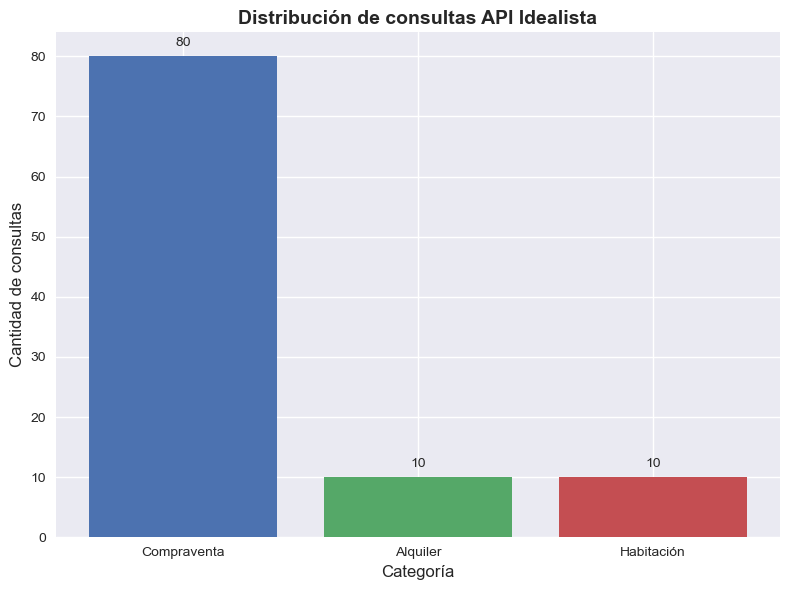

In [122]:
# Datos
categorias = ['Compraventa', 'Alquiler', 'Habitación']
valores = [80, 10, 10]
plt.style.use('seaborn-v0_8')
fig, ax = plt.subplots(figsize=(8, 6))

# Gráfico de barras
barras = ax.bar(categorias, valores, color=['#4C72B0', '#55A868', '#C44E52'])
for barra in barras:
    altura = barra.get_height()
    ax.annotate(f'{int(altura)}',
                xy=(barra.get_x() + barra.get_width() / 2, altura),
                xytext=(0, 5),
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=10)

ax.set_title('Distribución de consultas API Idealista', fontsize=14, weight='bold')
ax.set_xlabel('Categoría', fontsize=12)
ax.set_ylabel('Cantidad de consultas', fontsize=12)
plt.tight_layout()
plt.show()

## 3.1 Dataset barcelona_habitaciones

In [123]:
barcelona_habitaciones.head()

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has360,hasStaging,isOnlineBookingActive,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,hasLift,externalReference
0,110174444,https://img4.idealista.com/blur/480_360_mq/0/i...,7,10,700.0,"{'price': {'amount': 700.0, 'currencySuffix': ...",room,rent,70.0,4,...,False,False,False,{},[],False,False,False,NaN,NaN
1,36742678,https://img4.idealista.com/blur/480_360_mq/0/i...,6,3,550.0,"{'price': {'amount': 550.0, 'currencySuffix': ...",room,rent,70.0,3,...,False,False,False,{},[],False,False,False,True,NaN
2,107754503,https://img4.idealista.com/blur/480_360_mq/0/i...,13,7,600.0,"{'price': {'amount': 600.0, 'currencySuffix': ...",room,rent,90.0,2,...,False,False,False,{},[],False,False,False,True,NaN
3,108064174,https://img4.idealista.com/blur/480_360_mq/0/i...,32,1,700.0,"{'price': {'amount': 700.0, 'currencySuffix': ...",room,rent,120.0,4,...,False,False,False,{},[],False,False,False,True,NaN
4,110174199,https://img4.idealista.com/blur/480_360_mq/0/i...,2,1,590.0,"{'price': {'amount': 590.0, 'currencySuffix': ...",room,rent,110.0,3,...,False,False,False,{},[],False,False,False,True,NaN


In [124]:
barcelona_habitaciones_pag1.head()

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has360,hasStaging,isOnlineBookingActive,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,tenantGender,externalReference
0,110175161,https://img4.idealista.com/blur/480_360_mq/0/i...,4,3,495.0,"{'price': {'amount': 495.0, 'currencySuffix': ...",room,rent,56.0,1,...,False,False,False,{},[],False,False,False,NaN,NaN
1,103894335,https://img4.idealista.com/blur/480_360_mq/0/i...,3,2,470.0,"{'price': {'amount': 470.0, 'currencySuffix': ...",room,rent,60.0,3,...,False,False,False,{},[],False,False,False,mixed,NaN
2,110175762,https://img4.idealista.com/blur/480_360_mq/0/i...,11,2,750.0,"{'price': {'amount': 750.0, 'currencySuffix': ...",room,rent,111.0,3,...,False,False,False,{},[],False,False,False,female,NaN
3,110175791,https://img4.idealista.com/blur/480_360_mq/0/i...,8,1,750.0,"{'price': {'amount': 750.0, 'currencySuffix': ...",room,rent,85.0,4,...,False,False,False,{},[],False,False,False,NaN,NaN
4,110175789,https://img4.idealista.com/blur/480_360_mq/0/i...,6,1,800.0,"{'price': {'amount': 800.0, 'currencySuffix': ...",room,rent,90.0,4,...,False,False,False,{},[],False,False,False,NaN,NaN


Se realiza fusión de los dataset de pagina 1 y el resto de paginas

In [125]:
barcelona_habitaciones.shape

(450, 43)

In [126]:
barcelona_habitaciones_pag1.shape

(50, 43)

In [127]:
barcelona_habitaciones = pd.concat(
    [barcelona_habitaciones_pag1, barcelona_habitaciones],
    ignore_index=True
)

In [128]:
barcelona_habitaciones.shape

(500, 43)

In [129]:
barcelona_habitaciones.columns

Index(['propertyCode', 'thumbnail', 'numPhotos', 'floor', 'price', 'priceInfo',
       'propertyType', 'operation', 'size', 'rooms', 'bathrooms', 'address',
       'province', 'municipality', 'district', 'country', 'neighborhood',
       'latitude', 'longitude', 'showAddress', 'url', 'description',
       'hasVideo', 'newDevelopment', 'tenantNumber', 'hasLift',
       'isSmokingAllowed', 'priceByArea', 'change', 'detailedType',
       'suggestedTexts', 'hasPlan', 'has3DTour', 'has360', 'hasStaging',
       'isOnlineBookingActive', 'savedAd', 'notes', 'topNewDevelopment',
       'newDevelopmentHighlight', 'topPlus', 'tenantGender',
       'externalReference'],
      dtype='object')

In [130]:
# Se analiza si existen duplicados
print(f"Total anuncios: {len(barcelona_habitaciones)}")
print(f"Anuncios únicos: {barcelona_habitaciones['propertyCode'].nunique()}")

Total anuncios: 500
Anuncios únicos: 499


In [131]:
# Se elimina el registro duplicado
barcelona_habitaciones = barcelona_habitaciones.drop_duplicates(
    subset=["propertyCode"]
)

In [132]:
print(f"Total anuncios: {len(barcelona_habitaciones)}")
print(f"Anuncios únicos: {barcelona_habitaciones['propertyCode'].nunique()}")

Total anuncios: 499
Anuncios únicos: 499


In [133]:
# Se
barcelona_habitaciones.info()

<class 'pandas.core.frame.DataFrame'>
Index: 499 entries, 0 to 499
Data columns (total 43 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   propertyCode             499 non-null    int64  
 1   thumbnail                493 non-null    object 
 2   numPhotos                499 non-null    int64  
 3   floor                    414 non-null    object 
 4   price                    499 non-null    float64
 5   priceInfo                499 non-null    object 
 6   propertyType             499 non-null    object 
 7   operation                499 non-null    object 
 8   size                     499 non-null    float64
 9   rooms                    499 non-null    int64  
 10  bathrooms                499 non-null    int64  
 11  address                  499 non-null    object 
 12  province                 499 non-null    object 
 13  municipality             499 non-null    object 
 14  district                 499 no

In [134]:
barcelona_habitaciones.isnull().sum().sort_values(ascending=False)

externalReference          336
tenantGender                85
floor                       85
description                 32
hasLift                      6
thumbnail                    6
propertyType                 0
numPhotos                    0
price                        0
priceInfo                    0
propertyCode                 0
bathrooms                    0
rooms                        0
size                         0
operation                    0
country                      0
neighborhood                 0
address                      0
province                     0
longitude                    0
latitude                     0
url                          0
showAddress                  0
hasVideo                     0
newDevelopment               0
municipality                 0
district                     0
isSmokingAllowed             0
tenantNumber                 0
priceByArea                  0
change                       0
hasPlan                      0
has3DTou

In [135]:
barcelona_habitaciones[barcelona_habitaciones["externalReference"].notna()].head(5)

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has360,hasStaging,isOnlineBookingActive,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,tenantGender,externalReference
31,110174885,https://img4.idealista.com/blur/480_360_mq/0/i...,18,3,600.0,"{'price': {'amount': 600.0, 'currencySuffix': ...",room,rent,150.0,5,...,False,False,False,{},[],False,False,False,mixed,arc3h5
32,110174850,https://img4.idealista.com/blur/480_360_mq/0/i...,19,4,745.0,"{'price': {'amount': 745.0, 'currencySuffix': ...",room,rent,200.0,8,...,False,False,False,{},[],False,False,False,female,balh2
35,110174804,https://img4.idealista.com/blur/480_360_mq/0/i...,19,4,745.0,"{'price': {'amount': 745.0, 'currencySuffix': ...",room,rent,200.0,8,...,False,False,False,{},[],False,False,False,female,balh6
44,110174644,https://img4.idealista.com/blur/480_360_mq/0/i...,28,3,590.0,"{'price': {'amount': 590.0, 'currencySuffix': ...",room,rent,150.0,5,...,False,False,False,{},[],False,False,False,mixed,santj3h1
48,110174606,https://img4.idealista.com/blur/480_360_mq/0/i...,27,3,590.0,"{'price': {'amount': 590.0, 'currencySuffix': ...",room,rent,150.0,5,...,False,False,False,{},[],False,False,False,mixed,santj3h2


In [136]:
barcelona_habitaciones["externalReference"].value_counts()


externalReference
CD.PRIN1.h9                  2
arc3h5                       1
balh6                        1
santj3h1                     1
santj3h2                     1
                            ..
96204                        1
96201                        1
39162                        1
H3. BALMES353.  FEBRERO.     1
128862_96eddd9a              1
Name: count, Length: 162, dtype: int64

In [137]:
barcelona_habitaciones = barcelona_habitaciones.drop(columns=["externalReference"])

Se decide eliminar columna externalReference ya que no aporta información relevante.
Se decide conservar la columna thumbnail ya que solo presenta 6 valores nulos y puede aportar para la visualización. Para los registros nulos, no se realiza ninguna acción.
De igual manera para description, floor y tenenGender ya que para la columna floor en este caso no se va a realizar una regresión con los datos de habitaciones en alquiler. 



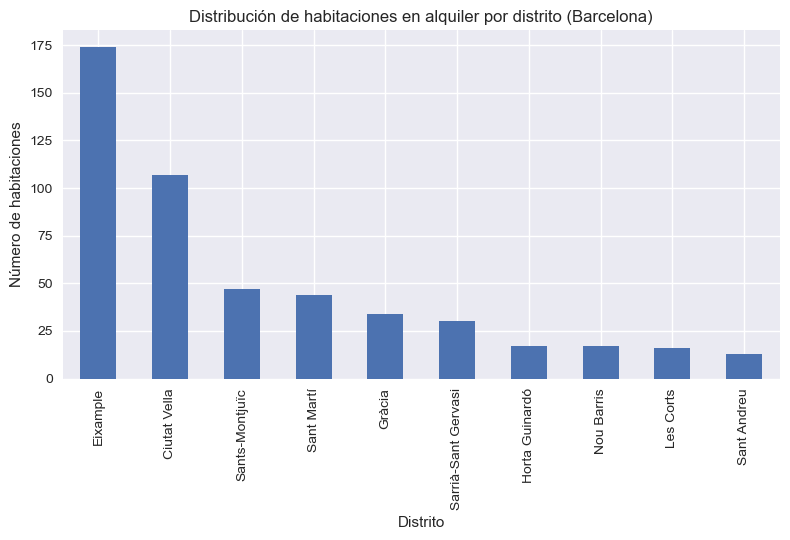

In [138]:
# Conteo de habitaciones por distrito
district_counts_hab = barcelona_habitaciones["district"].value_counts()

plt.figure()
district_counts_hab.plot(kind="bar")
plt.title("Distribución de habitaciones en alquiler por distrito (Barcelona)")
plt.xlabel("Distrito")
plt.ylabel("Número de habitaciones")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [139]:
precio_medio_general = barcelona_habitaciones["price"].mean()

print(f"Precio medio de alquiler de una habitación en Barcelona: {precio_medio_general:.2f} €")

Precio medio de alquiler de una habitación en Barcelona: 615.13 €


In [140]:
precio_medio_distrito = (barcelona_habitaciones.groupby("district")["price"].mean().sort_values(ascending=False))
precio_medio_distrito

district
Sarrià-Sant Gervasi    689.500000
Eixample               655.097701
Gràcia                 623.323529
Ciutat Vella           605.439252
Les Corts              585.625000
Horta Guinardó         582.352941
Sant Martí             568.068182
Sants-Montjuïc         567.404255
Sant Andreu            513.846154
Nou Barris             511.058824
Name: price, dtype: float64

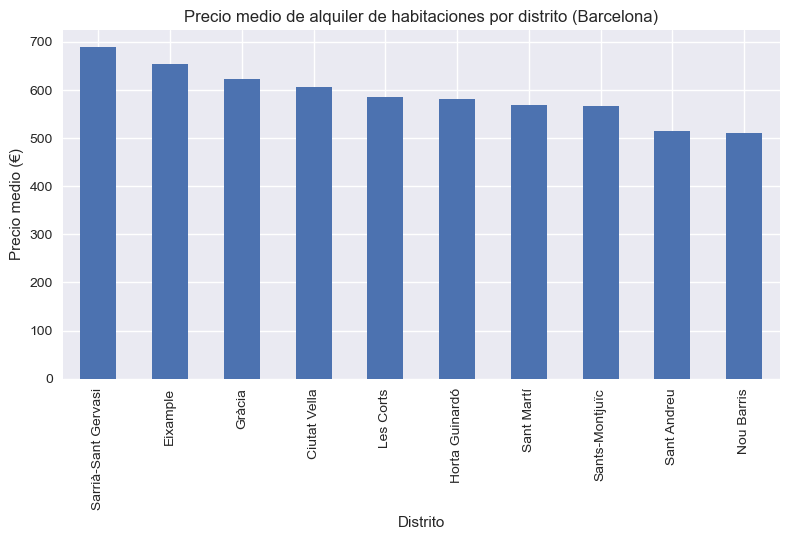

In [141]:
plt.figure()
precio_medio_distrito.plot(kind="bar")
plt.title("Precio medio de alquiler de habitaciones por distrito (Barcelona)")
plt.xlabel("Distrito")
plt.ylabel("Precio medio (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 3.2 Dataset barcelona_alquiler

In [142]:
barcelona_alquiler = pd.read_csv("barcelona_alquiler.csv")
barcelona_alquiler.head()

,propertyCode,thumbnail,externalReference,numPhotos,floor,price,priceInfo,propertyType,operation,size,...,has3DTour,has360,hasStaging,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,exterior,parkingSpace
0,110175843,https://img4.idealista.com/blur/480_360_mq/0/i...,SATOCO58_A,17,en,1700.0,"{'price': {'amount': 1700.0, 'currencySuffix':...",flat,rent,105.0,...,False,False,False,{},[],False,False,False,NaN,NaN
1,110098950,https://img4.idealista.com/blur/480_360_mq/0/i...,21087,20,2,1200.0,"{'price': {'amount': 1200.0, 'currencySuffix':...",flat,rent,74.0,...,False,False,False,{},[],False,False,False,True,NaN
2,110175395,https://img4.idealista.com/blur/480_360_mq/0/i...,NaN,16,1,1200.0,"{'price': {'amount': 1200.0, 'currencySuffix':...",flat,rent,73.0,...,False,False,False,{},[],False,False,False,True,NaN
3,110175408,https://img4.idealista.com/blur/480_360_mq/0/i...,BD003,5,1,1600.0,"{'price': {'amount': 1600.0, 'currencySuffix':...",flat,rent,70.0,...,False,False,False,{},[],False,False,False,True,NaN
4,110175378,https://img4.idealista.com/blur/480_360_mq/0/i...,BD004,6,1,1400.0,"{'price': {'amount': 1400.0, 'currencySuffix':...",flat,rent,69.0,...,False,False,False,{},[],False,False,False,True,NaN


In [143]:
barcelona_alquiler.shape

(500, 42)

In [144]:
barcelona_alquiler.columns

Index(['propertyCode', 'thumbnail', 'externalReference', 'numPhotos', 'floor',
       'price', 'priceInfo', 'propertyType', 'operation', 'size', 'rooms',
       'bathrooms', 'address', 'province', 'municipality', 'district',
       'country', 'neighborhood', 'latitude', 'longitude', 'showAddress',
       'url', 'description', 'hasVideo', 'status', 'newDevelopment', 'hasLift',
       'priceByArea', 'change', 'detailedType', 'suggestedTexts', 'hasPlan',
       'has3DTour', 'has360', 'hasStaging', 'savedAd', 'notes',
       'topNewDevelopment', 'newDevelopmentHighlight', 'topPlus', 'exterior',
       'parkingSpace'],
      dtype='object')

In [145]:
# Se analiza si existen duplicados
print(f"Total anuncios: {len(barcelona_alquiler)}")
print(f"Anuncios únicos: {barcelona_alquiler['propertyCode'].nunique()}")

Total anuncios: 500
Anuncios únicos: 500


No existen elementos duplicados.

In [146]:
barcelona_alquiler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 42 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   propertyCode             500 non-null    int64  
 1   thumbnail                499 non-null    object 
 2   externalReference        380 non-null    object 
 3   numPhotos                500 non-null    int64  
 4   floor                    455 non-null    object 
 5   price                    500 non-null    float64
 6   priceInfo                500 non-null    object 
 7   propertyType             500 non-null    object 
 8   operation                500 non-null    object 
 9   size                     500 non-null    float64
 10  rooms                    500 non-null    int64  
 11  bathrooms                500 non-null    int64  
 12  address                  500 non-null    object 
 13  province                 500 non-null    object 
 14  municipality             5

In [147]:
barcelona_alquiler = barcelona_alquiler.drop(columns=["externalReference"])

In [148]:
barcelona_alquiler["parkingSpace"].value_counts(dropna=False)

parkingSpace
NaN                                                                                              464
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}                                  26
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 100.0}      3
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 200.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 110.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 125.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 120.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 150.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 175.0}      1
Name: count, dtype: int64

In [149]:
barcelona_alquiler["parkingSpace"] = (barcelona_alquiler["parkingSpace"].fillna(False))

In [150]:
barcelona_alquiler["parkingSpace"].value_counts(dropna=False)

parkingSpace
False                                                                                            464
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}                                  26
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 100.0}      3
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 200.0}      2
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 110.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 125.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 120.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 150.0}      1
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 175.0}      1
Name: count, dtype: int64

Se observa en cuanto a valores nulos que la variable externalReference tiene 120 valores nulos, Esta columna la vamos a eliminar ya que no aporta nada al estudio. Thumbnail tiene 1 valor nulo, pero no es preocupante ya que solo es una miniatura (preview) de la foto. Las variabbles hasLift 10 valores, floor 45 valores, exterior 45 valores se asumen los valores nulos ya que estos datos son solo para visualización. En cuanto a la variable hasParkingSpace se observa que tiene 464 valores nulos. Se realiza conteo de los valores existentes y al parecer los valores NaN corresponden con las viviendas que no disponen de plaza de parking. Se asume que esto es así y se recodifican los valores de la variable de Nan a false 

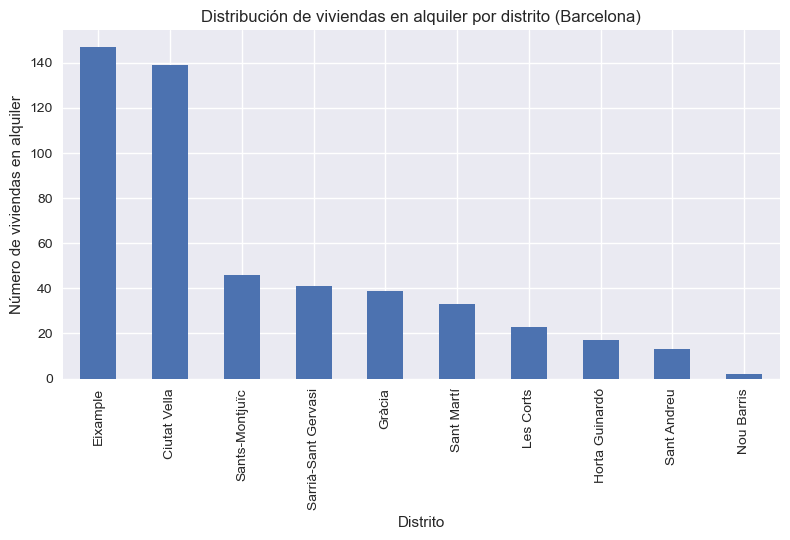

In [151]:
# Conteo de alquileres por distrito
district_counts_alquiler = barcelona_alquiler["district"].value_counts()

plt.figure()
district_counts_alquiler.plot(kind="bar")
plt.title("Distribución de viviendas en alquiler por distrito (Barcelona)")
plt.xlabel("Distrito")
plt.ylabel("Número de viviendas en alquiler")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [152]:
precio_medio_general_alquiler = barcelona_alquiler["price"].mean()

print(f"Precio medio de alquiler de una vivienda en Barcelona: {precio_medio_general_alquiler:.2f} €")

Precio medio de alquiler de una vivienda en Barcelona: 1792.22 €


In [153]:
precio_medio_distrito_alquiler = (barcelona_alquiler.groupby("district")["price"].mean().sort_values(ascending=False))
precio_medio_distrito_alquiler

district
Les Corts              2085.652174
Sant Martí             2035.000000
Eixample               2022.598639
Sarrià-Sant Gervasi    1991.195122
Gràcia                 1789.717949
Horta Guinardó         1560.705882
Ciutat Vella           1549.057554
Sants-Montjuïc         1527.282609
Sant Andreu            1347.692308
Nou Barris             1300.000000
Name: price, dtype: float64

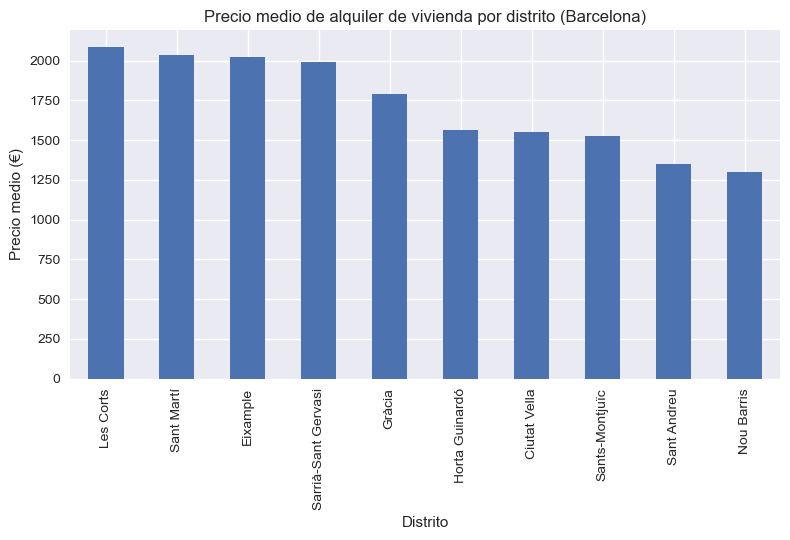

In [154]:
plt.figure()
precio_medio_distrito_alquiler.plot(kind="bar")
plt.title("Precio medio de alquiler de vivienda por distrito (Barcelona)")
plt.xlabel("Distrito")
plt.ylabel("Precio medio (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

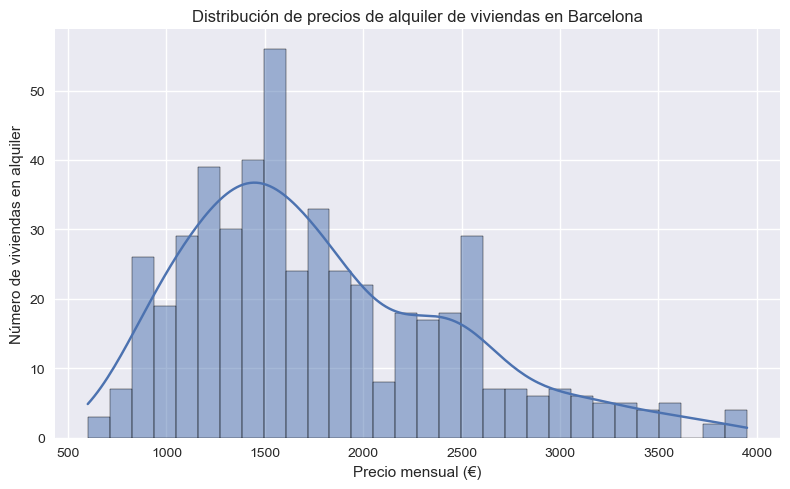

In [155]:
prices = barcelona_alquiler["price"]
plt.figure(figsize=(8, 5))
sns.histplot(
    prices,
    bins=30,
    kde=True
)

plt.title("Distribución de precios de alquiler de viviendas en Barcelona")
plt.xlabel("Precio mensual (€)")
plt.ylabel("Número de viviendas en alquiler")
plt.tight_layout()
plt.show()

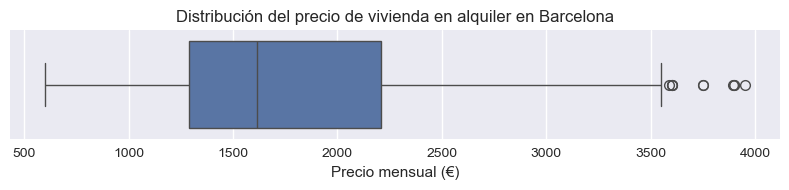

In [156]:
plt.figure(figsize=(8, 2))
sns.boxplot(x=prices)
plt.title("Distribución del precio de vivienda en alquiler en Barcelona")
plt.xlabel("Precio mensual (€)")
plt.tight_layout()
plt.show()

## 3.3 Dataset barcelona_compraventa

In [157]:
barcelona_compraventa = pd.read_csv("barcelona_compraventa.csv")
barcelona_compraventa.head()

,propertyCode,thumbnail,externalReference,numPhotos,floor,price,priceInfo,propertyType,operation,size,...,hasStaging,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,exterior,highlight,parkingSpace,newDevelopmentFinished
0,110175870,https://img4.idealista.com/blur/480_360_mq/0/i...,GC03261,28,1,467000.0,"{'price': {'amount': 467000.0, 'currencySuffix...",flat,sale,106.0,...,False,{},[],False,False,False,NaN,NaN,NaN,NaN
1,108908893,https://img4.idealista.com/blur/480_360_mq/0/i...,DH-918,29,5,330000.0,"{'price': {'amount': 330000.0, 'currencySuffix...",flat,sale,87.0,...,False,{},[],False,False,False,NaN,NaN,NaN,NaN
2,110175646,https://img4.idealista.com/blur/480_360_mq/0/i...,AM01872DR,31,6,330000.0,"{'price': {'amount': 330000.0, 'currencySuffix...",flat,sale,61.0,...,False,{},[],False,False,False,True,NaN,NaN,NaN
3,110175552,https://img4.idealista.com/blur/480_360_mq/0/i...,NATORR200,27,2,498000.0,"{'price': {'amount': 498000.0, 'currencySuffix...",flat,sale,102.0,...,False,{},[],False,False,False,True,NaN,NaN,NaN
4,110175550,https://img4.idealista.com/blur/480_360_mq/0/i...,NAIN105,19,2,425000.0,"{'price': {'amount': 425000.0, 'currencySuffix...",flat,sale,75.0,...,False,{},[],False,False,False,True,NaN,NaN,NaN


In [158]:
barcelona_compraventa.shape

(2607, 44)

In [159]:
barcelona_compraventa.columns

Index(['propertyCode', 'thumbnail', 'externalReference', 'numPhotos', 'floor',
       'price', 'priceInfo', 'propertyType', 'operation', 'size', 'rooms',
       'bathrooms', 'address', 'province', 'municipality', 'district',
       'country', 'neighborhood', 'latitude', 'longitude', 'showAddress',
       'url', 'description', 'hasVideo', 'status', 'newDevelopment', 'hasLift',
       'priceByArea', 'change', 'detailedType', 'suggestedTexts', 'hasPlan',
       'has3DTour', 'has360', 'hasStaging', 'savedAd', 'notes',
       'topNewDevelopment', 'newDevelopmentHighlight', 'topPlus', 'exterior',
       'highlight', 'parkingSpace', 'newDevelopmentFinished'],
      dtype='object')

In [160]:
# Se analiza si existen duplicados
print(f"Total anuncios: {len(barcelona_alquiler)}")
print(f"Anuncios únicos: {barcelona_alquiler['propertyCode'].nunique()}")

Total anuncios: 500
Anuncios únicos: 500


No existen valores duplicados

In [161]:
barcelona_compraventa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2607 entries, 0 to 2606
Data columns (total 44 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   propertyCode             2607 non-null   int64  
 1   thumbnail                2598 non-null   object 
 2   externalReference        2122 non-null   object 
 3   numPhotos                2607 non-null   int64  
 4   floor                    2411 non-null   object 
 5   price                    2607 non-null   float64
 6   priceInfo                2607 non-null   object 
 7   propertyType             2607 non-null   object 
 8   operation                2607 non-null   object 
 9   size                     2607 non-null   float64
 10  rooms                    2607 non-null   int64  
 11  bathrooms                2607 non-null   int64  
 12  address                  2607 non-null   object 
 13  province                 2607 non-null   object 
 14  municipality            

In [162]:
barcelona_compraventa["district"].unique()

array(['Sants-Montjuïc', 'Sant Martí', 'Gràcia', 'Eixample',
       'Sarrià-Sant Gervasi', 'Sant Andreu', 'Horta Guinardó',
       'Les Corts', 'Nou Barris', 'Ciutat Vella'], dtype=object)

In [163]:
# Se modifica el nombre de Distrito cambiando espacio por guión 
barcelona_compraventa["district"] = (barcelona_compraventa["district"].replace({"Horta Guinardó": "Horta-Guinardó"}))

In [164]:
precio_por_exterior = (
    barcelona_compraventa
    .groupby("exterior")["price"]
    .mean()
    .sort_values(ascending=False)
)

precio_por_exterior

exterior
True     460982.168880
False    354401.660517
Name: price, dtype: float64

In [165]:
barcelona_compraventa.isnull().sum().sort_values(ascending=False)

newDevelopmentFinished     2545
parkingSpace               2352
highlight                  1574
externalReference           485
exterior                    228
floor                       196
hasLift                      73
status                        9
thumbnail                     9
description                   2
numPhotos                     0
propertyCode                  0
bathrooms                     0
rooms                         0
size                          0
operation                     0
propertyType                  0
priceInfo                     0
price                         0
address                       0
longitude                     0
latitude                      0
neighborhood                  0
showAddress                   0
country                       0
province                      0
municipality                  0
district                      0
priceByArea                   0
newDevelopment                0
url                           0
hasVideo

In [166]:
# Columnas que tienen valores nulos
cols_with_na = barcelona_compraventa.columns[
    barcelona_compraventa.isnull().sum() > 0
]

# Value_counts de cada una
for col in cols_with_na:
    print(f"\n===== {col} =====")
    print(barcelona_compraventa[col].value_counts(dropna=False))


===== thumbnail =====
thumbnail
NaN                                                                                             9
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/1a/76/88/1053548851.webp    6
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/46/63/a2/1395130026.webp    3
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/59/66/4d/1281944728.webp    3
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/c9/b5/93/1139696048.webp    2
                                                                                               ..
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/7d/e1/8f/1397428320.webp    1
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/d4/58/7b/1397427476.webp    1
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/99/b2/fb/1397420151.webp    1
https://img4.idealista.com/blur/480_360_mq/0/id.pro.es.image.master/f4/77/50/13974202

In [167]:
barcelona_compraventa["status"] = (barcelona_compraventa["status"].fillna("good"))

In [168]:
barcelona_compraventa["exterior"].value_counts(dropna=False)

exterior
True     2108
False     271
NaN       228
Name: count, dtype: int64

In [169]:
precio_por_exterior = (barcelona_compraventa.groupby("exterior")["price"].mean().sort_values(ascending=False))
precio_por_exterior

exterior
True     460982.168880
False    354401.660517
Name: price, dtype: float64

In [170]:
def recodificar_floor(x):
    # NaN a desconocido
    if pd.isna(x):
        return "desconocido"
    
    x = str(x).lower().strip()

    # Texto
    if x in ["bj", "en", "ss", "-1"]:
        return "bajo"
    if x == "st":
        return "alto"

    # Valores numéricos
    try:
        n = int(x)
        if n <= 1:
            return "bajo"
        elif 2 <= n <= 4:
            return "intermedio"
        elif n >= 5:
            return "alto"
        else:
            return "desconocido"
    except:
        return "desconocido"

barcelona_compraventa["floor"] = barcelona_compraventa["floor"].apply(recodificar_floor)
barcelona_compraventa["floor"].value_counts(dropna=False)

floor
intermedio     1054
bajo            909
alto            448
desconocido     196
Name: count, dtype: int64

In [171]:
barcelona_compraventa["exterior"] = barcelona_compraventa["exterior"].fillna("desconocido")
barcelona_compraventa.groupby("exterior")["price"].mean()

exterior
False          354401.660517
True           460982.168880
desconocido    425678.070175
Name: price, dtype: float64

In [172]:
barcelona_compraventa = barcelona_compraventa.drop(columns=["externalReference"])

In [173]:
barcelona_compraventa = barcelona_compraventa.drop( columns=["highlight"]
)

In [174]:
barcelona_compraventa["parkingSpace"] = (barcelona_compraventa["parkingSpace"].fillna(False))
barcelona_compraventa["parkingSpace"].value_counts(dropna=False)

parkingSpace
False                                                                                              2352
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}                                    167
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 35000.0}      20
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 20000.0}      11
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 30000.0}       9
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 25000.0}       9
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 18000.0}       5
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 17000.0}       3
{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': False, 'parkingSpacePrice': 60000.0}       3
{'hasParkingSpace': True, 'isParkingSpaceIncludedIn

In [175]:
barcelona_compraventa["hasLift"] = (barcelona_compraventa["hasLift"].fillna(False))

C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\2382342997.py:1: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [176]:
barcelona_compraventa = barcelona_compraventa.drop(columns=["newDevelopmentFinished"])

Se observa como el dataset tiene 2 valores nulos en description, 9 en thumbnail. Este caso no se realiza ninguna acción. No son variables que vayan a afectar al desarrollo.
Existen 9 valores faltantes en status se va a considerar que el estado de la vivienda es bueno. La variable hasLift tiene 73 valores NaN, como por lo general el disponer de ascensor es un valor añadido el hecho de no especificarlo puede indicar que no lo tenga. Los valores NaN se recodifican cono False. La variable floor tiene 196 valores faltantes. Se va a realizar la recodificación de los NaN de exterior como desconocido. Se ha analizado el precio medio entre ser de exterior y no serlo y es muy significativo por lo que se opta por calificarlos como desconocido. La variable externalReference se elimina ya que no aporta nada al trabajo. La variable highlight contiene 1574 valores nulos. No representa una característica de la vivienda sino el tipo de anuncio en el portal. Se decide eliminarla. La variable parkingSpace se va a tratar como en el dataset de barcelona_alquiler. Se va a codificar los valores NaN por False. La variable newDevelopmentFinished indica si la vivienda de obra nueva está acabada. solo existen 2 registros que esté acabada la vivienda por tanto no va a aportar un gran valor al estudio. Se decide eliminar la variable. 

In [177]:
barcelona_compraventa.isnull().sum().sort_values(ascending=False)

thumbnail                  9
description                2
propertyCode               0
floor                      0
numPhotos                  0
priceInfo                  0
propertyType               0
operation                  0
price                      0
size                       0
rooms                      0
address                    0
bathrooms                  0
municipality               0
district                   0
country                    0
province                   0
neighborhood               0
latitude                   0
showAddress                0
longitude                  0
url                        0
hasVideo                   0
status                     0
newDevelopment             0
hasLift                    0
priceByArea                0
change                     0
detailedType               0
suggestedTexts             0
hasPlan                    0
has3DTour                  0
has360                     0
hasStaging                 0
savedAd       

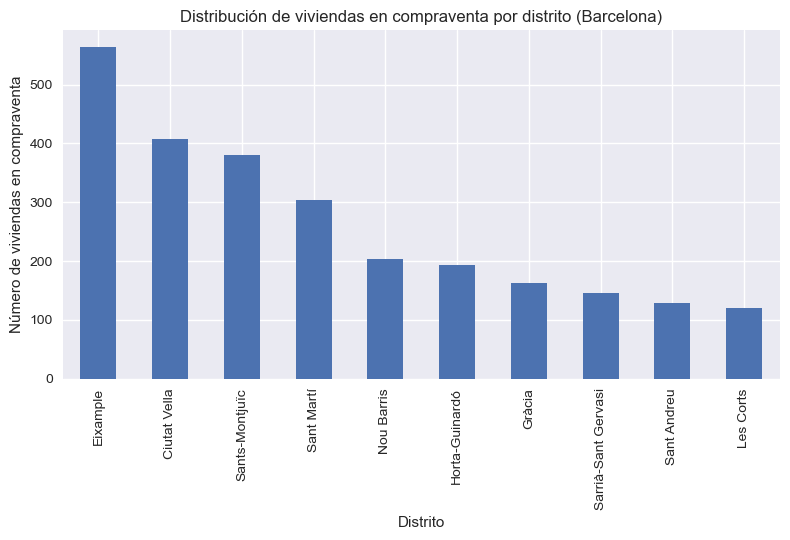

In [178]:
# Conteo de vivientas de cmopraventa por distrito
district_counts_compraventa = barcelona_compraventa["district"].value_counts()

plt.figure()
district_counts_compraventa.plot(kind="bar")
plt.title("Distribución de viviendas en compraventa por distrito (Barcelona)")
plt.xlabel("Distrito")
plt.ylabel("Número de viviendas en compraventa")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [179]:
precio_medio_general_compraventa = barcelona_compraventa["price"].mean()

print(f"Precio medio de compra de una vivienda en Barcelona: {precio_medio_general_compraventa:.2f} €")

Precio medio de compra de una vivienda en Barcelona: 446815.44 €


In [180]:
precio_medio_distrito_compraventa = (barcelona_compraventa.groupby("district")["price"].mean().sort_values(ascending=False))
precio_medio_distrito_compraventa

district
Sarrià-Sant Gervasi    693562.068966
Eixample               594252.092199
Les Corts              533132.083333
Gràcia                 457432.515337
Ciutat Vella           389108.943489
Sant Andreu            387673.351562
Sant Martí             387021.570957
Sants-Montjuïc         373457.434211
Horta-Guinardó         371863.948187
Nou Barris             253162.745098
Name: price, dtype: float64

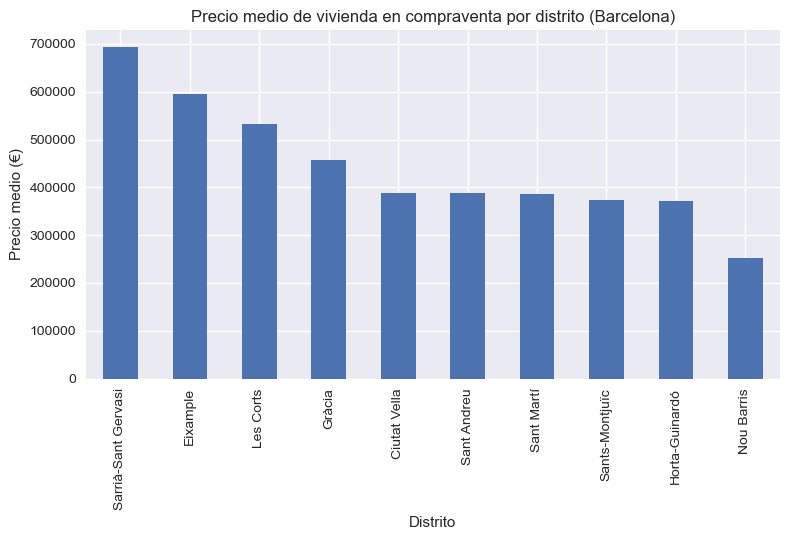

In [181]:
plt.figure()
precio_medio_distrito_compraventa.plot(kind="bar")
plt.title("Precio medio de vivienda en compraventa por distrito (Barcelona)")
plt.xlabel("Distrito")
plt.ylabel("Precio medio (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

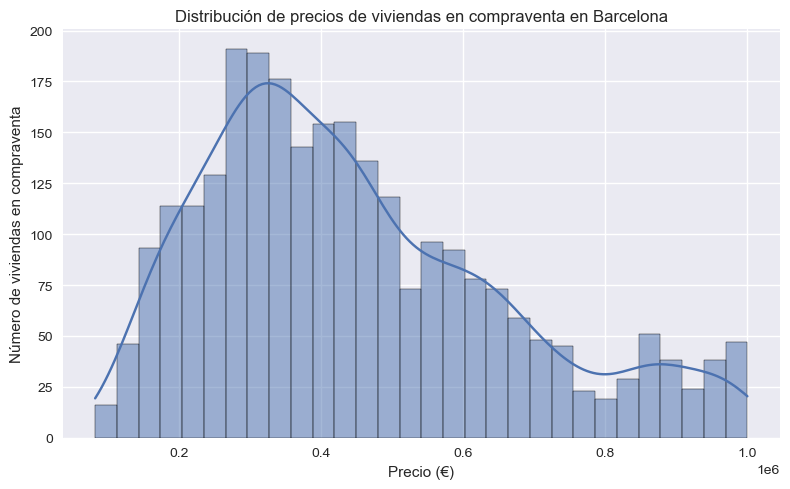

In [182]:
prices = barcelona_compraventa["price"]
plt.figure(figsize=(8, 5))
sns.histplot(
    prices,
    bins=30,
    kde=True
)

plt.title("Distribución de precios de viviendas en compraventa en Barcelona")
plt.xlabel("Precio (€)")
plt.ylabel("Número de viviendas en compraventa")
plt.tight_layout()
plt.show()

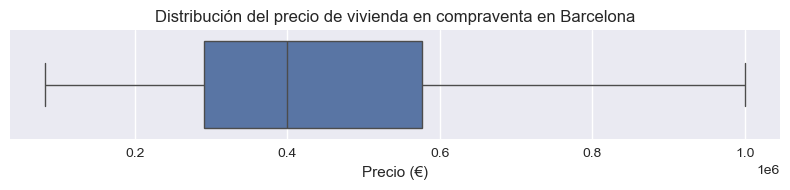

In [183]:
plt.figure(figsize=(8, 2))
sns.boxplot(x=prices)
plt.title("Distribución del precio de vivienda en compraventa en Barcelona")
plt.xlabel("Precio (€)")
plt.tight_layout()
plt.show()

In [184]:
barcelona_compraventa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2607 entries, 0 to 2606
Data columns (total 41 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   propertyCode             2607 non-null   int64  
 1   thumbnail                2598 non-null   object 
 2   numPhotos                2607 non-null   int64  
 3   floor                    2607 non-null   object 
 4   price                    2607 non-null   float64
 5   priceInfo                2607 non-null   object 
 6   propertyType             2607 non-null   object 
 7   operation                2607 non-null   object 
 8   size                     2607 non-null   float64
 9   rooms                    2607 non-null   int64  
 10  bathrooms                2607 non-null   int64  
 11  address                  2607 non-null   object 
 12  province                 2607 non-null   object 
 13  municipality             2607 non-null   object 
 14  district                

In [185]:
barcelona_compraventa.head()

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has3DTour,has360,hasStaging,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,exterior,parkingSpace
0,110175870,https://img4.idealista.com/blur/480_360_mq/0/i...,28,bajo,467000.0,"{'price': {'amount': 467000.0, 'currencySuffix...",flat,sale,106.0,4,...,False,False,False,{},[],False,False,False,desconocido,False
1,108908893,https://img4.idealista.com/blur/480_360_mq/0/i...,29,alto,330000.0,"{'price': {'amount': 330000.0, 'currencySuffix...",flat,sale,87.0,2,...,False,False,False,{},[],False,False,False,desconocido,False
2,110175646,https://img4.idealista.com/blur/480_360_mq/0/i...,31,alto,330000.0,"{'price': {'amount': 330000.0, 'currencySuffix...",flat,sale,61.0,3,...,False,False,False,{},[],False,False,False,True,False
3,110175552,https://img4.idealista.com/blur/480_360_mq/0/i...,27,intermedio,498000.0,"{'price': {'amount': 498000.0, 'currencySuffix...",flat,sale,102.0,4,...,False,False,False,{},[],False,False,False,True,False
4,110175550,https://img4.idealista.com/blur/480_360_mq/0/i...,19,intermedio,425000.0,"{'price': {'amount': 425000.0, 'currencySuffix...",flat,sale,75.0,2,...,False,False,False,{},[],False,False,False,True,False


In [186]:
#Se analizan los formatos
barcelona_compraventa.describe()

,propertyCode,numPhotos,price,size,rooms,bathrooms,latitude,longitude,priceByArea
count,2.607000e+03,2607.000000,2607.000000,2607.000000,2607.000000,2607.000000,2607.000000,2607.000000,2607.000000
mean,1.097588e+08,24.598773,446815.443805,89.986191,2.703107,1.477944,41.398322,2.165138,5151.423092
std,2.989213e+06,12.626555,213244.526169,126.092389,1.087536,0.622081,0.022104,0.020911,1651.279213
min,2.693412e+07,0.000000,82000.000000,23.000000,0.000000,0.000000,41.351175,2.089508,53.000000
25%,1.099755e+08,16.000000,290000.000000,65.000000,2.000000,1.000000,41.380237,2.149568,4017.500000
50%,1.100536e+08,24.000000,400000.000000,81.000000,3.000000,1.000000,41.394565,2.166753,5000.000000
75%,1.101203e+08,32.000000,576000.000000,102.000000,3.000000,2.000000,41.412898,2.178404,6076.000000
max,1.101759e+08,82.000000,1000000.000000,6249.000000,9.000000,6.000000,41.463608,2.218659,13636.000000


In [187]:
barcelona_compraventa["rooms"].value_counts().sort_index()

rooms
0      60
1     269
2     715
3    1015
4     471
5      53
6      18
7       4
9       2
Name: count, dtype: int64

In [188]:
barcelona_compraventa[barcelona_compraventa["rooms"] == 9]

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has3DTour,has360,hasStaging,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,exterior,parkingSpace
1851,110010266,https://img4.idealista.com/blur/480_360_mq/0/i...,31,bajo,870000.0,"{'price': {'amount': 870000.0, 'currencySuffix...",flat,sale,180.0,9,...,False,False,False,{},[],False,False,False,True,False
2355,109957793,https://img4.idealista.com/blur/480_360_mq/0/i...,41,desconocido,698000.0,"{'price': {'amount': 698000.0, 'currencySuffix...",chalet,sale,188.0,9,...,False,False,False,{},[],False,False,False,desconocido,False


In [189]:
barcelona_compraventa["district"].unique()

array(['Sants-Montjuïc', 'Sant Martí', 'Gràcia', 'Eixample',
       'Sarrià-Sant Gervasi', 'Sant Andreu', 'Horta-Guinardó',
       'Les Corts', 'Nou Barris', 'Ciutat Vella'], dtype=object)

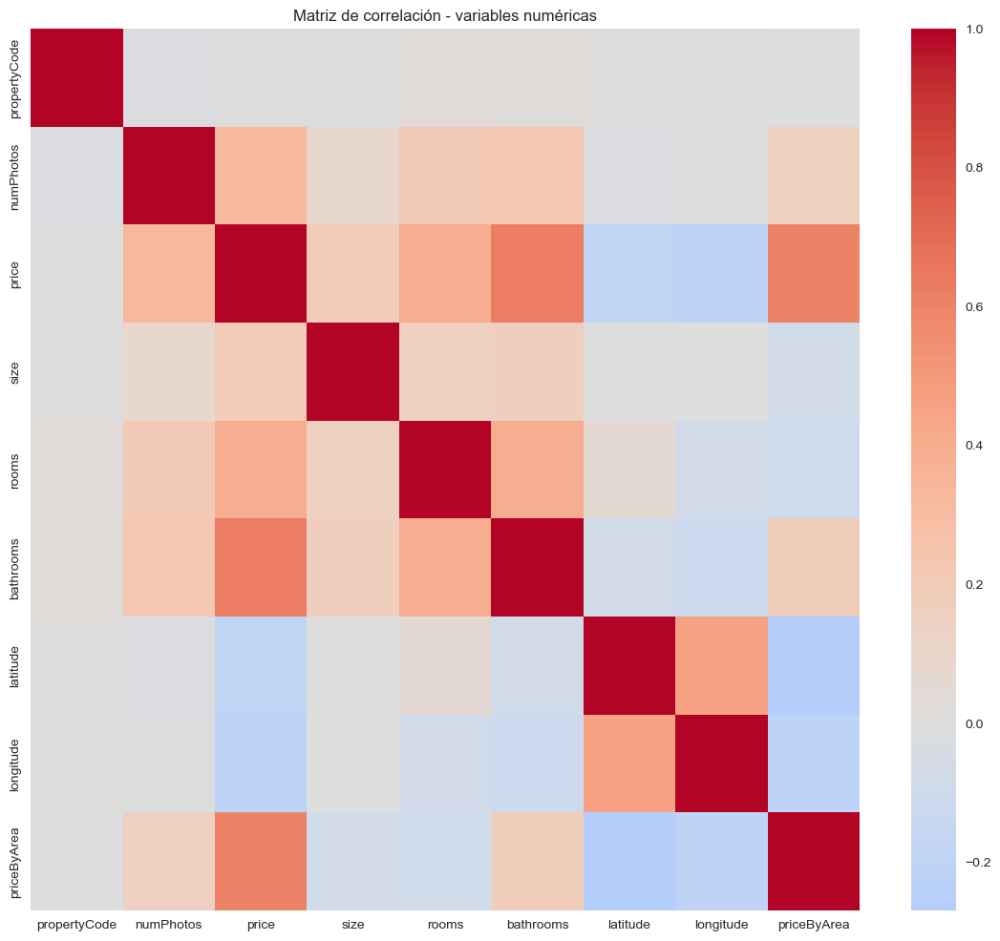

In [190]:
num_vars = barcelona_compraventa.select_dtypes(include=["int64", "float64"])

corr = num_vars.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Matriz de correlación - variables numéricas")
plt.show()

In [191]:
num_vars = barcelona_compraventa.select_dtypes(include=["float64", "int64"])
corr = num_vars.corr()
corr

,propertyCode,numPhotos,price,size,rooms,bathrooms,latitude,longitude,priceByArea
propertyCode,1.000000,-0.017485,0.013074,0.005280,0.023233,0.021815,0.017344,0.012625,0.002579
numPhotos,-0.017485,1.000000,0.324497,0.079436,0.213174,0.229949,-0.016290,-0.005088,0.149594
price,0.013074,0.324497,1.000000,0.191910,0.397526,0.624558,-0.194055,-0.219722,0.604578
size,0.005280,0.079436,0.191910,1.000000,0.148154,0.169148,0.003625,-0.003407,-0.080434
rooms,0.023233,0.213174,0.397526,0.148154,1.000000,0.398133,0.059071,-0.088174,-0.100048
bathrooms,0.021815,0.229949,0.624558,0.169148,0.398133,1.000000,-0.090421,-0.115710,0.172870
latitude,0.017344,-0.016290,-0.194055,0.003625,0.059071,-0.090421,1.000000,0.456260,-0.269632
longitude,0.012625,-0.005088,-0.219722,-0.003407,-0.088174,-0.115710,0.456260,1.000000,-0.204839
priceByArea,0.002579,0.149594,0.604578,-0.080434,-0.100048,0.172870,-0.269632,-0.204839,1.000000


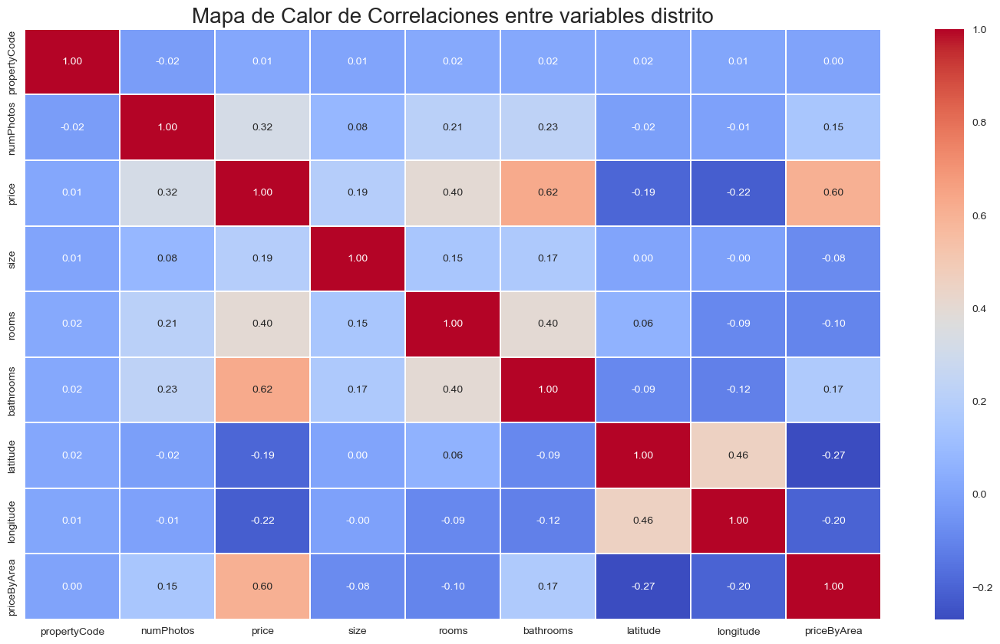

In [192]:
plt.figure(figsize=(18,10))
sns.heatmap(corr, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.1)
plt.title("Mapa de Calor de Correlaciones entre variables distrito", fontsize=20)
plt.show()

## 3.4 Dataset para modelo de predicion barcelona_model

In [193]:
#Se eliminan las variables que son de datos del portal Idealista
anuncio_vars = [
    "propertyCode",
    "thumbnail",
    "priceInfo",
    "url",
    "description",
    "suggestedTexts",
    "savedAd",
    "notes",
    "status",
    "change",
    "numPhotos",  
    "hasVideo",
    "has3DTour",
    "has360",
    "hasStaging",
    "topPlus",
    "topNewDevelopment",
    "newDevelopmentHighlight"
]

In [194]:
barcelona_model = barcelona_compraventa.drop(columns=anuncio_vars)

In [195]:
# Selección de conjunto de datos y variable objetivo
y = barcelona_model["price"]
X = barcelona_model.drop(columns=["price"])

In [196]:
# Separación de variables numéricas yvariables categóricas
num_vars = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
cat_vars = X.select_dtypes(include=["object", "bool"]).columns.tolist()

In [197]:
#Se realiza un modelo base para ver el punto de partida con las variables numéricas
num_vars_clean = [v for v in num_vars if v not in ["priceByArea"]] # data leakage
X_num = X[num_vars_clean]

lr = LinearRegression()
rmse = -cross_val_score(
    lr, X_num, y,
    scoring="neg_root_mean_squared_error",
    cv=5
).mean()

rmse

np.float64(298759.0691679264)

In [198]:
# Se prueba con LASSO

In [199]:
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pipe_lasso = Pipeline([("scaler", StandardScaler()),("lasso", Lasso(alpha=0.01))])
pipe_lasso.fit(X_num, y)
importances_num = (pd.Series(pipe_lasso.named_steps["lasso"].coef_,index=X_num.columns).sort_values(key=abs, ascending=False))

importances_num

bathrooms    110757.087130
rooms         37970.042919
latitude     -24864.390668
longitude    -19280.703611
size          16580.572692
dtype: float64

In [200]:
# Análsis variables categóricas
X_cat = pd.get_dummies(X[cat_vars],drop_first=True)

In [201]:
X_full = pd.concat([X_num, X_cat], axis=1)

In [202]:
pipe_lasso.fit(X_full, y)

importances_all = (pd.Series(pipe_lasso.named_steps["lasso"].coef_,index=X_full.columns).sort_values(key=abs, ascending=False))

importances_all.head(30)

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.635e+12, tolerance: 1.185e+10



bathrooms                                                                        65341.831477
latitude                                                                        -50400.387963
longitude                                                                       -41913.360606
rooms                                                                            38337.239173
district_Sarrià-Sant Gervasi                                                     37635.562903
district_Eixample                                                                35961.465687
newDevelopment                                                                   34739.450452
neighborhood_La Dreta de l'Eixample                                              30114.285692
neighborhood_Les Roquetes                                                       -28324.856377
hasLift                                                                          27385.576738
district_Les Corts                                          

In [203]:
# =========================================================
# Dataset de modelado: eliminar variables de anuncio / identificadores / leakage
# =========================================================
anuncio_vars = [
    "propertyCode", "thumbnail", "priceInfo", "url", "description",
    "suggestedTexts","numPhotos","savedAd","showAddress","operation", "notes", "status", "change",
    "hasVideo","has3DTour", "has360", "hasStaging","hasPlan",
    "topPlus", "topNewDevelopment", "newDevelopmentHighlight"
]

# data leakage
leakage_vars = ["priceByArea"]

# alta cardinalidad 
cardinality_vars = ["address"]

barcelona_model = barcelona_compraventa.drop(
    columns=[c for c in (anuncio_vars + leakage_vars + cardinality_vars) if c in barcelona_compraventa.columns]).copy()

In [204]:
# =========================================================
# Separar target y features
# =========================================================
y = barcelona_model["price"]
X = barcelona_model.drop(columns=["price"])

In [205]:
# =========================================================
# Separar variables numéricas y categóricas
# =========================================================
num_vars = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
cat_vars = X.select_dtypes(include=["object", "bool"]).columns.tolist()

In [206]:
# =========================================================
# Baseline
# =========================================================
X_num = X[num_vars]

lr = LinearRegression()
rmse_num = -cross_val_score(
    lr, X_num, y,
    scoring="neg_root_mean_squared_error",
    cv=5
).mean()

print(f"RMSE baseline (solo numéricas): {rmse_num:,.2f}")

RMSE baseline (solo numéricas): 298,759.07


In [207]:
# =========================================================
# LASSO numéricas (análisis de importancia)
# =========================================================
pipe_lasso_num = Pipeline([
    ("scaler", StandardScaler()),
    ("lasso", Lasso(alpha=0.05, max_iter=10000, random_state=42))
])

pipe_lasso_num.fit(X_num, y)

importances_num = (
    pd.Series(pipe_lasso_num.named_steps["lasso"].coef_, index=X_num.columns)
    .sort_values(key=abs, ascending=False)
)

print("\nImportancia (LASSO) - numéricas:")
print(importances_num)


Importancia (LASSO) - numéricas:
bathrooms    110757.068085
rooms         37970.017138
latitude     -24864.361874
longitude    -19280.681339
size          16580.539317
dtype: float64


In [208]:
# =========================================================
# One-Hot de categóricas y LASSO
# =========================================================
X_cat = pd.get_dummies(X[cat_vars], drop_first=True)
X_full = pd.concat([X_num, X_cat], axis=1)

pipe_lasso_full = Pipeline([
    ("scaler", StandardScaler(with_mean=False)),  # por seguridad con muchas dummies
    ("lasso", Lasso(alpha=0.05, max_iter=20000, random_state=42))
])

pipe_lasso_full.fit(X_full, y)

importances_all = (
    pd.Series(pipe_lasso_full.named_steps["lasso"].coef_, index=X_full.columns)
    .sort_values(key=abs, ascending=False)
)

print("\nTop 30 importancias (LASSO) - numéricas + categóricas:")
print(importances_all.head(30))


Top 30 importancias (LASSO) - numéricas + categóricas:
bathrooms                                                                        70637.254460
district_Eixample                                                                49373.603379
rooms                                                                            39007.653055
district_Sarrià-Sant Gervasi                                                     37939.883954
district_Sants-Montjuïc                                                         -37071.568675
longitude                                                                       -35031.781626
hasLift                                                                          32505.512484
neighborhood_La Dreta de l'Eixample                                              26895.065575
district_Horta-Guinardó                                                         -24638.058898
detailedType_{'typology': 'flat'}                                               -22778.665033
park

C:\Users\abelmora\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.049e+11, tolerance: 1.185e+10



In [209]:
# Se observa que el nombre de distrito aparece separado por espacio en lugar de guion antes de realizar el merge se modifica el nombre
barcelona_model["district"] = barcelona_model["district"].replace({"Horta Guinardó": "Horta-Guinardó"})

In [210]:
barcelona_model.head()

,floor,price,propertyType,size,rooms,bathrooms,province,municipality,district,country,neighborhood,latitude,longitude,newDevelopment,hasLift,detailedType,exterior,parkingSpace
0,bajo,467000.0,flat,106.0,4,1,Barcelona,Barcelona,Sants-Montjuïc,es,Hostafrancs,41.371173,2.142062,False,True,{'typology': 'flat'},desconocido,False
1,alto,330000.0,flat,87.0,2,1,Barcelona,Barcelona,Sants-Montjuïc,es,El Poble Sec - Parc de Montjuïc,41.375861,2.169663,False,True,{'typology': 'flat'},desconocido,False
2,alto,330000.0,flat,61.0,3,1,Barcelona,Barcelona,Sant Martí,es,Diagonal Mar i el Front Marítim del Poblenou,41.406611,2.206595,False,True,{'typology': 'flat'},True,False
3,intermedio,498000.0,flat,102.0,4,2,Barcelona,Barcelona,Gràcia,es,Vila de Gràcia,41.406545,2.154296,False,True,{'typology': 'flat'},True,False
4,intermedio,425000.0,flat,75.0,2,2,Barcelona,Barcelona,Eixample,es,La Sagrada Família,41.405821,2.171016,False,True,{'typology': 'flat'},True,False


In [211]:
# Se retoman los PCA obtenidos y se le añade la columna territorio a los resultados
pc_cols = [f"PC{i+1}" for i in range(pca.n_components_)]

# Dataframe con scores PCA
df_pca_scores = pd.DataFrame(X_pca, columns=pc_cols)

# Se añade el distrito
df_pca_scores["district"] = df_pca["Territorio"].values

df_pca_scores.head()

,PC1,PC2,PC3,PC4,PC5,district
0,0.873283,-6.891491,-0.186301,0.528883,-0.761763,Nou Barris
1,0.370219,-2.320131,2.205924,1.264185,0.902818,Sant Martí
2,-3.491568,-2.987034,-4.066219,1.086763,1.882681,Horta-Guinardó
3,-3.510172,1.659693,1.683852,-1.077455,0.489657,Les Corts
4,0.768576,-1.616247,1.482536,-2.506347,0.493568,Sants-Montjuïc


In [212]:
barcelona_model = barcelona_model.merge(df_pca_scores,on="district",how="left")

In [213]:
barcelona_model[pc_cols].isna().sum()

PC1    0
PC2    0
PC3    0
PC4    0
PC5    0
dtype: int64

In [214]:
barcelona_model.head()

,floor,price,propertyType,size,rooms,bathrooms,province,municipality,district,country,...,newDevelopment,hasLift,detailedType,exterior,parkingSpace,PC1,PC2,PC3,PC4,PC5
0,bajo,467000.0,flat,106.0,4,1,Barcelona,Barcelona,Sants-Montjuïc,es,...,False,True,{'typology': 'flat'},desconocido,False,0.768576,-1.616247,1.482536,-2.506347,0.493568
1,alto,330000.0,flat,87.0,2,1,Barcelona,Barcelona,Sants-Montjuïc,es,...,False,True,{'typology': 'flat'},desconocido,False,0.768576,-1.616247,1.482536,-2.506347,0.493568
2,alto,330000.0,flat,61.0,3,1,Barcelona,Barcelona,Sant Martí,es,...,False,True,{'typology': 'flat'},True,False,0.370219,-2.320131,2.205924,1.264185,0.902818
3,intermedio,498000.0,flat,102.0,4,2,Barcelona,Barcelona,Gràcia,es,...,False,True,{'typology': 'flat'},True,False,-2.084542,3.750748,-1.451214,2.461316,-2.278133
4,intermedio,425000.0,flat,75.0,2,2,Barcelona,Barcelona,Eixample,es,...,False,True,{'typology': 'flat'},True,False,1.933422,5.328904,1.853701,2.506433,1.427394


In [215]:
#Se eliminan las variables que no aportan valor pais, provincia, municipio ya que son siempre los mismos valores y detailetype que es un diccionario (vinculado con property type)
vars_to_drop = ["detailedType","province","municipality","country"]
barcelona_model = barcelona_model.drop(
    columns=[c for c in vars_to_drop if c in barcelona_model.columns])

In [216]:
barcelona_model.columns

Index(['floor', 'price', 'propertyType', 'size', 'rooms', 'bathrooms',
       'district', 'neighborhood', 'latitude', 'longitude', 'newDevelopment',
       'hasLift', 'exterior', 'parkingSpace', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5'],
      dtype='object')

In [217]:
barcelona_model.dtypes

floor              object
price             float64
propertyType       object
size              float64
rooms               int64
bathrooms           int64
district           object
neighborhood       object
latitude          float64
longitude         float64
newDevelopment       bool
hasLift              bool
exterior           object
parkingSpace       object
PC1               float64
PC2               float64
PC3               float64
PC4               float64
PC5               float64
dtype: object

# 4. Modelos

In [218]:
# Se selecciona variable objetivo
y = barcelona_model["price"]

# Se selecciona las variables no objetivo
X = barcelona_model.drop(columns=["price"])

# Para RMSE relativo (global)
price_mean = float(y.mean())
price_median = float(y.median())
print("Precio medio:", price_mean)
print("Precio mediana:", price_median)

# Variables categóricas
cat_features = X.select_dtypes(include=["object", "bool"]).columns.tolist()
print("Num cat features:", len(cat_features))

# Kfold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

Precio medio: 446815.44380514004
Precio mediana: 400000.0
Num cat features: 8


In [219]:
# Se crea un df resultados y una función para añadir los resultados de los modelos al df resultados
#Resultados
results_df = pd.DataFrame(columns=[
    "model",
    "rmse_mean",
    "rmse_std",
    "rmse_rel_mean",
    "rmse_rel_median",
    "time_sec",
    "params"
])
# Función para añadir los resultados del modelo al df results
def add_result(results_df, model_name, rmse_mean, rmse_std, params, price_mean, price_median, time_sec):
    return pd.concat([
        results_df,
        pd.DataFrame([{
            "model": model_name,
            "rmse_mean": rmse_mean,
            "rmse_std": rmse_std,
            "rmse_rel_mean": rmse_mean / price_mean,
            "rmse_rel_median": rmse_mean / price_median,
            "time_sec": time_sec,
            "params": str(params)
        }])
    ], ignore_index=True)

## 4.1 Modelo Ridge

In [220]:
# =========================================================
# Ridge (modelo lineal regularizado) + CV=5
# =========================================================

num_features = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
bool_features = X.select_dtypes(include=["bool"]).columns.tolist()
cat_features_ridge = X.select_dtypes(include=["object"]).columns.tolist()  # SOLO object

X_ridge = X.copy()

for c in bool_features:
    X_ridge[c] = X_ridge[c].astype(int)

# Se pasan categóricas a formato string (evita mezcla bool/str/dict dentro de object)
for c in cat_features_ridge:
    X_ridge[c] = X_ridge[c].astype(str).fillna("missing")

# Preprocesado
preprocess_ridge = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_features),
        ("bool", "passthrough", bool_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_features_ridge)
    ],
    remainder="drop"
)

# Modelo Ridge
ridge_params = {"alpha": 1.0}
pipe_ridge = Pipeline(steps=[
    ("prep", preprocess_ridge),
    ("ridge", Ridge(alpha=ridge_params["alpha"]))
])

# Cross-validation
t0 = time.perf_counter()

rmse_folds = []

for train_idx, test_idx in kf.split(X_ridge):
    X_train, X_test = X_ridge.iloc[train_idx], X_ridge.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model_fold = clone(pipe_ridge)
    model_fold.fit(X_train, y_train)

    y_pred = model_fold.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred) ** 0.5
    rmse_folds.append(rmse)

time_sec_ridge = time.perf_counter() - t0

rmse_mean_ridge = float(np.mean(rmse_folds))
rmse_std_ridge = float(np.std(rmse_folds))

print("RMSE Ridge (mean):", rmse_mean_ridge)
print("RMSE Ridge (std):", rmse_std_ridge)
print("Tiempo Ridge (s):", time_sec_ridge)

# Guardar en results_df
results_df = add_result(
    results_df,
    model_name="Ridge",
    rmse_mean=rmse_mean_ridge,
    rmse_std=rmse_std_ridge,
    params=ridge_params,
    price_mean=price_mean,
    price_median=price_median,
    time_sec=time_sec_ridge
)

results_df.sort_values("rmse_mean")


RMSE Ridge (mean): 228832.68976354846
RMSE Ridge (std): 230473.8048385368
Tiempo Ridge (s): 0.1389933999889763


C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\3801851600.py:14: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



,model,rmse_mean,rmse_std,rmse_rel_mean,rmse_rel_median,time_sec,params
0,Ridge,228832.689764,230473.804839,0.512141,0.572082,0.138993,{'alpha': 1.0}


## 4.2 Random Forest

In [221]:
# =========================================================
# RandomForest + CV=5
# =========================================================

num_features = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
bool_features = X.select_dtypes(include=["bool"]).columns.tolist()
cat_features_rf = X.select_dtypes(include=["object"]).columns.tolist()

# Copia para RF + limpieza de tipos
X_rf = X.copy()

for c in bool_features:
    X_rf[c] = X_rf[c].astype(int)

# Se pasan categóricas a string
for c in cat_features_rf:
    X_rf[c] = X_rf[c].astype(str).fillna("missing")

# Preprocesado (RF no necesita scaling)
preprocess_rf = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_features),
        ("bool", "passthrough", bool_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_features_rf)
    ],
    remainder="drop"
)

# Modelo RF
rf_params = {
    "n_estimators": 500,
    "max_depth": None,
    "min_samples_leaf": 2,
    "random_state": 42,
    "n_jobs": -1
}

pipe_rf = Pipeline(steps=[
    ("prep", preprocess_rf),
    ("rf", RandomForestRegressor(**rf_params))
])

# Cross-validation
t0 = time.perf_counter()
rmse_folds = []

for train_idx, test_idx in kf.split(X_rf):
    X_train, X_test = X_rf.iloc[train_idx], X_rf.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model_fold = clone(pipe_rf)
    model_fold.fit(X_train, y_train)

    y_pred = model_fold.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred) ** 0.5
    rmse_folds.append(rmse)

time_sec_rf = time.perf_counter() - t0

rmse_mean_rf = float(np.mean(rmse_folds))
rmse_std_rf = float(np.std(rmse_folds))

print("RMSE RandomForest (mean):", rmse_mean_rf)
print("RMSE RandomForest (std):", rmse_std_rf)
print("Tiempo RandomForest (s):", time_sec_rf)


# Guardar en results_df
results_df = add_result(
    results_df,
    model_name="RandomForest",
    rmse_mean=rmse_mean_rf,
    rmse_std=rmse_std_rf,
    params=rf_params,
    price_mean=price_mean,
    price_median=price_median,
    time_sec=time_sec_rf
)

results_df.sort_values("rmse_mean")

RMSE RandomForest (mean): 88584.43436403785
RMSE RandomForest (std): 4241.832235184651
Tiempo RandomForest (s): 9.251801599995815


,model,rmse_mean,rmse_std,rmse_rel_mean,rmse_rel_median,time_sec,params
1,RandomForest,88584.434364,4241.832235,0.198257,0.221461,9.251802,"{'n_estimators': 500, 'max_depth': None, 'min_..."
0,Ridge,228832.689764,230473.804839,0.512141,0.572082,0.138993,{'alpha': 1.0}


## 4.3 XGBoost

In [222]:
# =========================================================
# XGBoost (boosting clásico) + CV=5 + Early Stopping
# =========================================================
num_features = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
bool_features = X.select_dtypes(include=["bool"]).columns.tolist()
cat_features_xgb = X.select_dtypes(include=["object"]).columns.tolist()

# Copia + limpieza de tipos
X_xgb = X.copy()

for c in bool_features:
    X_xgb[c] = X_xgb[c].astype(int)

# Se pasan categóricas a string
for c in cat_features_xgb:
    X_xgb[c] = X_xgb[c].astype(str).fillna("missing")

# 3) Preprocesado - Numéricas: sin escalar - Booleanas: ya son 0/1 - Categóricas: One-Hot
preprocess_xgb = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_features),
        ("bool", "passthrough", bool_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_features_xgb),
    ]
)

# Parámetros XGBoost
params_xgb = {
    "n_estimators": 500,
    "learning_rate": 0.05,
    "max_depth": 6,
    "subsample": 0.8,
    "colsample_bytree": 0.8,
    "objective": "reg:squarederror",
    "random_state": 42,
    "n_jobs": -1
}

# Modelo XGBoost
pipe_xgb = Pipeline([
    ("prep", preprocess_xgb),
    ("xgb", XGBRegressor(**params_xgb))
])

# Cross-validation
t0 = time.perf_counter()
rmse_folds = []

for train_idx, test_idx in kf.split(X_xgb):
    X_train, X_test = X_xgb.iloc[train_idx], X_xgb.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model_fold = clone(pipe_xgb)
    model_fold.fit(X_train, y_train)

    y_pred = model_fold.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred) ** 0.5
    rmse_folds.append(rmse)
    
time_sec_xgb = time.perf_counter() - t0

rmse_mean_xgb = float(np.mean(rmse_folds))
rmse_std_xgb = float(np.std(rmse_folds))

print("RMSE XGBoost (mean):", rmse_mean_xgb)
print("RMSE XGBoost (std):", rmse_std_xgb)
print("Tiempo XGBoost (s):", time_sec_xgb)

# Guardar resultados
results_df = add_result(
    results_df,
    model_name="XGBoost",
    rmse_mean=rmse_mean_xgb,
    rmse_std=rmse_std_xgb,
    params=params_xgb,
    price_mean=price_mean,
    price_median=price_median,
    time_sec=time_sec_xgb
)

results_df.sort_values("rmse_mean")

RMSE XGBoost (mean): 83667.93187478764
RMSE XGBoost (std): 4035.35295598052
Tiempo XGBoost (s): 1.903833799995482


,model,rmse_mean,rmse_std,rmse_rel_mean,rmse_rel_median,time_sec,params
2,XGBoost,83667.931875,4035.352956,0.187254,0.209170,1.903834,"{'n_estimators': 500, 'learning_rate': 0.05, '..."
1,RandomForest,88584.434364,4241.832235,0.198257,0.221461,9.251802,"{'n_estimators': 500, 'max_depth': None, 'min_..."
0,Ridge,228832.689764,230473.804839,0.512141,0.572082,0.138993,{'alpha': 1.0}


## 4.4 CatBoost

In [223]:
# =========================================================
# CatBoost (boosting con categóricas nativas) + CV=5 + Early Stopping
# =========================================================

# Variables categóricas (CatBoost las gestiona sin One-Hot)
cat_features = X.select_dtypes(include=["object", "bool"]).columns.tolist()

# Configuración del modelo CatBoost - iterations: máximo de árboles (se recorta con early stopping)
# - learning_rate: tamaño del paso (más bajo es más estable) - depth: complejidad de cada árbol - early_stopping_rounds: parar si no mejora en X iteraciones
params_catboost = {
    "iterations": 1000,
    "learning_rate": 0.05,
    "depth": 8,
    "loss_function": "RMSE",
    "early_stopping_rounds": 30,
    "random_seed": 42,
    "verbose": 0
}

# Cross-validation con KFold
t0 = time.perf_counter()

rmse_folds = []

for train_idx, test_idx in kf.split(X):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    cat_model = CatBoostRegressor(**params_catboost)

    # Entrenamiento con conjunto de validación del fold
    cat_model.fit(
        X_train, y_train,
        cat_features=cat_features,
        eval_set=(X_test, y_test),
        use_best_model=True
    )

    # Predicción y RMSE del fold
    y_pred = cat_model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred) ** 0.5
    rmse_folds.append(rmse)

time_sec_cb = time.perf_counter() - t0

rmse_mean_cb = float(np.mean(rmse_folds))
rmse_std_cb  = float(np.std(rmse_folds))

print("RMSE CatBoost (mean):", rmse_mean_cb)
print("RMSE CatBoost (std):", rmse_std_cb)
print("Tiempo CatBoost (s):", time_sec_cb)

# Guardar resultados en results_df
results_df = add_result(
    results_df,
    model_name="CatBoost",
    rmse_mean=rmse_mean_cb,
    rmse_std=rmse_std_cb,
    params=params_catboost,
    price_mean=price_mean,
    price_median=price_median,
    time_sec=time_sec_cb
)

results_df.sort_values("rmse_mean")

RMSE CatBoost (mean): 83692.88957662872
RMSE CatBoost (std): 3102.3028168343076
Tiempo CatBoost (s): 183.18863439999404


,model,rmse_mean,rmse_std,rmse_rel_mean,rmse_rel_median,time_sec,params
2,XGBoost,83667.931875,4035.352956,0.187254,0.209170,1.903834,"{'n_estimators': 500, 'learning_rate': 0.05, '..."
3,CatBoost,83692.889577,3102.302817,0.187310,0.209232,183.188634,"{'iterations': 1000, 'learning_rate': 0.05, 'd..."
1,RandomForest,88584.434364,4241.832235,0.198257,0.221461,9.251802,"{'n_estimators': 500, 'max_depth': None, 'min_..."
0,Ridge,228832.689764,230473.804839,0.512141,0.572082,0.138993,{'alpha': 1.0}


In [224]:
results_df

,model,rmse_mean,rmse_std,rmse_rel_mean,rmse_rel_median,time_sec,params
0,Ridge,228832.689764,230473.804839,0.512141,0.572082,0.138993,{'alpha': 1.0}
1,RandomForest,88584.434364,4241.832235,0.198257,0.221461,9.251802,"{'n_estimators': 500, 'max_depth': None, 'min_..."
2,XGBoost,83667.931875,4035.352956,0.187254,0.209170,1.903834,"{'n_estimators': 500, 'learning_rate': 0.05, '..."
3,CatBoost,83692.889577,3102.302817,0.187310,0.209232,183.188634,"{'iterations': 1000, 'learning_rate': 0.05, 'd..."


El modelo CatBoost obtuvo un RMSE medio de aproximadamente 84 000 €, con una desviación estándar cercana a los 3 500 € entre los distintos folds de la validación cruzada. Estos resultados indican un buen nivel de precisión y una elevada estabilidad del modelo. En términos relativos, el error medio representa alrededor del 19 % del precio medio de la vivienda, lo que resulta razonable dado el rango de precios presente en el conjunto de datos.

In [225]:
results_df.style.format({
    "rmse_mean": "{:,.2f}",
    "rmse_std": "{:,.2f}",
    "rmse_rel_mean": "{:.3f}",
    "rmse_rel_median": "{:.3f}",
    "time_sec": "{:.3f}"
})

,model,rmse_mean,rmse_std,rmse_rel_mean,rmse_rel_median,time_sec,params
0,Ridge,"228,832.69","230,473.80",0.512,0.572,0.139,{'alpha': 1.0}
1,RandomForest,"88,584.43","4,241.83",0.198,0.221,9.252,"{'n_estimators': 500, 'max_depth': None, 'min_samples_leaf': 2, 'random_state': 42, 'n_jobs': -1}"
2,XGBoost,"83,667.93","4,035.35",0.187,0.209,1.904,"{'n_estimators': 500, 'learning_rate': 0.05, 'max_depth': 6, 'subsample': 0.8, 'colsample_bytree': 0.8, 'objective': 'reg:squarederror', 'random_state': 42, 'n_jobs': -1}"
3,CatBoost,"83,692.89","3,102.30",0.187,0.209,183.189,"{'iterations': 1000, 'learning_rate': 0.05, 'depth': 8, 'loss_function': 'RMSE', 'early_stopping_rounds': 30, 'random_seed': 42, 'verbose': 0}"


## 4.5 Graficos resultados

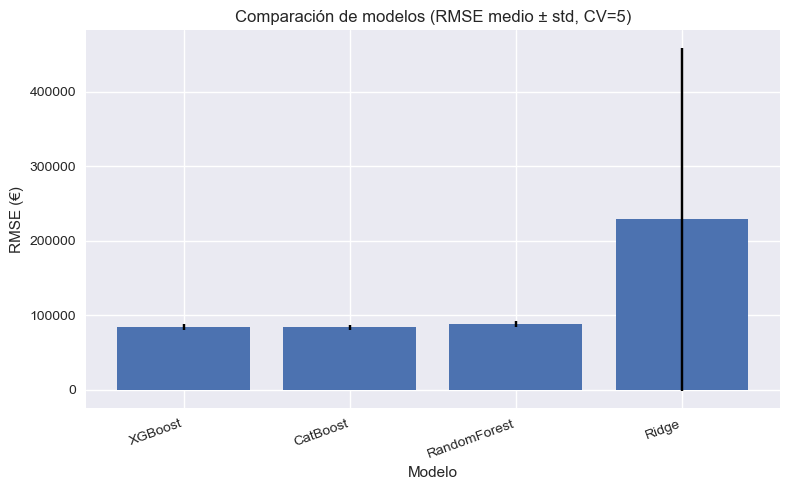

In [226]:
df_plot = results_df.sort_values("rmse_mean").copy()

plt.figure(figsize=(8,5))
plt.bar(df_plot["model"], df_plot["rmse_mean"], yerr=df_plot["rmse_std"], capsize=5)
plt.ylabel("RMSE (€)")
plt.xlabel("Modelo")
plt.xticks(rotation=20, ha="right")
plt.title("Comparación de modelos (RMSE medio ± std, CV=5)")
plt.tight_layout()
plt.show()

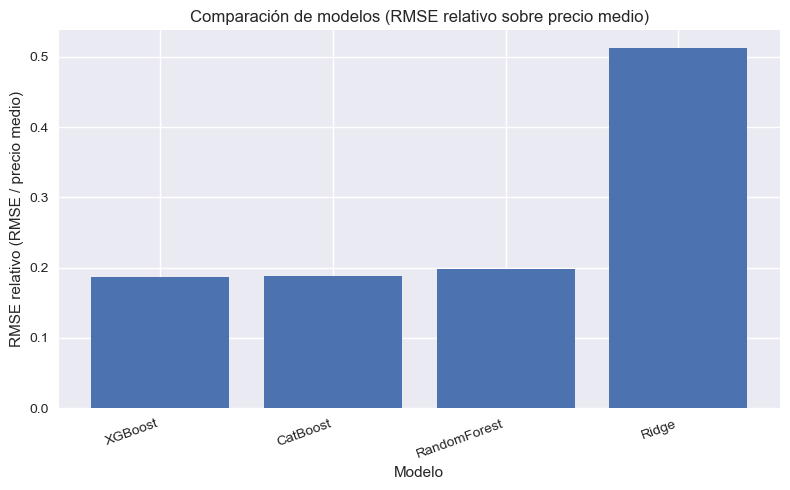

In [227]:
plt.figure(figsize=(8,5))
plt.bar(df_plot["model"], df_plot["rmse_rel_mean"])
plt.ylabel("RMSE relativo (RMSE / precio medio)")
plt.xlabel("Modelo")
plt.xticks(rotation=20, ha="right")
plt.title("Comparación de modelos (RMSE relativo sobre precio medio)")
plt.tight_layout()
plt.show()

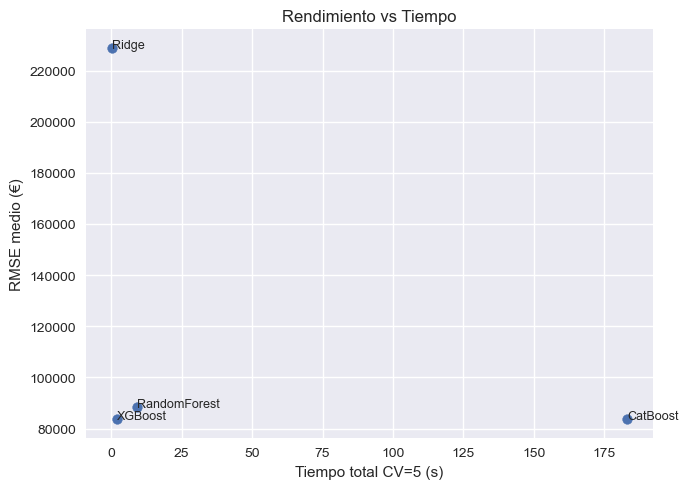

In [228]:
# Grafico tiempo ejecucion
plt.figure(figsize=(7,5))
plt.scatter(df_plot["time_sec"], df_plot["rmse_mean"])
for _, r in df_plot.iterrows():
    plt.text(r["time_sec"], r["rmse_mean"], r["model"], fontsize=9)

plt.xlabel("Tiempo total CV=5 (s)")
plt.ylabel("RMSE medio (€)")
plt.title("Rendimiento vs Tiempo")
plt.tight_layout()
plt.show()

## 4.6 Error por tramo de precio 

In [229]:
def error_por_tramo(model, X, y, price_bins):
    y_pred = model.predict(X)

    df_err = pd.DataFrame({
        "y_real": y,
        "y_pred": y_pred,
        "tramo": price_bins_test
    })

    results = (
        df_err
        .groupby("tramo")
        .apply(lambda d: mean_squared_error(d["y_real"], d["y_pred"]) ** 0.5)
        .rename("rmse")
        .reset_index()
    )

    return results

In [230]:
# Limpieza general
X_clean = X.copy()
for c in X.select_dtypes(include=["bool"]).columns:
    X_clean[c] = X_clean[c].astype(int)
for c in X.select_dtypes(include=["object"]).columns:
    X_clean[c] = X_clean[c].astype(str).fillna("missing")

In [231]:
# Se sepaara un 20% para la validación final
X_train, X_test, y_train, y_test = train_test_split(X_clean, y, test_size=0.20, random_state=42)

In [232]:
# Se seleccionan xgboost y catboost se analiza el error por tramo de precio 
# =========================================================
# Definición de tramos de precio (cuantiles)
# =========================================================

price_bins_test = pd.qcut(
    y_test,
    q=[0, 0.25, 0.5, 0.75, 1.0],
    labels=["Bajo", "Medio-bajo", "Medio-alto", "Alto"]
)

In [233]:
# =========================================================
# XGBoost - modelo final 20 % TEST
# =========================================================

final_xgb = clone(pipe_xgb)
final_xgb.fit(X_train, y_train)

# Error por tramos
err_xgb_test = error_por_tramo(
    final_xgb,
    X_test,
    y_test,
    price_bins_test
)

err_xgb_test

C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\1212404709.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\1212404709.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,tramo,rmse
0,Bajo,56551.197568
1,Medio-bajo,67085.568574
2,Medio-alto,74535.784212
3,Alto,115207.594096


In [234]:
# =========================================================
# CatBoost - modelo final 20% test
# =========================================================

final_catboost = CatBoostRegressor(
    iterations=1000,
    learning_rate=0.05,
    depth=8,
    loss_function="RMSE",
    early_stopping_rounds=30,
    random_seed=42,
    verbose=0
)

final_catboost.fit(X_train, y_train, cat_features=cat_features)

# Error por tramos
err_catboost_test = error_por_tramo(
    final_catboost,
    X_test,
    y_test,
    price_bins_test
)

err_catboost_test

C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\1212404709.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\1212404709.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,tramo,rmse
0,Bajo,56765.487330
1,Medio-bajo,61868.580880
2,Medio-alto,70236.247556
3,Alto,116275.363952


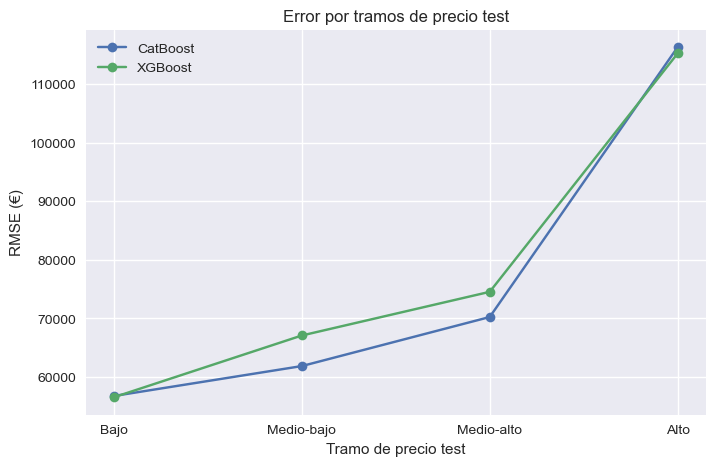

In [235]:
# Gráfico error por tramos
df_plot_error_test = err_catboost_test.merge(
    err_xgb_test,
    on="tramo",
    suffixes=("_catboost", "_xgboost")
)

plt.figure(figsize=(8, 5))
plt.plot(
    df_plot_error_test["tramo"],
    df_plot_error_test["rmse_catboost"],
    marker="o",
    label="CatBoost"
)
plt.plot(
    df_plot_error_test["tramo"],
    df_plot_error_test["rmse_xgboost"],
    marker="o",
    label="XGBoost"
)

plt.xlabel("Tramo de precio test")
plt.ylabel("RMSE (€)")
plt.title("Error por tramos de precio test")
plt.legend()
plt.grid(True)
plt.show()

In [236]:
df_plot_error_test

,tramo,rmse_catboost,rmse_xgboost
0,Bajo,56765.487330,56551.197568
1,Medio-bajo,61868.580880,67085.568574
2,Medio-alto,70236.247556,74535.784212
3,Alto,116275.363952,115207.594096


In [237]:
y_pred_test = final_catboost.predict(X_test)

# Se calcula el error porcentual
errores_relativos = (abs(y_test - y_pred_test) / y_test) * 100
print(f"Error porcentual medio: {errores_relativos.mean():.2f}%")

Error porcentual medio: 14.71%


In [238]:
# Importancia de variables de CatBoost
importancias = final_catboost.get_feature_importance()
nombres_vars = X_train.columns
df_importancia = pd.DataFrame({
    'Variable': nombres_vars,
    'Importancia': importancias
}).sort_values(by='Importancia', ascending=False)
print(df_importancia.head(10))

        Variable  Importancia
2           size    30.580045
7       latitude     9.932946
4      bathrooms     9.062889
6   neighborhood     8.254124
5       district     7.706361
10       hasLift     6.349739
8      longitude     5.972056
0          floor     4.389654
3          rooms     3.333018
1   propertyType     3.239280


C:\Users\abelmora\AppData\Local\Temp\ipykernel_53008\1062607100.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




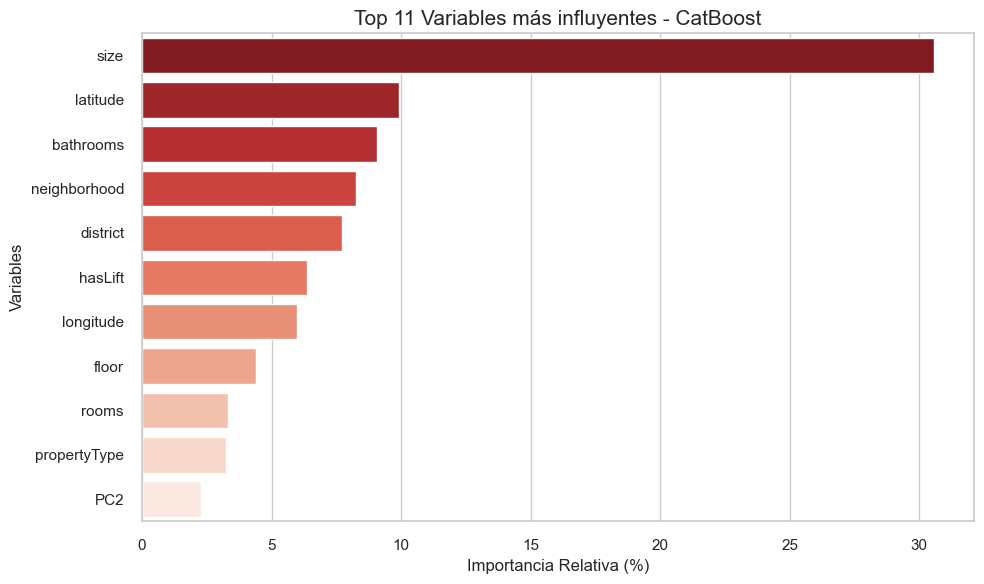

In [239]:
# Gráfico Top11 variables mas influyentes
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 6))

# Gráfico de barras
sns.barplot(
    x='Importancia', 
    y='Variable', 
    data=df_importancia.head(11),
    palette='Reds_r'
)

plt.title('Top 11 Variables más influyentes - CatBoost', fontsize=15)
plt.xlabel('Importancia Relativa (%)', fontsize=12)
plt.ylabel('Variables', fontsize=12)
plt.tight_layout()
plt.show()

In [240]:
barcelona_compraventa["district"] = (
    barcelona_compraventa["district"]
    .replace({"Horta Guinardó": "Horta-Guinardó"})
)

In [241]:
barcelona_compraventa["district"].unique()

array(['Sants-Montjuïc', 'Sant Martí', 'Gràcia', 'Eixample',
       'Sarrià-Sant Gervasi', 'Sant Andreu', 'Horta-Guinardó',
       'Les Corts', 'Nou Barris', 'Ciutat Vella'], dtype=object)

# 5. Visualización

## 5.1 Preparación datasets

In [242]:
# Categorías de interes
cat_interes = [
    'Aparcaments', 'Parades Taxi', 'Benzineres', 'Punts de recàrrega de vehicles elèctrics',
    'Autobusos diürns', 'Autobusos nocturns', "Autobus a l'aeroport", "Tren a l'aeroport",
    'Ferrocarrils Generalitat (FGC)', 'Metro i línies urbanes FGC', 'RENFE', 'Tramvia',
    'Estació Bicing' 
]

# Localizaciones del mapa

# Movilidad General 
df_geo_mov = df_movilidad[df_movilidad["secondary_filters_name"].isin(cat_interes)].copy()
df_geo_mov = df_geo_mov[['secondary_filters_name', 'name', 'addresses_district_name', 'geo_epgs_4326_lat', 'geo_epgs_4326_lon']]
df_geo_mov.columns = ['Servicio', 'Descripcion', 'Territorio', 'lat', 'lon']

# Bicing (Extracción por nombre, ya que no estaba en secondary_filters)
df_geo_bicing = df_movilidad[df_movilidad["name"].str.contains("Estació de Bicing", case=False, na=False)].copy()
df_geo_bicing = df_geo_bicing[['name', 'addresses_district_name', 'geo_epgs_4326_lat', 'geo_epgs_4326_lon']]
df_geo_bicing.columns = ['Descripcion', 'Territorio', 'lat', 'lon']
df_geo_bicing['Servicio'] = 'Estació Bicing'

# Bus y Trenes 
df_geo_bus = df_bus[['NOM_CAPA', 'EQUIPAMENT', 'NOM_DISTRICTE', 'LATITUD', 'LONGITUD']].copy()
df_geo_bus.columns = ['Servicio', 'Descripcion', 'Territorio', 'lat', 'lon']

df_geo_tren = df_trenes[['NOM_CAPA', 'EQUIPAMENT', 'NOM_DISTRICTE', 'LATITUD', 'LONGITUD']].copy()
df_geo_tren.columns = ['Servicio', 'Descripcion', 'Territorio', 'lat', 'lon']

# DF Para mapa.
df_geolocalizado = pd.concat([df_geo_mov, df_geo_bicing, df_geo_bus, df_geo_tren], ignore_index=True)

# Eliminar duplicados de nombres y coordenadas vacías
df_geolocalizado = df_geolocalizado.dropna(subset=['lat', 'lon'])
df_geolocalizado = df_geolocalizado.drop_duplicates(subset=['Descripcion', 'lat', 'lon'])

# Guardar
df_geolocalizado.to_csv('localizaciones_mapa.csv', index=False)


# DF Métricas recomendador

# Se pivota df_movilidad_total para tener una columna por cada servicio clave
df_conteos = df_movilidad_total.pivot_table(
    index='Territorio', 
    columns='NOM_CAPA', 
    values='count', 
    fill_value=0
).reset_index()

# Se simplifican nombres para el código de la App
df_conteos = df_conteos.rename(columns={
    'Aparcaments': 'n_aparcamiento',
    'Estació Bicing': 'n_bicing',
    'Metro i línies urbanes FGC': 'n_metro',
    'Autobusos diürns': 'n_bus'
})

# Merge final
df_final_tfm = pd.merge(df_distrito, df_conteos, on='Territorio', how='left')

# Se añade lat/lon promedio por distrito para centrar el mapa automáticamente
coords_centro = df_geolocalizado.groupby('Territorio')[['lat', 'lon']].mean().reset_index()
df_final_tfm = pd.merge(df_final_tfm, coords_centro, on='Territorio', how='left')

df_final_tfm.to_csv('metricas_barrios.csv', index=False)

In [243]:
df_final_tfm.head()

,Territorio,recogida_basura,limpieza_calles,ruido,circulacion,aparcamiento,autobus,metro,tranvia,bicing,...,Funicular,n_metro,Parades Taxi,Punts de recàrrega de vehicles elèctrics,RENFE,Telefèric,Tramvia,Tren a l'aeroport,lat,lon
0,Nou Barris,7.5,6.9,6.3,5.7,4.0,7.6,7.7,7.8,6.5,...,1.0,40.0,11.0,6.0,1.0,0.0,0.0,0.0,41.445744,2.176268
1,Sant Martí,7.4,6.8,6.2,5.7,4.7,7.5,7.5,7.9,6.6,...,0.0,47.0,49.0,21.0,3.0,0.0,16.0,3.0,41.406559,2.199296
2,Horta-Guinardó,7.4,6.8,6.3,5.2,3.9,7.1,7.4,7.3,6.4,...,0.0,35.0,13.0,6.0,0.0,0.0,0.0,0.0,41.424161,2.158345
3,Les Corts,7.4,6.5,6.0,5.0,4.0,7.2,7.3,7.8,6.1,...,0.0,21.0,24.0,9.0,0.0,0.0,9.0,0.0,41.386002,2.123927
4,Sants-Montjuïc,7.4,6.5,6.0,5.5,4.4,7.4,7.4,7.5,6.3,...,1.0,71.0,32.0,9.0,1.0,1.0,0.0,1.0,41.363731,2.144496


In [244]:
df_final_tfm.columns

Index(['Territorio', 'recogida_basura', 'limpieza_calles', 'ruido',
       'circulacion', 'aparcamiento', 'autobus', 'metro', 'tranvia', 'bicing',
       'seguridad_barrio', 'cambio_pasado', 'cambio_futuro',
       'prob_inseguridad', 'prob_limpieza', 'prob_acceso_vivienda',
       'prob_ruido', 'prob_turismo', 'prob_civismo', 'prob_transporte',
       'prob_mantenimiento', 'prob_aparcamiento', 'prob_comercio',
       'prob_inmigracion', 'prob_urbanismo', 'barrio_mejor_que_bcn',
       'barrio_peor_que_bcn', 'trabajadores_total', 'educ_basico', 'educ_fp',
       'educ_univ', 'nacionalidad_esp', 'nacionalidad_ue',
       'nacionalidad_no_ue', 'propiedad', 'alquiler', 'coche_si', 'moto_si',
       'ingresos_mensuales', 'precio_m2_alquiler', 'precio_m2_compra',
       'Tasa_C_Personas', 'Tasa_C_Patrimonio', 'Tasa_C_Otros',
       'Tasa_Trans_Privado', 'Tasa_Trans_Publico', 'Tasa_Movilidad_Sup',
       'n_aparcamiento', 'Autobus a l'aeroport', 'n_bus', 'Autobusos nocturns',
       'Benzine

In [245]:
df_geolocalizado.head()

,Servicio,Descripcion,Territorio,lat,lon
0,Aparcaments,Aparcament Solves,Eixample,41.396388,2.169475
1,Aparcaments,Aparcament Pac,Eixample,41.399093,2.177006
2,Aparcaments,Aparcament J. Casas,Sant Andreu,41.423517,2.189888
3,Aparcaments,Aparcament Ronda Park,Les Corts,41.381973,2.130504
4,Aparcaments,Aparcament Park-Quel,Eixample,41.378162,2.157848


In [246]:
barcelona_alquiler.head()

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has3DTour,has360,hasStaging,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,exterior,parkingSpace
0,110175843,https://img4.idealista.com/blur/480_360_mq/0/i...,17,en,1700.0,"{'price': {'amount': 1700.0, 'currencySuffix':...",flat,rent,105.0,4,...,False,False,False,{},[],False,False,False,NaN,False
1,110098950,https://img4.idealista.com/blur/480_360_mq/0/i...,20,2,1200.0,"{'price': {'amount': 1200.0, 'currencySuffix':...",flat,rent,74.0,4,...,False,False,False,{},[],False,False,False,True,False
2,110175395,https://img4.idealista.com/blur/480_360_mq/0/i...,16,1,1200.0,"{'price': {'amount': 1200.0, 'currencySuffix':...",flat,rent,73.0,2,...,False,False,False,{},[],False,False,False,True,False
3,110175408,https://img4.idealista.com/blur/480_360_mq/0/i...,5,1,1600.0,"{'price': {'amount': 1600.0, 'currencySuffix':...",flat,rent,70.0,2,...,False,False,False,{},[],False,False,False,True,False
4,110175378,https://img4.idealista.com/blur/480_360_mq/0/i...,6,1,1400.0,"{'price': {'amount': 1400.0, 'currencySuffix':...",flat,rent,69.0,2,...,False,False,False,{},[],False,False,False,True,False


In [247]:
barcelona_alquiler.columns

Index(['propertyCode', 'thumbnail', 'numPhotos', 'floor', 'price', 'priceInfo',
       'propertyType', 'operation', 'size', 'rooms', 'bathrooms', 'address',
       'province', 'municipality', 'district', 'country', 'neighborhood',
       'latitude', 'longitude', 'showAddress', 'url', 'description',
       'hasVideo', 'status', 'newDevelopment', 'hasLift', 'priceByArea',
       'change', 'detailedType', 'suggestedTexts', 'hasPlan', 'has3DTour',
       'has360', 'hasStaging', 'savedAd', 'notes', 'topNewDevelopment',
       'newDevelopmentHighlight', 'topPlus', 'exterior', 'parkingSpace'],
      dtype='object')

In [248]:
barcelona_alquiler["parkingSpace"] = (barcelona_alquiler["parkingSpace"].fillna(False))
barcelona_alquiler["parkingSpace"].map(type).value_counts()

parkingSpace
<class 'bool'>    464
<class 'str'>      36
Name: count, dtype: int64

In [249]:
barcelona_alquiler["parkingSpace"].map(type).value_counts()

parkingSpace
<class 'bool'>    464
<class 'str'>      36
Name: count, dtype: int64

In [250]:
def parse_parking_space(x):
    # Caso 1: bool
    if isinstance(x, bool):
        return x, False, np.nan  # has_parking, included, price

    # Caso 2: str con dict
    if isinstance(x, str):
        try:
            d = ast.literal_eval(x)
        except Exception:
            return False, False, np.nan

        return (
            bool(d.get("hasParkingSpace", False)),
            bool(d.get("isParkingSpaceIncludedInPrice", False)),
            float(d["parkingSpacePrice"]) if "parkingSpacePrice" in d else np.nan
        )

    return False, False, np.nan

In [251]:
parsed = barcelona_alquiler["parkingSpace"].apply(parse_parking_space)

barcelona_alquiler["has_parking"] = parsed.apply(lambda t: t[0]).astype(bool)
barcelona_alquiler["parking_included"] = parsed.apply(lambda t: t[1]).astype(bool)
barcelona_alquiler["parking_price"] = pd.to_numeric(parsed.apply(lambda t: t[2]), errors="coerce")

In [252]:
barcelona_habitaciones.head()

,propertyCode,thumbnail,numPhotos,floor,price,priceInfo,propertyType,operation,size,rooms,...,has3DTour,has360,hasStaging,isOnlineBookingActive,savedAd,notes,topNewDevelopment,newDevelopmentHighlight,topPlus,tenantGender
0,110175161,https://img4.idealista.com/blur/480_360_mq/0/i...,4,3,495.0,"{'price': {'amount': 495.0, 'currencySuffix': ...",room,rent,56.0,1,...,False,False,False,False,{},[],False,False,False,NaN
1,103894335,https://img4.idealista.com/blur/480_360_mq/0/i...,3,2,470.0,"{'price': {'amount': 470.0, 'currencySuffix': ...",room,rent,60.0,3,...,False,False,False,False,{},[],False,False,False,mixed
2,110175762,https://img4.idealista.com/blur/480_360_mq/0/i...,11,2,750.0,"{'price': {'amount': 750.0, 'currencySuffix': ...",room,rent,111.0,3,...,False,False,False,False,{},[],False,False,False,female
3,110175791,https://img4.idealista.com/blur/480_360_mq/0/i...,8,1,750.0,"{'price': {'amount': 750.0, 'currencySuffix': ...",room,rent,85.0,4,...,False,False,False,False,{},[],False,False,False,NaN
4,110175789,https://img4.idealista.com/blur/480_360_mq/0/i...,6,1,800.0,"{'price': {'amount': 800.0, 'currencySuffix': ...",room,rent,90.0,4,...,False,False,False,False,{},[],False,False,False,NaN


In [253]:
barcelona_habitaciones.columns

Index(['propertyCode', 'thumbnail', 'numPhotos', 'floor', 'price', 'priceInfo',
       'propertyType', 'operation', 'size', 'rooms', 'bathrooms', 'address',
       'province', 'municipality', 'district', 'country', 'neighborhood',
       'latitude', 'longitude', 'showAddress', 'url', 'description',
       'hasVideo', 'newDevelopment', 'tenantNumber', 'hasLift',
       'isSmokingAllowed', 'priceByArea', 'change', 'detailedType',
       'suggestedTexts', 'hasPlan', 'has3DTour', 'has360', 'hasStaging',
       'isOnlineBookingActive', 'savedAd', 'notes', 'topNewDevelopment',
       'newDevelopmentHighlight', 'topPlus', 'tenantGender'],
      dtype='object')

In [254]:
# =========================
# Barcelona alquiler – dataset para app
# =========================
cols_alquiler = [
    "propertyCode",
    "thumbnail",
    "price",
    "size",
    "rooms",
    "bathrooms",
    "district",
    "latitude",
    "longitude",
    "url",
    "has_parking",
    "parking_included",
    "parking_price",
    "priceByArea",
    "hasLift"
]

cols_alquiler = [c for c in cols_alquiler if c in barcelona_alquiler.columns]

df_alquiler_app = (
    barcelona_alquiler
    .loc[:, cols_alquiler]
    .dropna(subset=["district", "price", "size"])
    .copy()
)

# Tipos numéricos
df_alquiler_app["price"] = pd.to_numeric(df_alquiler_app["price"], errors="coerce")
df_alquiler_app["size"] = pd.to_numeric(df_alquiler_app["size"], errors="coerce")

if "rooms" in df_alquiler_app.columns:
    df_alquiler_app["rooms"] = pd.to_numeric(df_alquiler_app["rooms"], errors="coerce")
if "bathrooms" in df_alquiler_app.columns:
    df_alquiler_app["bathrooms"] = pd.to_numeric(df_alquiler_app["bathrooms"], errors="coerce")

if "priceByArea" in df_alquiler_app.columns:
    df_alquiler_app["priceByArea"] = pd.to_numeric(df_alquiler_app["priceByArea"], errors="coerce")
    
df_alquiler_app = df_alquiler_app[df_alquiler_app["size"] > 0]
df_alquiler_app = df_alquiler_app.dropna(subset=["price"])

In [255]:
# =========================
# Barcelona habitaciones – dataset para app
# =========================

cols_habitaciones = [
    "propertyCode",
    "thumbnail",
    "price",
    "size",
    "rooms",
    "bathrooms",
    "district",
    "latitude",
    "longitude",
    "url",
    "parkingSpace",
    "priceByArea",
    "hasLift",
    "tenantNumber"
]

cols_habitaciones = [c for c in cols_habitaciones if c in barcelona_habitaciones.columns]

df_habitaciones_app = (
    barcelona_habitaciones
    .loc[:, cols_habitaciones]
    .dropna(subset=["district", "price", "size"])
    .copy()
)

# Tipos
df_habitaciones_app["price"] = pd.to_numeric(df_habitaciones_app["price"], errors="coerce")
df_habitaciones_app["size"] = pd.to_numeric(df_habitaciones_app["size"], errors="coerce")
df_habitaciones_app["priceByArea"] = pd.to_numeric(df_habitaciones_app["priceByArea"], errors="coerce")
df_habitaciones_app["tenantNumber"] = pd.to_numeric(df_habitaciones_app["tenantNumber"], errors="coerce")
df_habitaciones_app = df_habitaciones_app[df_habitaciones_app["size"] > 0]
df_habitaciones_app = df_habitaciones_app.dropna(subset=["price"])


In [256]:
# =========================
# Barcelona compraventa – dataset para app
# =========================

cols_compra = [
    "propertyCode",
    "thumbnail",
    "price",
    "size",
    "rooms",
    "bathrooms",
    "district",
    "latitude",
    "longitude",
    "url",
    "parkingSpace",
    "priceByArea",
    "hasLift"
]

cols_compra = [c for c in cols_compra if c in barcelona_compraventa.columns]

df_compra_app = (
    barcelona_compraventa
    .loc[:, cols_compra]
    .dropna(subset=["district", "price", "size"])
    .copy()
)

# =========================
# Conversión de tipos numéricos
# =========================
num_cols = ["price", "size", "priceByArea"]
for c in num_cols:
    if c in df_compra_app.columns:
        df_compra_app[c] = pd.to_numeric(df_compra_app[c], errors="coerce")

df_compra_app = df_compra_app[df_compra_app["size"] > 0]
df_compra_app = df_compra_app.dropna(subset=["price"])

# =========================
# Parking (True / False)
# =========================
def parking_to_bool(x):
    if pd.isna(x):
        return False

    if isinstance(x, bool):
        return x

    if isinstance(x, dict):
        return bool(x.get("hasParkingSpace", False))

    if isinstance(x, str):
        s = x.strip().lower()
        if s == "true":
            return True
        if s == "false":
            return False
        if s.startswith("{") and s.endswith("}"):
            try:
                d = ast.literal_eval(x)
                if isinstance(d, dict):
                    return bool(d.get("hasParkingSpace", False))
            except Exception:
                return False
        return False

    return False

df_compra_app["hasParkingSpace"] = df_compra_app["parkingSpace"].apply(parking_to_bool)
df_compra_app = df_compra_app.drop(columns=["parkingSpace"])

# =========================
# Estandarizar distrito
# =========================
if "Territorio" in df_compra_app.columns:
    df_compra_app = df_compra_app.rename(columns={"Territorio": "district"})

df_compra_app = df_compra_app[
    df_compra_app["district"].astype(str).str.upper() != "BARCELONA"
].copy()

In [257]:
# =========================================================
# MACRO (nivel distrito): precio idealista + satisfacción + cluster + categoría
# =========================================================

# Precio €/m²  en Idealista por distrito
df_ideal = barcelona_compraventa.loc[:, ["district", "price", "size"]].copy()
df_ideal = df_ideal.dropna(subset=["district", "price", "size"])
df_ideal = df_ideal[df_ideal["size"] > 0]
df_ideal["price_m2_vivienda"] = df_ideal["price"] / df_ideal["size"]

df_price_district = (
    df_ideal.groupby("district")["price_m2_vivienda"]
    .mean()
    .rename("price_m2_idealista")
    .reset_index()
)

# Satisfacción (índice) desde df_final
variables_percepcion = [
    "recogida_basura", "limpieza_calles", "ruido", "circulacion",
    "aparcamiento", "autobus", "metro", "tranvia", "bicing", "seguridad_barrio"
]

df_macro = df_final.loc[:, ["Territorio", "Cluster", "precio_m2_compra"] + variables_percepcion].copy()
df_macro["satisfaccion_index"] = df_macro[variables_percepcion].mean(axis=1)
df_macro = df_macro.rename(columns={
    "Territorio": "district",
    "precio_m2_compra": "price_m2_macro"
})

# Merge macro + precio idealista por distrito
df_macro = df_macro.merge(df_price_district, on="district", how="left")

# Clasificación por cuadrantes (medianas)
sat_med = df_macro["satisfaccion_index"].median()
price_med = df_macro["price_m2_idealista"].median()

def categoria_valor(row):
    if row["satisfaccion_index"] >= sat_med and row["price_m2_idealista"] < price_med:
        return "Infravalorada (joya oculta)"
    if row["satisfaccion_index"] < sat_med and row["price_m2_idealista"] >= price_med:
        return "Sobrevalorada"
    if row["satisfaccion_index"] >= sat_med and row["price_m2_idealista"] >= price_med:
        return "Alta calidad / alto precio"
    return "Baja calidad / bajo precio"

df_macro["categoria_valor"] = df_macro.apply(categoria_valor, axis=1)

df_macro_app = df_macro[[
    "district", "Cluster", "satisfaccion_index",
    "price_m2_idealista", "price_m2_macro", "categoria_valor"
]].copy()


# =========================================================
# VIVIENDAS: etiqueta Vivienda joya / sobrevalorada / normal
# =========================================================

# Viviendas con €/m² vivienda
cols_viv = ["propertyCode", "district", "price", "size", "thumbnail", "url"]
cols_viv = [c for c in cols_viv if c in barcelona_compraventa.columns]

df_viviendas = barcelona_compraventa[cols_viv].copy()
df_viviendas = df_viviendas.dropna(subset=["district", "price", "size"])
df_viviendas = df_viviendas[df_viviendas["size"] > 0]
df_viviendas["price_m2_vivienda"] = df_viviendas["price"] / df_viviendas["size"]

# Se une con df_macro (precio idealista, cluster y categoría del distrito)
df_viviendas = df_viviendas.merge(
    df_macro_app[["district", "Cluster", "price_m2_idealista", "categoria_valor", "satisfaccion_index"]],
    on="district",
    how="left"
)

# Desviación vs media distrito (idealista)
df_viviendas["desviacion_precio"] = (
    (df_viviendas["price_m2_vivienda"] - df_viviendas["price_m2_idealista"]) / df_viviendas["price_m2_idealista"]
)

# Viviendas con umbral
threshold = 0.15  # 15%

def tipo_vivienda(row):
    cat = row["categoria_valor"]
    dev = row["desviacion_precio"]

    if (cat == "Infravalorada (joya oculta)") and (dev <= -threshold):
        return "Vivienda joya"
    if (cat == "Sobrevalorada") and (dev >= threshold):
        return "Vivienda sobrevalorada"
    return "Normal"

df_viviendas["tipo_vivienda"] = df_viviendas.apply(tipo_vivienda, axis=1)

# Dataset
df_viviendas_app = df_viviendas[[
    c for c in [
        "propertyCode","district","price","size","price_m2_vivienda",
        "price_m2_idealista","desviacion_precio","Cluster",
        "satisfaccion_index","categoria_valor","tipo_vivienda",
        "thumbnail","url"
    ] if c in df_viviendas.columns
]].copy()


# =========================================================
# Tops
# =========================================================

top_joyas = (
    df_viviendas_app[df_viviendas_app["tipo_vivienda"] == "Vivienda joya"]
    .sort_values("desviacion_precio")   # más negativa = más barata
    .head(15)
)

top_sobre = (
    df_viviendas_app[df_viviendas_app["tipo_vivienda"] == "Vivienda sobrevalorada"]
    .sort_values("desviacion_precio", ascending=False)
    .head(15)
)

top3_joyas_por_distrito = (
    df_viviendas_app[df_viviendas_app["tipo_vivienda"] == "Vivienda joya"]
    .sort_values(["district", "desviacion_precio"])
    .groupby("district")
    .head(3)
)

top3_sobre_por_distrito = (
    df_viviendas_app[df_viviendas_app["tipo_vivienda"] == "Vivienda sobrevalorada"]
    .sort_values(["district", "desviacion_precio"], ascending=[True, False])
    .groupby("district")
    .head(3)
)

print("df_macro_app:", df_macro_app.shape)
print("df_viviendas_app:", df_viviendas_app.shape)
print("top_joyas:", top_joyas.shape, "| top_sobre:", top_sobre.shape)

df_macro_app: (10, 6)
df_viviendas_app: (2607, 13)
top_joyas: (15, 13) | top_sobre: (15, 13)


In [258]:
from IPython.display import Image, display

def display_top_viviendas(df, n=5):
    for _, row in df.head(n).iterrows():
        thumb = row.get("thumbnail", None)
        if isinstance(thumb, str) and thumb.startswith("http"):
            display(Image(url=thumb))
        else:
            print("[sin thumbnail]")

        print(
            f"ID: {row['propertyCode']} | Distrito: {row['district']} | "
            f"Precio: {row['price']:,.0f} € | €/m² viv.: {row['price_m2_vivienda']:.0f} | "
            f"€/m² distrito: {row['price_m2_idealista']:.0f} | "
            f"Desviación: {row['desviacion_precio']*100:.1f}% | "
            f"Tipo: {row['tipo_vivienda']}"
        )
        print("-" * 90)

display_top_viviendas(top_joyas, n=5)
display_top_viviendas(top_sobre, n=5)

ID: 110169474 | Distrito: Sants-Montjuïc | Precio: 125,000 € | €/m² viv.: 1344 | €/m² distrito: 4734 | Desviación: -71.6% | Tipo: Vivienda joya
------------------------------------------------------------------------------------------


ID: 109952385 | Distrito: Horta-Guinardó | Precio: 159,900 € | €/m² viv.: 1355 | €/m² distrito: 4308 | Desviación: -68.5% | Tipo: Vivienda joya
------------------------------------------------------------------------------------------


ID: 110123295 | Distrito: Horta-Guinardó | Precio: 480,000 € | €/m² viv.: 1395 | €/m² distrito: 4308 | Desviación: -67.6% | Tipo: Vivienda joya
------------------------------------------------------------------------------------------


ID: 110113627 | Distrito: Sants-Montjuïc | Precio: 350,000 € | €/m² viv.: 1651 | €/m² distrito: 4734 | Desviación: -65.1% | Tipo: Vivienda joya
------------------------------------------------------------------------------------------


ID: 109693053 | Distrito: Sant Andreu | Precio: 124,000 € | €/m² viv.: 1632 | €/m² distrito: 4326 | Desviación: -62.3% | Tipo: Vivienda joya
------------------------------------------------------------------------------------------


ID: 110132132 | Distrito: Gràcia | Precio: 785,000 € | €/m² viv.: 11214 | €/m² distrito: 5647 | Desviación: 98.6% | Tipo: Vivienda sobrevalorada
------------------------------------------------------------------------------------------


ID: 110153106 | Distrito: Eixample | Precio: 829,000 € | €/m² viv.: 11843 | €/m² distrito: 6280 | Desviación: 88.6% | Tipo: Vivienda sobrevalorada
------------------------------------------------------------------------------------------


ID: 110153257 | Distrito: Eixample | Precio: 829,000 € | €/m² viv.: 11676 | €/m² distrito: 6280 | Desviación: 85.9% | Tipo: Vivienda sobrevalorada
------------------------------------------------------------------------------------------


ID: 110078292 | Distrito: Gràcia | Precio: 425,000 € | €/m² viv.: 10366 | €/m² distrito: 5647 | Desviación: 83.6% | Tipo: Vivienda sobrevalorada
------------------------------------------------------------------------------------------


ID: 110016186 | Distrito: Eixample | Precio: 870,000 € | €/m² viv.: 11299 | €/m² distrito: 6280 | Desviación: 79.9% | Tipo: Vivienda sobrevalorada
------------------------------------------------------------------------------------------


In [259]:
df_macro_app.head()

,district,Cluster,satisfaccion_index,price_m2_idealista,price_m2_macro,categoria_valor
0,Nou Barris,2,6.58,3356.928495,2884,Infravalorada (joya oculta)
1,Sant Martí,2,6.62,4845.624190,4899,Alta calidad / alto precio
2,Horta-Guinardó,2,6.41,4308.073409,3834,Infravalorada (joya oculta)
3,Les Corts,0,6.39,6057.735022,6196,Sobrevalorada
4,Sants-Montjuïc,2,6.42,4734.364940,4408,Infravalorada (joya oculta)


In [260]:
df_viviendas_app.head()

,propertyCode,district,price,size,price_m2_vivienda,price_m2_idealista,desviacion_precio,Cluster,satisfaccion_index,categoria_valor,tipo_vivienda,thumbnail,url
0,110175870,Sants-Montjuïc,467000.0,106.0,4405.660377,4734.364940,-0.069429,2,6.42,Infravalorada (joya oculta),Normal,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110175870/
1,108908893,Sants-Montjuïc,330000.0,87.0,3793.103448,4734.364940,-0.198815,2,6.42,Infravalorada (joya oculta),Vivienda joya,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/108908893/
2,110175646,Sant Martí,330000.0,61.0,5409.836066,4845.624190,0.116437,2,6.62,Alta calidad / alto precio,Normal,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110175646/
3,110175552,Gràcia,498000.0,102.0,4882.352941,5646.996989,-0.135407,0,6.33,Sobrevalorada,Normal,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110175552/
4,110175550,Eixample,425000.0,75.0,5666.666667,6279.984188,-0.097662,0,6.39,Sobrevalorada,Normal,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110175550/


In [261]:
top_joyas.head()

,propertyCode,district,price,size,price_m2_vivienda,price_m2_idealista,desviacion_precio,Cluster,satisfaccion_index,categoria_valor,tipo_vivienda,thumbnail,url
80,110169474,Sants-Montjuïc,125000.0,93.0,1344.086022,4734.364940,-0.716100,2,6.42,Infravalorada (joya oculta),Vivienda joya,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110169474/
2405,109952385,Horta-Guinardó,159900.0,118.0,1355.084746,4308.073409,-0.685455,2,6.41,Infravalorada (joya oculta),Vivienda joya,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/109952385/
698,110123295,Horta-Guinardó,480000.0,344.0,1395.348837,4308.073409,-0.676108,2,6.41,Infravalorada (joya oculta),Vivienda joya,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110123295/
825,110113627,Sants-Montjuïc,350000.0,212.0,1650.943396,4734.364940,-0.651285,2,6.42,Infravalorada (joya oculta),Vivienda joya,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/110113627/
2368,109693053,Sant Andreu,124000.0,76.0,1631.578947,4325.949054,-0.622839,2,6.41,Infravalorada (joya oculta),Vivienda joya,https://img4.idealista.com/blur/480_360_mq/0/i...,https://www.idealista.com/inmueble/109693053/


In [262]:
# =========================
# Copia base
# =========================
df_perfil = df_distrito.copy()
df_perfil = df_perfil[df_perfil["Territorio"].str.upper() != "BARCELONA"].copy()

# =========================
# Variables
# =========================

# "Más alto = mejor"
vars_mejor_alto = [
    "limpieza_calles",
    "recogida_basura",
    "seguridad_barrio",
    "metro", "autobus", "tranvia", "bicing",
    "ingresos_mensuales",
    "educ_univ",
    "propiedad"
]

# "Más alto = peor" 
vars_peor_alto = [
    "prob_inseguridad",
    "prob_ruido",
    "prob_limpieza",
    "prob_transporte",
    "prob_aparcamiento",
    "prob_mantenimiento",
    "prob_urbanismo",
    "prob_comercio",
    "prob_inmigracion",
    "prob_turismo",
    "Tasa_C_Personas",
    "Tasa_C_Patrimonio",
    "Tasa_C_Otros"
]

# Movilidad  alto=mejor
vars_conectividad = [
    "Tasa_Trans_Publico",
    "Tasa_Trans_Privado",
    "Tasa_Movilidad_Sup"
]
all_vars = [v for v in (vars_mejor_alto + vars_peor_alto + vars_conectividad) if v in df_perfil.columns]

# =========================
# Función bajo, medio, alto
# =========================
def to_terciles(series, labels=("Bajo", "Medio", "Alto")):
    s = series.astype(float)
    try:
        out = pd.qcut(s, q=3, labels=labels, duplicates="drop")
        if out.isna().any():
            raise ValueError("qcut devolvió NaNs por bins duplicados")
        return out.astype(str)
    except Exception:
        return pd.cut(s, bins=3, labels=labels, include_lowest=True).astype(str)

# =========================
# Columnas etiquetadas
# =========================

# Mejor cuando es alto
for v in vars_mejor_alto:
    if v in df_perfil.columns:
        df_perfil[f"lvl_{v}"] = to_terciles(df_perfil[v], labels=("Bajo", "Medio", "Alto"))

# Peor cuando es alto 
for v in vars_peor_alto:
    if v in df_perfil.columns:
        df_perfil[f"lvl_{v}"] = to_terciles(df_perfil[v], labels=("Bajo", "Medio", "Alto"))

# Conectividad (alto=mejor)
for v in vars_conectividad:
    if v in df_perfil.columns:
        df_perfil[f"lvl_{v}"] = to_terciles(df_perfil[v], labels=("Bajo", "Medio", "Alto"))

# =========================
# Nivel para Streamlit
# =========================
cols_out = ["Territorio"] + [c for c in df_perfil.columns if c.startswith("lvl_")]

df_perfil_streamlit = df_perfil[cols_out].copy()
df_perfil_streamlit.head()

,Territorio,lvl_limpieza_calles,lvl_recogida_basura,lvl_seguridad_barrio,lvl_metro,lvl_autobus,lvl_tranvia,lvl_bicing,lvl_ingresos_mensuales,lvl_educ_univ,...,lvl_prob_urbanismo,lvl_prob_comercio,lvl_prob_inmigracion,lvl_prob_turismo,lvl_Tasa_C_Personas,lvl_Tasa_C_Patrimonio,lvl_Tasa_C_Otros,lvl_Tasa_Trans_Publico,lvl_Tasa_Trans_Privado,lvl_Tasa_Movilidad_Sup
0,Nou Barris,Alto,Alto,Bajo,Alto,Alto,Medio,Medio,Bajo,Bajo,...,Alto,Bajo,Alto,Bajo,Medio,Bajo,Medio,Medio,Bajo,Medio
1,Sant Martí,Medio,Medio,Bajo,Alto,Medio,Alto,Alto,Medio,Bajo,...,Medio,Alto,Alto,Alto,Medio,Medio,Medio,Alto,Medio,Alto
2,Horta-Guinardó,Medio,Medio,Medio,Medio,Bajo,Bajo,Medio,Medio,Bajo,...,Alto,Alto,Medio,Medio,Medio,Bajo,Bajo,Bajo,Bajo,Bajo
3,Les Corts,Bajo,Medio,Alto,Bajo,Bajo,Medio,Bajo,Alto,Alto,...,Alto,Medio,Bajo,Bajo,Bajo,Medio,Alto,Medio,Alto,Medio
4,Sants-Montjuïc,Bajo,Medio,Bajo,Medio,Medio,Bajo,Bajo,Bajo,Medio,...,Medio,Bajo,Medio,Medio,Alto,Alto,Alto,Bajo,Bajo,Bajo


## 5.2 Guardar datos formato parquet y modelo

In [263]:
OUT_DATA = Path("data_app")
OUT_MODELS = Path("models")
OUT_DATA.mkdir(exist_ok=True)
OUT_MODELS.mkdir(exist_ok=True)

# =========================
# Asignar nombres 
# =========================
metrics_app = df_final_tfm.copy()                 # distrito + lat/lon + conteos + precios/tasas
perfil_app = df_perfil_streamlit.copy()           # niveles Alto/Medio/Bajo
geo_app = df_geolocalizado.copy()                 # POIs
macro_valor_app = df_macro_app.copy()             # scatter cuadrantes
viviendas_app = df_viviendas_app.copy()           # joyas/sobre (COMPRA)

# Idealista
compra_app = df_compra_app.copy()                 # anuncios compra
alquiler_app = df_alquiler_app.copy()             # anuncios alquiler
habitaciones_app = df_habitaciones_app.copy()     # anuncios habitaciones

imp_app = df_importancia.copy() if "df_importancia" in globals() else None
rmse_app = df_plot_error_test.copy() if "df_plot_error_test" in globals() else None

# =========================
# Estandarizar nombres de columnas
# =========================
def standardize_district_col(df):
    if "Territorio" in df.columns:
        df = df.rename(columns={"Territorio": "district"})
    return df

metrics_app = standardize_district_col(metrics_app)
perfil_app  = standardize_district_col(perfil_app)
geo_app     = standardize_district_col(geo_app)
macro_valor_app = standardize_district_col(macro_valor_app)
viviendas_app   = standardize_district_col(viviendas_app)
compra_app      = standardize_district_col(compra_app)
alquiler_app    = standardize_district_col(alquiler_app)
habitaciones_app= standardize_district_col(habitaciones_app)

# En geo_app: estandarizar columnas
geo_app = geo_app.rename(columns={"Servicio": "service", "Descripcion": "desc"})

# =========================
# Filtrar BARCELONA 
# =========================
def drop_barcelona(df):
    if "district" in df.columns:
        return df[df["district"].astype(str).str.upper() != "BARCELONA"].copy()
    return df

metrics_app = drop_barcelona(metrics_app)
perfil_app = drop_barcelona(perfil_app)
geo_app = drop_barcelona(geo_app)
macro_valor_app = drop_barcelona(macro_valor_app)
viviendas_app = drop_barcelona(viviendas_app)
compra_app = drop_barcelona(compra_app)
alquiler_app = drop_barcelona(alquiler_app)
habitaciones_app = drop_barcelona(habitaciones_app)

# =========================
# Guardar Parquets
# =========================
metrics_app.to_parquet(OUT_DATA / "metrics_app.parquet", index=False)
perfil_app.to_parquet(OUT_DATA / "perfil_app.parquet", index=False)
geo_app.to_parquet(OUT_DATA / "geo_app.parquet", index=False)
macro_valor_app.to_parquet(OUT_DATA / "macro_valor_app.parquet", index=False)
viviendas_app.to_parquet(OUT_DATA / "viviendas_app.parquet", index=False)

# Datasets Idealista a parquets
compra_app.to_parquet(OUT_DATA / "compra_app.parquet", index=False)
alquiler_app.to_parquet(OUT_DATA / "alquiler_app.parquet", index=False)
habitaciones_app.to_parquet(OUT_DATA / "habitaciones_app.parquet", index=False)

if imp_app is not None:
    imp_app.to_parquet(OUT_DATA / "importancia_app.parquet", index=False)
if rmse_app is not None:
    rmse_app.to_parquet(OUT_DATA / "rmse_app.parquet", index=False)

# =========================
# Guardar modelo CatBoost
# =========================
if "final_catboost" in globals() and hasattr(final_catboost, "is_fitted") and final_catboost.is_fitted():
    final_catboost.save_model(str(OUT_MODELS / "catboost_model.cbm"))
else:
    print(" Modelo CatBoost no guardado: no existe o no está entrenado (is_fitted=False).")

# =========================
# Report
# =========================
print(" Archivos generados:")
for p in sorted(OUT_DATA.glob("*.parquet")):
    print(" -", p)

if (OUT_MODELS / "catboost_model.cbm").exists():
    print(" -", OUT_MODELS / "catboost_model.cbm")


 Archivos generados:
 - data_app\alquiler_app.parquet
 - data_app\compra_app.parquet
 - data_app\geo_app.parquet
 - data_app\habitaciones_app.parquet
 - data_app\importancia_app.parquet
 - data_app\macro_valor_app.parquet
 - data_app\metrics_app.parquet
 - data_app\perfil_app.parquet
 - data_app\rmse_app.parquet
 - data_app\viviendas_app.parquet
 - models\catboost_model.cbm


Con los parquets, y modelo guardado en las carpetas se realiza código de la aplicación en otro Jupiter Notebook donde cargará los parquets y modelos creados.